In [5]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

## 1. Read raw datacube and remove background & fringe

In [6]:
Raw_Datacube = Read_Raw_Datacube("/home/qliu/data/A2390C4new.fits",name="A2390C")
Raw_Datacube.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2064                                                  
NAXIS3  =                  124                                                  
EXTEND  =                    T                                                  
DATE    = '2017-09-29'         / Creation date                                  
MASK    = 'False   '                                                            
FILETYPE= 'Calibrated Spectrum Cube' / Type of file                             
OBSERVAT= 'CFHT    '           / Observatory name                               
TELESCOP= 'CFHT 3.6m'          / Hawaii Big Island, Mauna Kea                   
INSTRUME= 'SITELLE '        

In [7]:
Raw_Datacube.hdu[0].shape

(124, 2064, 2048)

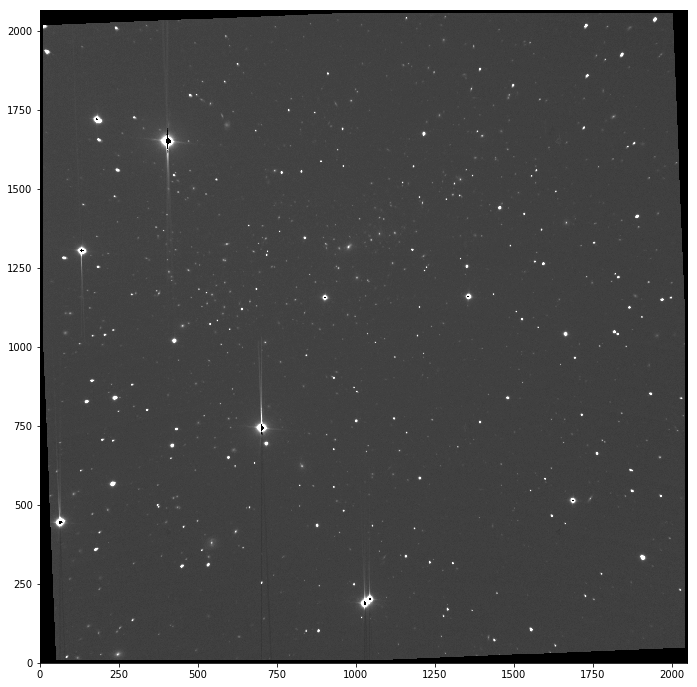

In [4]:
Raw_Datacube.display(Raw_Datacube.raw_stack_field)

In [9]:
Raw_Datacube.save_mask_edge(save_path='/home/qliu/data/')

In [5]:
Raw_Datacube.remove_background(save_path='./A2390C/fig/bkg/', plot=False)

Removing background...Frame: 10
Removing background...Frame: 20
Removing background...Frame: 30
Removing background...Frame: 40
Removing background...Frame: 50


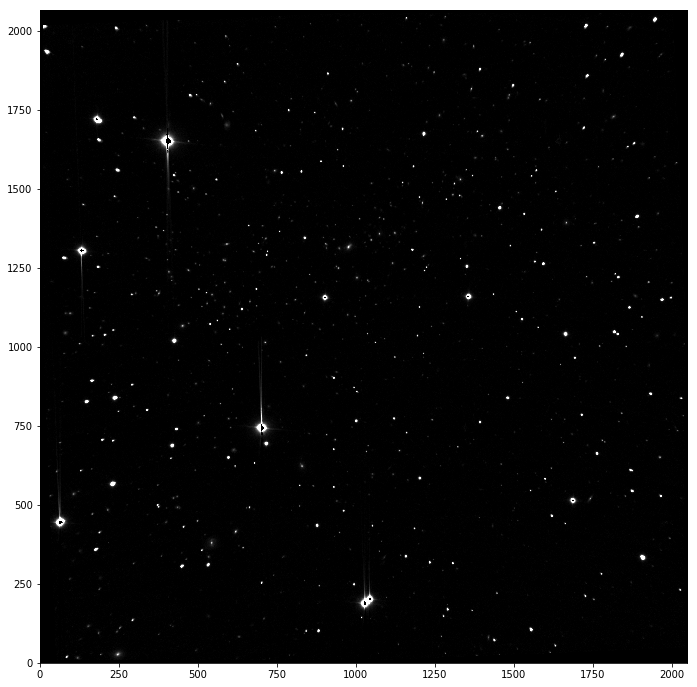

In [6]:
Raw_Datacube.display(Raw_Datacube.stack_field)

In [7]:
Raw_Datacube.remove_fringe(skip_frames=range(6,51), save_path='./A2390C/fig/bkg/', plot=False)

Removing fringe...Frame: 10
Removing fringe...Frame: 20
Removing fringe...Frame: 30
Removing fringe...Frame: 40
Removing fringe...Frame: 50


In [8]:
Raw_Datacube.save_fits(save_path='/home/qliu/data/')

Saving background & fringe subtracted datacube and stacked field...


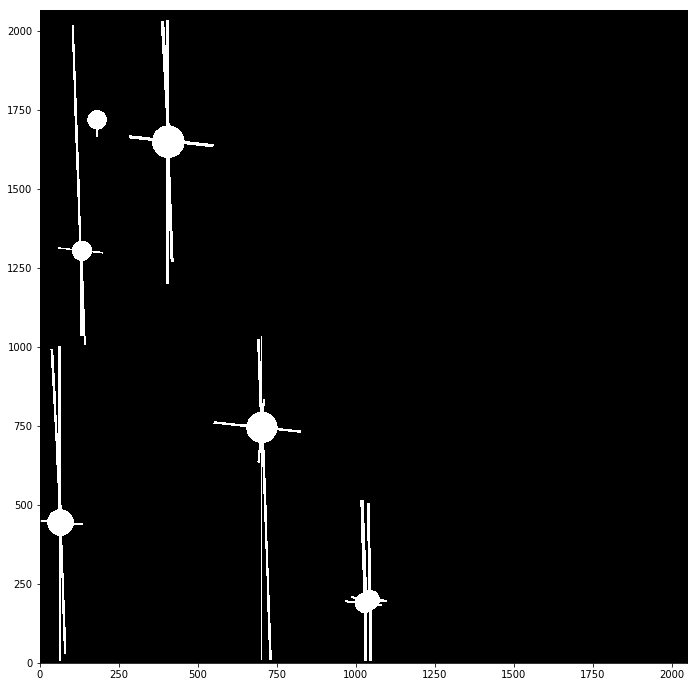

In [3]:
Raw_Datacube.save_weight_map(region_path="./A2390C/A2390C.reg", weight=0.01, 
                             save_path = './A2390C/SE/')
Raw_Datacube.display(Raw_Datacube.mymask,vmax=None)

## 2. Calculate seeing FWHM

In [2]:
Datacube = Read_Datacube("/home/qliu/data/A2390C_cube.fits",name="A2390C",SE_catalog="./A2390C/SE/A2390C_run1.cat")

/home/qliu/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:794: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


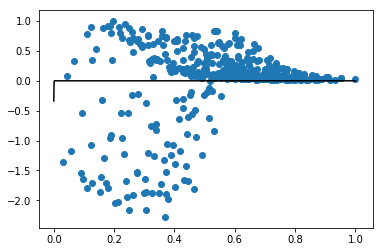

0.004619522729195114


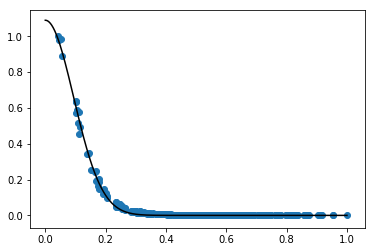

1.049505641377395


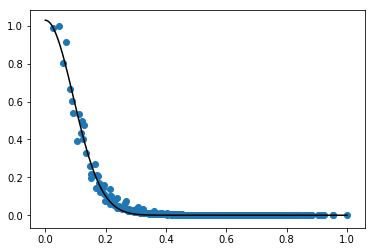

1.0548868342339648


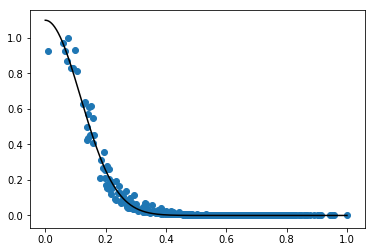

1.3227566683062189


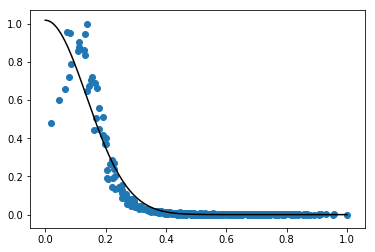

1.5625357445614771


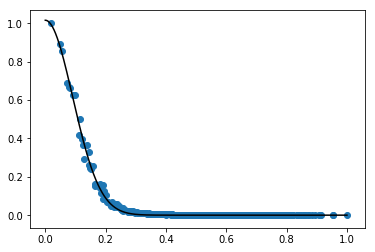

1.0492513635845737


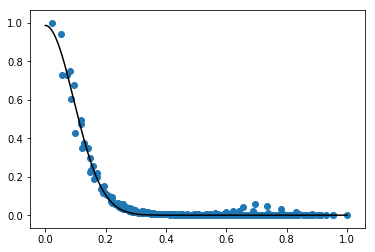

1.0678142883149295


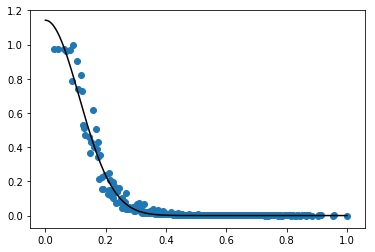

1.2911853474365897


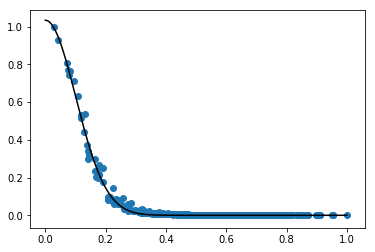

1.1164952347674046


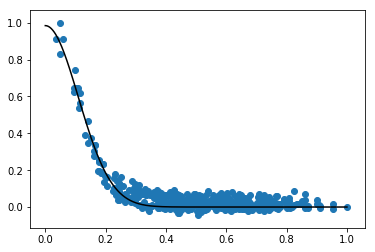

1.245061940839778


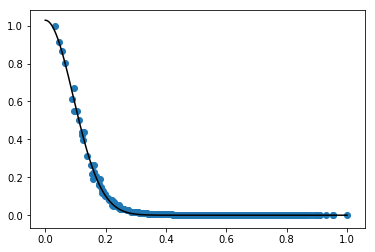

1.0409108738811208


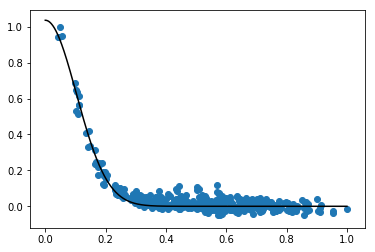

1.1602701685351258


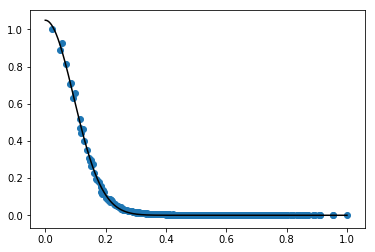

1.0858865154539756


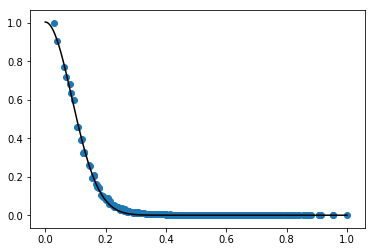

1.01443468892268


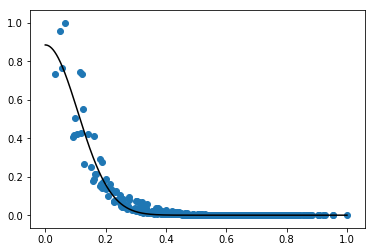

1.1952033114996905
Median seeing FWHM in arcsec: 1.086


In [4]:
Datacube.calculate_seeing(mag_cut=0.2, plot=True)

## 3. Spectra Extraction

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *
Datacube = Read_Datacube("/home/qliu/data/A2390C_cube.fits",name="A2390C",SE_catalog="./A2390C/SE/A2390C_run3.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2390C_mask.fits')
Datacube.read_seg('./A2390C/SE/segment_run3.fits')

Optimal Aperture: 1.4 Rp, SNR = 6.9660


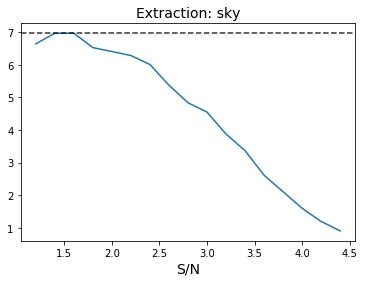

Optimal Aperture: 2.2 Rp, SNR = 3.0592


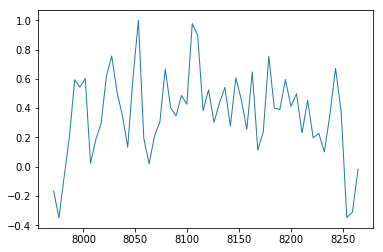

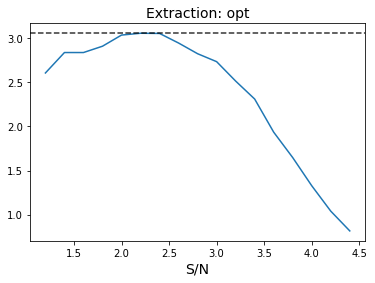

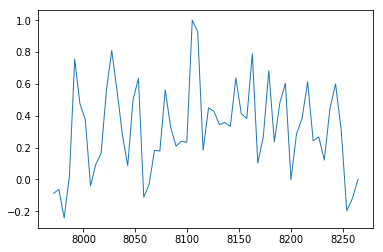

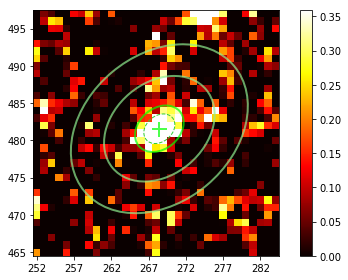

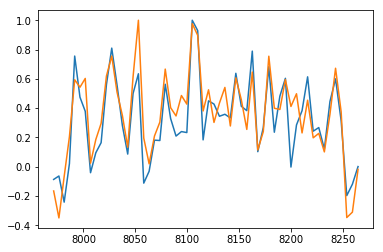

In [4]:
# Example
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=438, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=438, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

Optimal Aperture: 2.0 Rp, SNR = 2.0266


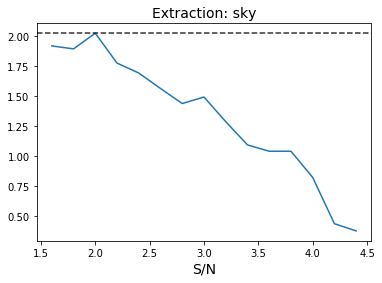

Optimal Aperture: 2.0 Rp, SNR = 1.2603


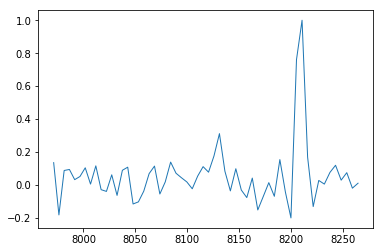

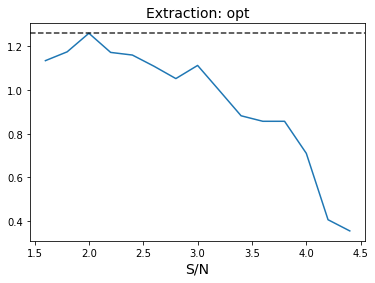

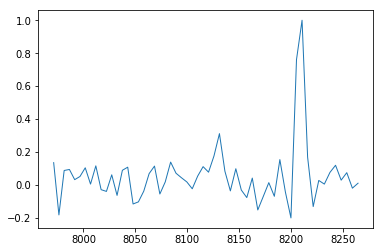

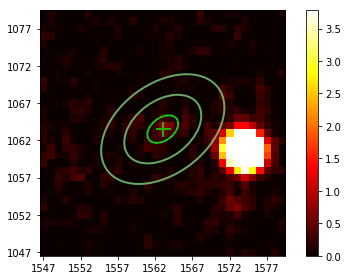

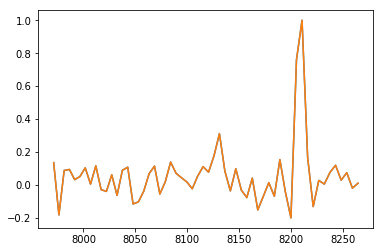

In [12]:
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=2136, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=2136, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

Optimal Aperture: 1.0 Rp, SNR = 262.8639


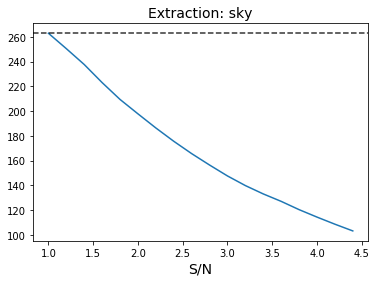

Optimal Aperture: 2.8 Rp, SNR = 42.8801


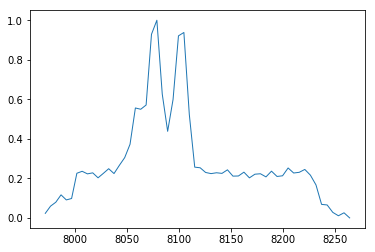

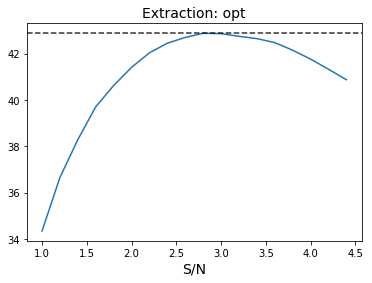

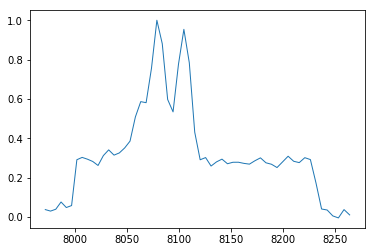

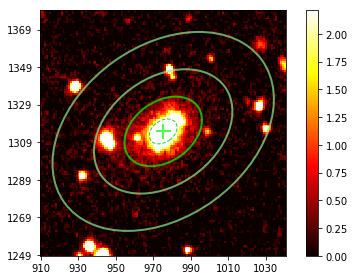

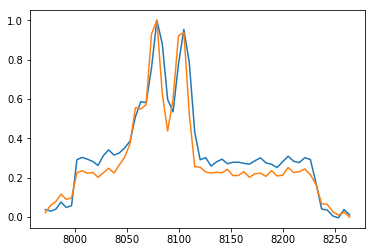

In [28]:
id_BCG = np.argmin((Datacube.Tab_SE["X_IMAGE"]-980)**2 + (Datacube.Tab_SE["Y_IMAGE"]-1315)**2) + 1
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=id_BCG, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=id_BCG, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

2136
Optimal Aperture: 2.0 Rp, SNR = 2.0266


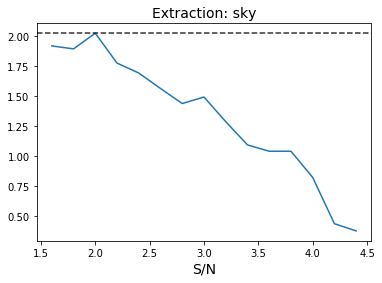

Optimal Aperture: 2.0 Rp, SNR = 1.2603


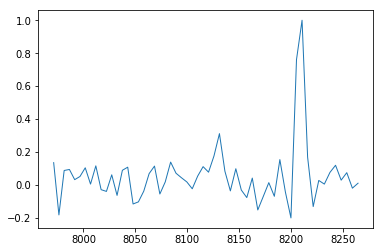

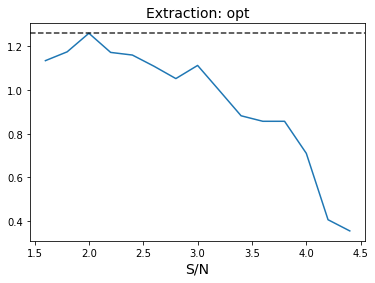

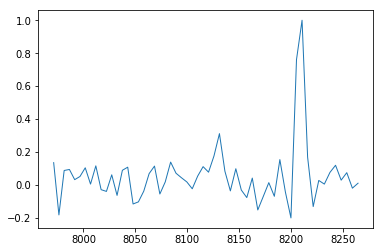

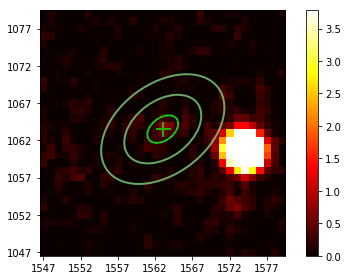

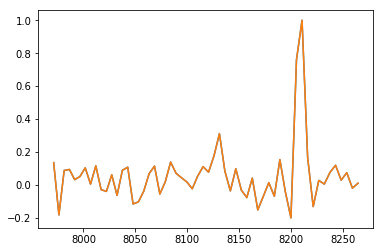

In [6]:
ind = np.argmin((Datacube.Tab_SE["X_IMAGE"]-1564)**2 + (Datacube.Tab_SE["Y_IMAGE"]-1064)**2) + 1
print(ind)
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=ind, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=ind, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

In [2]:
Datacube.spec_extraction_all(ks = np.arange(1.,4.6,0.1), k1=5., k2=8., save_path='./A2390C/fig/img_thumb_v2/', display=False)

#1 spectra extracted
#2 spectra extracted
#3 spectra extracted
#4 spectra extracted
#5 spectra extracted
#6 spectra extracted
#7 spectra extracted
#8 spectra extracted
#9 spectra extracted
#10 spectra extracted
#11 spectra extracted
#12 spectra extracted
#13 spectra extracted
#14 spectra extracted
#15 spectra extracted
#16 spectra extracted
#17 spectra extracted
#18 spectra extracted
#19 spectra extracted
#20 spectra extracted
#21 spectra extracted
#22 spectra extracted
#23 spectra extracted
#24 spectra extracted
#25 spectra extracted
#26 spectra extracted
#27 spectra extracted
#28 spectra extracted
#29 spectra extracted
#30 spectra extracted
#31 spectra extracted
#32 spectra extracted
#33 spectra extracted
#34 spectra extracted
#35 spectra extracted
#36 spectra extracted
#37 spectra extracted
#38 spectra extracted
#39 spectra extracted
#40 spectra extracted
#41 spectra extracted
#42 spectra extracted
#43 spectra extracted
#44 spectra extracted
#45 spectra extracted
#46 spectra extract

#363 spectra extracted
#364 spectra extracted
#365 spectra extracted
#366 spectra extracted
#367 spectra extracted
#368 spectra extracted
#369 spectra extracted
#370 spectra extracted
#371 spectra extracted
#372 spectra extracted
#373 spectra extracted
#374 spectra extracted
#375 spectra extracted
#376 spectra extracted
#377 spectra extracted
#378 spectra extracted
#379 spectra extracted
#380 spectra extracted
#381 spectra extracted
#382 spectra extracted
#383 spectra extracted
#384 spectra extracted
#385 spectra extracted
#386 spectra extracted
#387 spectra extracted
#388 spectra extracted
#389 spectra extracted
#390 spectra extracted
#391 spectra extracted
#392 spectra extracted
#393 spectra extracted
#394 spectra extracted
#395 spectra extracted
#396 spectra extracted
#397 spectra extracted
#398 spectra extracted
#399 spectra extracted
#400 spectra extracted
#401 spectra extracted
#402 spectra extracted
#403 spectra extracted
#404 spectra extracted
#405 spectra extracted
#406 spectr

#720 spectra extracted
#721 spectra extracted
#722 spectra extracted
#723 spectra extracted
#724 spectra extracted
#725 spectra extracted
#726 spectra extracted
#727 spectra extracted
#728 spectra extracted
#729 spectra extracted
#730 spectra extracted
#731 spectra extracted
#732 spectra extracted
#733 spectra extracted
#734 spectra extracted
#735 spectra extracted
#736 spectra extracted
#737 spectra extracted
#738 spectra extracted
#739 spectra extracted
#740 spectra extracted
#741 spectra extracted
#742 spectra extracted
#743 spectra extracted
#744 spectra extracted
#745 spectra extracted
#746 spectra extracted
#747 spectra extracted
#748 spectra extracted
#749 spectra extracted
#750 spectra extracted
#751 spectra extracted
#752 spectra extracted
#753 spectra extracted
#754 spectra extracted
#755 spectra extracted
#756 spectra extracted
#757 spectra extracted
#758 spectra extracted
#759 spectra extracted
#760 spectra extracted
#761 spectra extracted
#762 spectra extracted
#763 spectr

#1074 spectra extracted
#1075 spectra extracted
#1076 spectra extracted
#1077 spectra extracted
#1078 spectra extracted
#1079 spectra extracted
#1080 spectra extracted
#1081 spectra extracted
#1082 spectra extracted
#1083 spectra extracted
#1084 spectra extracted
#1085 spectra extracted
#1086 spectra extracted
#1087 spectra extracted
#1088 spectra extracted
#1089 spectra extracted
#1090 spectra extracted
#1091 spectra extracted
#1092 spectra extracted
#1093 spectra extracted
#1094 spectra extracted
#1095 spectra extracted
#1096 spectra extracted
#1097 spectra extracted
#1098 spectra extracted
#1099 spectra extracted
#1100 spectra extracted
#1101 spectra extracted
#1102 spectra extracted
#1103 spectra extracted
#1104 spectra extracted
#1105 spectra extracted
#1106 spectra extracted
#1107 spectra extracted
#1108 spectra extracted
#1109 spectra extracted
#1110 spectra extracted
#1111 spectra extracted
#1112 spectra extracted
#1113 spectra extracted
#1114 spectra extracted
#1115 spectra ex

#1418 spectra extracted
#1419 spectra extracted
#1420 spectra extracted
#1421 spectra extracted
#1422 spectra extracted
#1423 spectra extracted
#1424 spectra extracted
#1425 spectra extracted
#1426 spectra extracted
#1427 spectra extracted
#1428 spectra extracted
#1429 spectra extracted
#1430 spectra extracted
#1431 spectra extracted
#1432 spectra extracted
#1433 spectra extracted
#1434 spectra extracted
#1435 spectra extracted
#1436 spectra extracted
#1437 spectra extracted
#1438 spectra extracted
#1439 spectra extracted
#1440 spectra extracted
#1441 spectra extracted
#1442 spectra extracted
#1443 spectra extracted
#1444 spectra extracted
#1445 spectra extracted
#1446 spectra extracted
#1447 spectra extracted
#1448 spectra extracted
#1449 spectra extracted
#1450 spectra extracted
#1451 spectra extracted
#1452 spectra extracted
#1453 spectra extracted
#1454 spectra extracted
#1455 spectra extracted
#1456 spectra extracted
#1457 spectra extracted
#1458 spectra extracted
#1459 spectra ex

#1762 spectra extracted
#1763 spectra extracted
#1764 spectra extracted
#1765 spectra extracted
#1766 spectra extracted
#1767 spectra extracted
#1768 spectra extracted
#1769 spectra extracted
#1770 spectra extracted
#1771 spectra extracted
#1772 spectra extracted
#1773 spectra extracted
#1774 spectra extracted
#1775 spectra extracted
#1776 spectra extracted
#1777 spectra extracted
#1778 spectra extracted
#1779 spectra extracted
#1780 spectra extracted
#1781 spectra extracted
#1782 spectra extracted
#1783 spectra extracted
#1784 spectra extracted
#1785 spectra extracted
#1786 spectra extracted
#1787 spectra extracted
#1788 spectra extracted
#1789 spectra extracted
#1790 spectra extracted
#1791 spectra extracted
#1792 spectra extracted
#1793 spectra extracted
#1794 spectra extracted
#1795 spectra extracted
#1796 spectra extracted
#1797 spectra extracted
#1798 spectra extracted
#1799 spectra extracted
#1800 spectra extracted
#1801 spectra extracted
#1802 spectra extracted
#1803 spectra ex

#2104 spectra extracted
#2105 spectra extracted
#2106 spectra extracted
#2107 spectra extracted
#2108 spectra extracted
#2109 spectra extracted
#2110 spectra extracted
#2111 spectra extracted
#2112 spectra extracted
#2113 spectra extracted
#2114 spectra extracted
#2115 spectra extracted
#2116 spectra extracted
#2117 spectra extracted
#2118 spectra extracted
#2119 spectra extracted
#2120 spectra extracted
#2121 spectra extracted
#2122 spectra extracted
#2123 spectra extracted
#2124 spectra extracted
#2125 spectra extracted
#2126 spectra extracted
#2127 spectra extracted
#2128 spectra extracted
#2129 spectra extracted
#2130 spectra extracted
#2131 spectra extracted
#2132 spectra extracted
#2133 spectra extracted
#2134 spectra extracted
#2135 spectra extracted
#2136 spectra extracted
#2137 spectra extracted
#2138 spectra extracted
#2139 spectra extracted
#2140 spectra extracted
#2141 spectra extracted
#2142 spectra extracted
#2143 spectra extracted
#2144 spectra extracted
#2145 spectra ex

In [3]:
Datacube.save_spec_plot(save_path='./A2390C/fig/spec_v2/')
Datacube.save_spec_fits(save_path='./A2390C/', suffix="_v2")

## Cross-correlation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390C_cube.fits", name="A2390C", z0=0.228, SE_catalog="./A2390C/SE/A2390C_run3.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2390C_mask.fits')
Datacube.read_seg('./A2390C/SE/segment_run3.fits')
Datacube.read_spec('./A2390C/A2390C-spec_v2.fits')

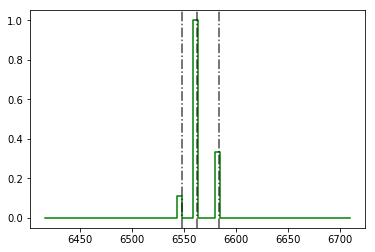

(200, 57)

In [2]:
# Delta Template
Datacube.generate_template(width=5, number=200, model='box')
Datacube.temps.shape

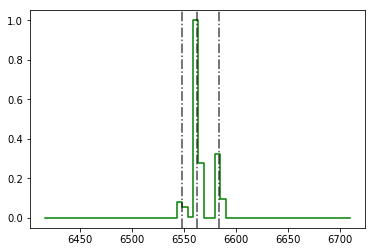

(300, 57)

In [3]:
# Gaussian Template
Datacube.generate_template(number=300, model='gaussian')
Datacube.temps.shape

### Candidates that are missed in my sample

SE Objects #1686   S/N med: 12.3  max: 12.5


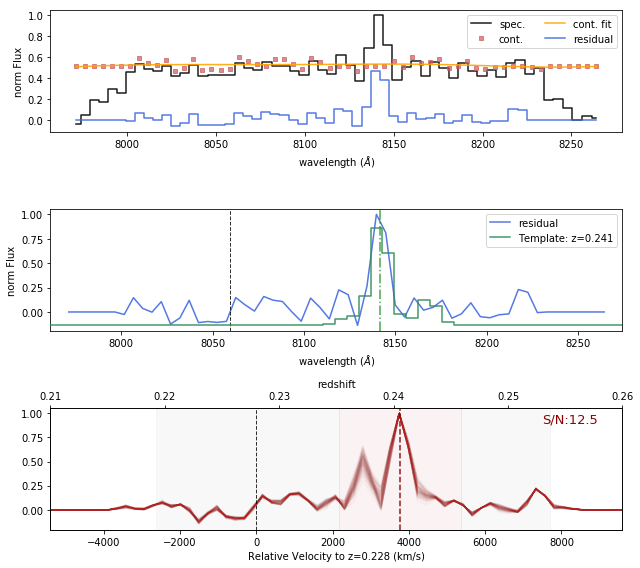

In [4]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(1686, ext_type='opt')

SE Objects #1651   S/N med: 2.73  max: 3.05


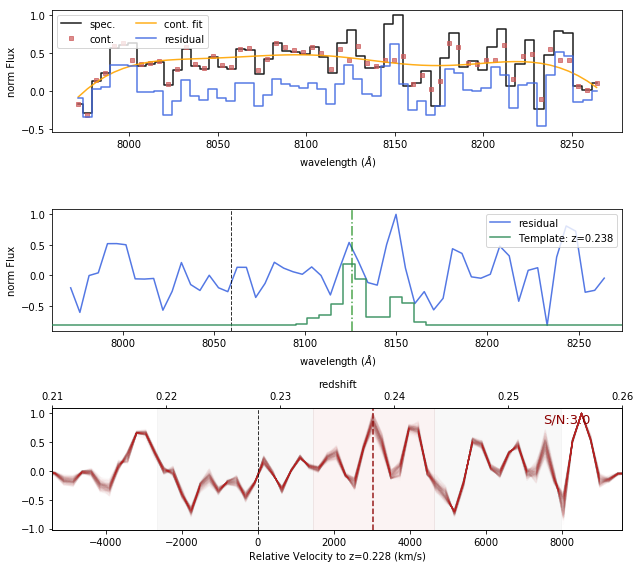

In [10]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(1651, ext_type='opt')  #off-center

SE Objects #1732   S/N med: 4.51  max: 4.83


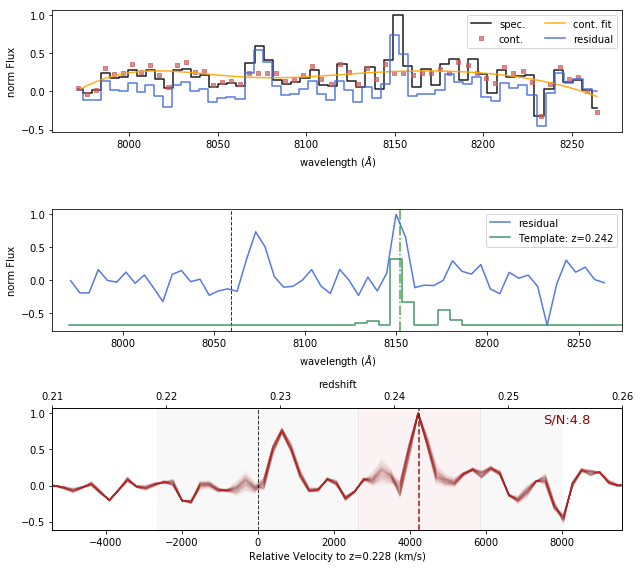

In [8]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(1732, ext_type='opt')   #2-peak

SE Objects #649   S/N med: 4.07  max: 4.84


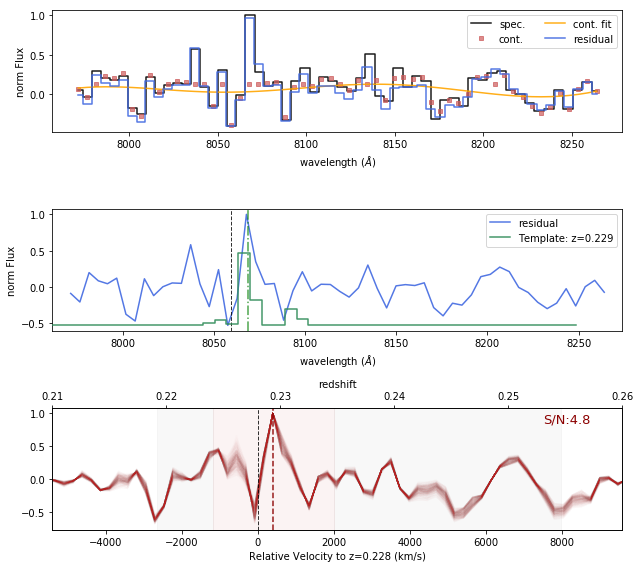

In [13]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(649, ext_type='opt')  #noisy

SE Objects #659   S/N med: 2.34  max: 3.26


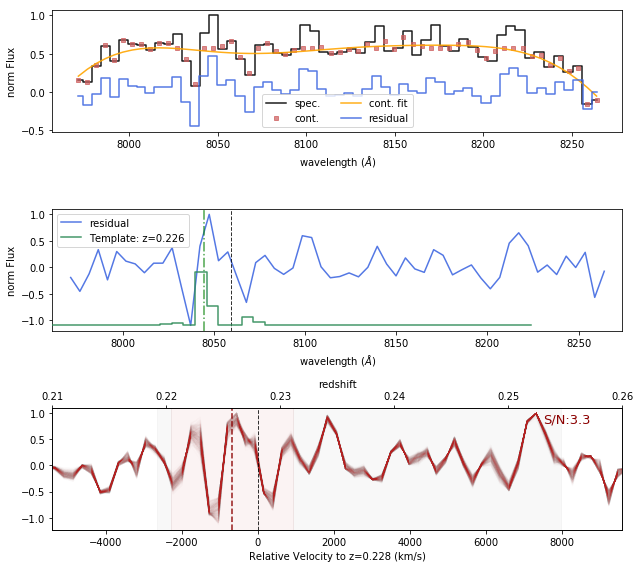

In [17]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(659, ext_type='opt')  #noisy

SE Objects #651   S/N med: 3.98  max: 5.05


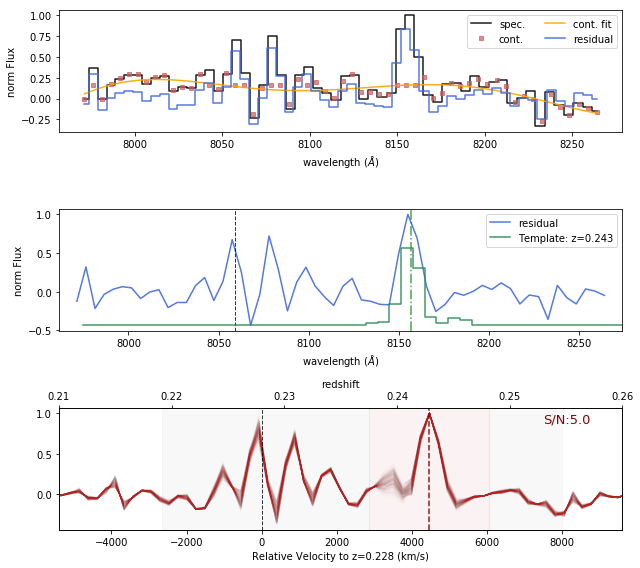

In [18]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(651, ext_type='opt') # Noisy

SE Objects #553   S/N med: 3.92  max: 4.46


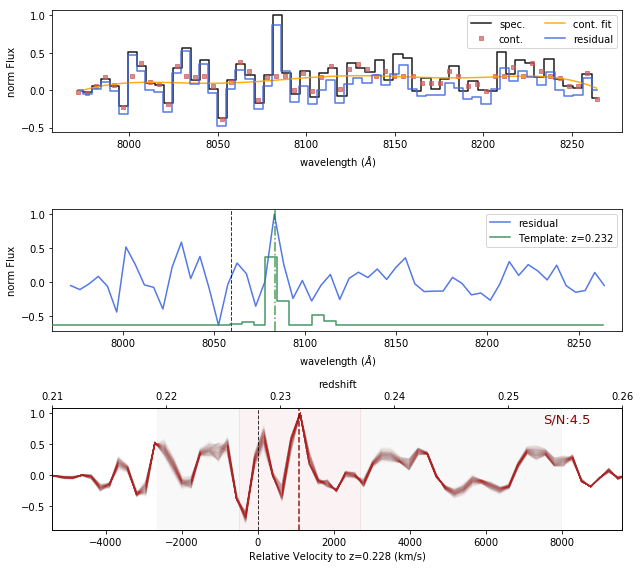

In [19]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(553, ext_type='opt')

SE Objects #634   S/N med: 3.47  max: 3.79


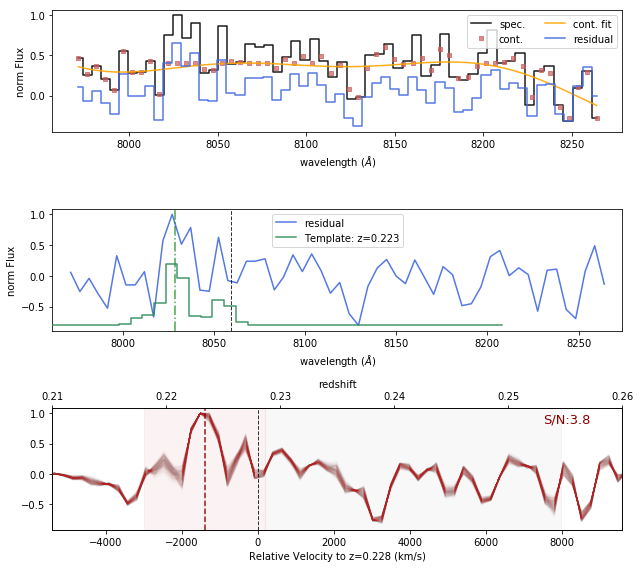

In [20]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(634, ext_type='opt')

SE Objects #459   S/N med: 4.1  max: 4.2


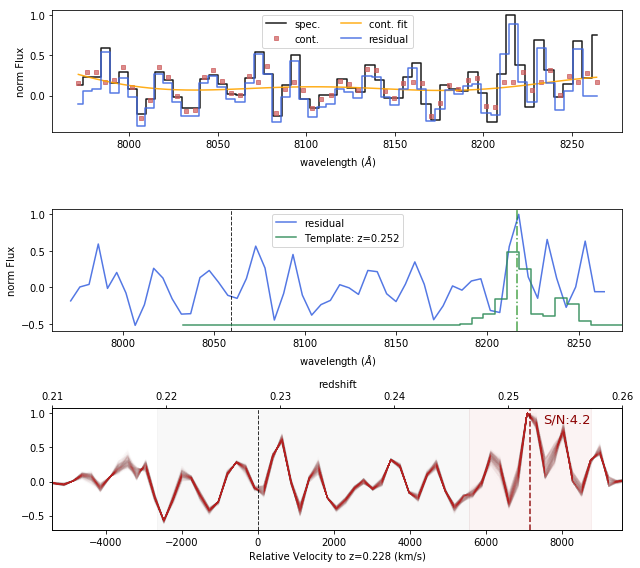

In [21]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(459, ext_type='opt')

SE Objects #78   S/N med: 1.84  max: 2.03


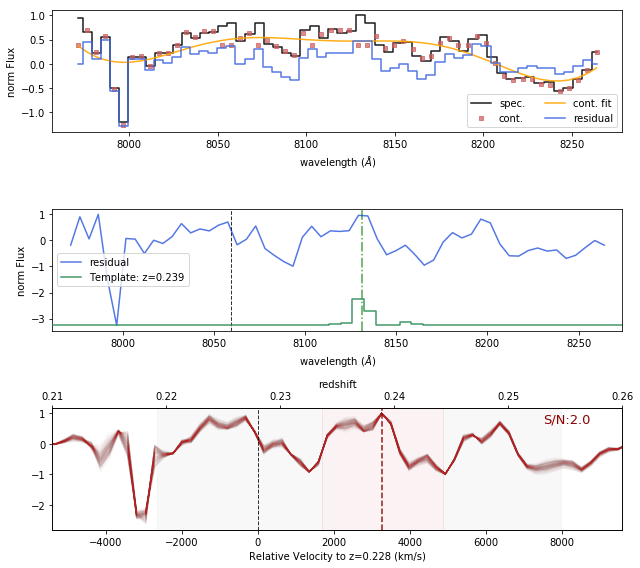

In [22]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(78, ext_type='opt')

1732
SE Objects #1732   S/N med: 4.53  max: 4.83


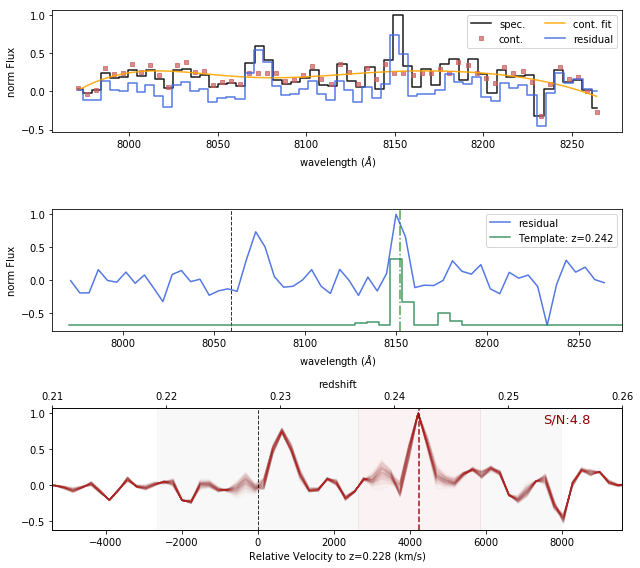

In [5]:
n = np.argmin((Datacube.Tab_SE["X_IMAGE"]-1024)**2 + (Datacube.Tab_SE["Y_IMAGE"]-1478)**2) + 1
print(n)
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(n)

659
SE Objects #659   S/N med: 2.35  max: 3.33


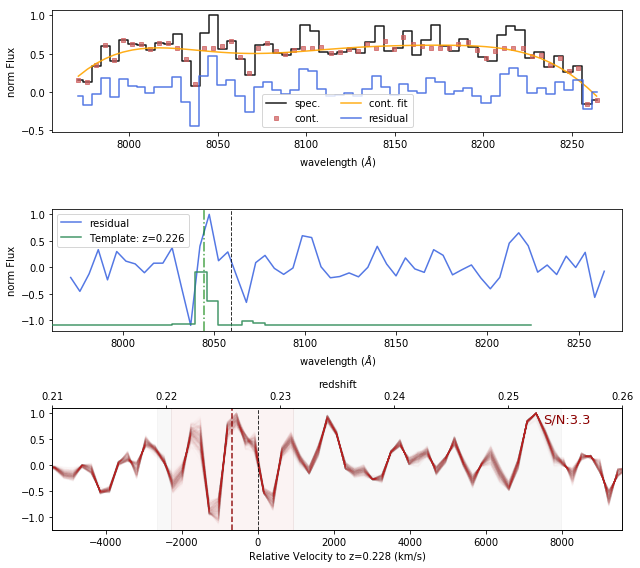

In [6]:
n = np.argmin((Datacube.Tab_SE["X_IMAGE"]-1372)**2 + (Datacube.Tab_SE["Y_IMAGE"]-708)**2) + 1
print(n)
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(n)

In [6]:
Datacube.cross_correlation_all(ext_type='opt')

SE Objects #1   S/N med: 3.05  max: 3.52
SE Objects #2   S/N med: 3.41  max: 3.47
SE Objects #3   S/N med: 3.71  max: 3.86
SE Objects #4   S/N med: 3.31  max: 4.2
SE Objects #5   S/N med: 5.27  max: 6.18
SE Objects #6   S/N med: 3.67  max: 3.81
SE Objects #7   S/N med: 3.28  max: 3.36
SE Objects #8   S/N med: 5.94  max: 6.45
SE Objects #9   S/N med: 2.57  max: 2.77
SE Objects #10   S/N med: 6.67  max: 7.05
SE Objects #11   S/N med: 3.45  max: 3.85
SE Objects #12   S/N med: 5.62  max: 6.19
SE Objects #13   S/N med: 2.11  max: 2.14
SE Objects #14   S/N med: 26.3  max: 27.3
SE Objects #15   S/N med: 9.58  max: 10.3
SE Objects #16   S/N med: 7.65  max: 8.34
SE Objects #17   S/N med: 3.04  max: 3.61
SE Objects #18   S/N med: 3.26  max: 3.7
SE Objects #19   S/N med: 2.45  max: 2.88
SE Objects #20   S/N med: 5.33  max: 6.6
SE Objects #21   S/N med: 3.22  max: 3.58
SE Objects #22   S/N med: 6.32  max: 7.89
SE Objects #23   S/N med: 4.03  max: 4.74
SE Objects #24   S/N med: 7.92  max: 9.59
SE O

SE Objects #197   S/N med: 3.2  max: 3.55
SE Objects #198   S/N med: 2.54  max: 2.72
SE Objects #199   S/N med: 3.83  max: 4.16
SE Objects #200   S/N med: 3.02  max: 3.56
SE Objects #201   S/N med: 3.56  max: 3.78
SE Objects #202   S/N med: 3.75  max: 4.17
SE Objects #203   S/N med: 3.63  max: 3.9
SE Objects #204   S/N med: 1.83  max: 2.03
SE Objects #205   S/N med: 2.19  max: 2.44
SE Objects #206   S/N med: 3.92  max: 4.51
SE Objects #207   S/N med: 3.49  max: 3.52
SE Objects #208   S/N med: 2.64  max: 2.98
SE Objects #209   S/N med: 3.91  max: 4.14
SE Objects #210   S/N med: 2.58  max: 2.68
SE Objects #211   S/N med: 2.35  max: 2.76
SE Objects #212   S/N med: 2.94  max: 3.22
SE Objects #213   S/N med: 2.02  max: 2.54
SE Objects #214   S/N med: 2.98  max: 3.38
SE Objects #215   S/N med: 2.14  max: 2.36
SE Objects #216   S/N med: 3.56  max: 4.27
SE Objects #217   S/N med: 4.37  max: 4.58
SE Objects #218   S/N med: 3.49  max: 3.57
SE Objects #219   S/N med: 3.11  max: 3.51
SE Objects #2

SE Objects #391   S/N med: 2.99  max: 3.37
SE Objects #392   S/N med: 4.31  max: 5.08
SE Objects #393   S/N med: 3.56  max: 3.62
SE Objects #394   S/N med: 3.89  max: 4.06
SE Objects #395   S/N med: 2.56  max: 2.91
SE Objects #396   S/N med: 4.5  max: 4.81
SE Objects #397   S/N med: 17.9  max: 19.8
SE Objects #398   S/N med: 3.17  max: 3.44
SE Objects #399   S/N med: 4.13  max: 4.26
SE Objects #400   S/N med: 2.2  max: 2.62
SE Objects #401   S/N med: 2.24  max: 2.66
SE Objects #402   S/N med: 2.24  max: 2.48
SE Objects #403   S/N med: 2.57  max: 2.81
SE Objects #404   S/N med: 2.72  max: 2.83
SE Objects #405   S/N med: 2.96  max: 3.16
SE Objects #406   S/N med: 3.25  max: 3.66
SE Objects #407   S/N med: 2.12  max: 2.53
SE Objects #408   S/N med: 3.05  max: 3.11
SE Objects #409   S/N med: 3.57  max: 4.29
SE Objects #410   S/N med: 2.67  max: 3.06
SE Objects #411   S/N med: 3.4  max: 3.72
SE Objects #412   S/N med: 2.53  max: 2.61
SE Objects #413   S/N med: 3.24  max: 3.43
SE Objects #41

SE Objects #584   S/N med: 2.49  max: 2.95
SE Objects #585   S/N med: 3.9  max: 3.94
SE Objects #586   S/N med: 1.94  max: 2.35
SE Objects #587   S/N med: 3.66  max: 5.11
SE Objects #588   S/N med: 3.39  max: 3.59
SE Objects #589   S/N med: 7.44  max: 8.04
SE Objects #590   S/N med: 2.34  max: 2.4
SE Objects #591   S/N med: 2.52  max: 2.6
SE Objects #592   S/N med: 3.25  max: 3.51
SE Objects #593   S/N med: 2.27  max: 2.37
SE Objects #594   S/N med: 2.77  max: 3.22
SE Objects #595   S/N med: 1.75  max: 1.91
SE Objects #596   S/N med: 2.83  max: 3.24
SE Objects #597   S/N med: 3.27  max: 3.37
SE Objects #598   S/N med: 4.49  max: 4.89
SE Objects #599   S/N med: 3.12  max: 3.33
SE Objects #600   S/N med: 18.1  max: 18.3
SE Objects #601   S/N med: 3.38  max: 3.9
SE Objects #602   S/N med: 4.18  max: 4.81
SE Objects #603   S/N med: 1.84  max: 2.06
SE Objects #604   S/N med: 2.42  max: 2.83
SE Objects #605   S/N med: 2.46  max: 2.69
SE Objects #606   S/N med: 2.35  max: 2.47
SE Objects #607

SE Objects #776   S/N med: 3.64  max: 3.94
SE Objects #777   S/N med: 3.08  max: 3.22
SE Objects #778   S/N med: 2.69  max: 2.87
SE Objects #779   S/N med: 4.46  max: 5.04
SE Objects #780   S/N med: 5.38  max: 5.68
SE Objects #781   S/N med: 60.1  max: 67
SE Objects #782   S/N med: 2.03  max: 2.27
SE Objects #783   S/N med: 3.63  max: 3.76
SE Objects #784   S/N med: 3.69  max: 4.04
SE Objects #785   S/N med: 2.59  max: 2.91
SE Objects #786   S/N med: 2.38  max: 2.56
SE Objects #787   S/N med: 2.93  max: 3.16
SE Objects #788   S/N med: 2.89  max: 3.01
SE Objects #789   S/N med: 2.15  max: 2.79
SE Objects #790   S/N med: 3.46  max: 3.9
SE Objects #791   S/N med: 3.83  max: 4.74
SE Objects #792   S/N med: 3.25  max: 3.55
SE Objects #793   S/N med: 3.3  max: 3.37
SE Objects #794   S/N med: 3.57  max: 4.05
SE Objects #795   S/N med: 3.14  max: 3.33
SE Objects #796   S/N med: 2.51  max: 2.88
SE Objects #797   S/N med: 2.8  max: 2.95
SE Objects #798   S/N med: 3.53  max: 3.65
SE Objects #799 

SE Objects #968   S/N med: 3.35  max: 3.65
SE Objects #969   S/N med: 5.18  max: 5.28
SE Objects #970   S/N med: 2.79  max: 3.08
SE Objects #971   S/N med: 2.63  max: 2.82
SE Objects #972   S/N med: 2.07  max: 2.25
SE Objects #973   S/N med: 2.75  max: 3.09
SE Objects #974   S/N med: 1.83  max: 2.11
SE Objects #975   S/N med: 2.58  max: 2.66
SE Objects #976   S/N med: 3.03  max: 3.4
SE Objects #977   S/N med: 3.23  max: 3.37
SE Objects #978   S/N med: 1.51  max: 1.74
SE Objects #979   S/N med: 4.58  max: 4.84
SE Objects #980   S/N med: 3.78  max: 4.36
SE Objects #981   S/N med: 2.51  max: 2.72
SE Objects #982   S/N med: 2.6  max: 2.65
SE Objects #983   S/N med: 2.72  max: 3.11
SE Objects #984   S/N med: 1.92  max: 2.16
SE Objects #985   S/N med: 8.93  max: 9.73
SE Objects #986   S/N med: 2.1  max: 2.43
SE Objects #987   S/N med: 1.84  max: 2.29
SE Objects #988   S/N med: 2.04  max: 2.15
SE Objects #989   S/N med: 4.24  max: 5.02
SE Objects #990   S/N med: 2.74  max: 3.33
SE Objects #99

SE Objects #1156   S/N med: 2.46  max: 2.65
SE Objects #1157   S/N med: 2.25  max: 2.33
SE Objects #1158   S/N med: 3.17  max: 3.56
SE Objects #1159   S/N med: 3.38  max: 3.62
SE Objects #1160   S/N med: 3.31  max: 3.75
SE Objects #1161   S/N med: 3.91  max: 4.12
SE Objects #1162   S/N med: 2.26  max: 2.49
SE Objects #1163   S/N med: 3.73  max: 4.24
SE Objects #1164   S/N med: 2.6  max: 3.62
SE Objects #1165   S/N med: 2.63  max: 2.83
SE Objects #1166   S/N med: 3.16  max: 3.39
SE Objects #1167   S/N med: 4.26  max: 4.32
SE Objects #1168   S/N med: 2.69  max: 3.25
SE Objects #1169   S/N med: 6.43  max: 6.52
SE Objects #1170   S/N med: 3.48  max: 3.74
SE Objects #1171   S/N med: 3.51  max: 3.82
SE Objects #1172   S/N med: 3.66  max: 3.73
SE Objects #1173   S/N med: 3.2  max: 3.3
SE Objects #1174   S/N med: 2.94  max: 3.16
SE Objects #1175   S/N med: 4.22  max: 4.51
SE Objects #1176   S/N med: 4.34  max: 4.58
SE Objects #1177   S/N med: 1.74  max: 1.91
SE Objects #1178   S/N med: 4.28  m

SE Objects #1344   S/N med: 2.08  max: 2.16
SE Objects #1345   S/N med: 1.93  max: 2.22
SE Objects #1346   S/N med: 2.61  max: 2.77
SE Objects #1347   S/N med: 10.7  max: 10.8
SE Objects #1348   S/N med: 2.87  max: 3.35
SE Objects #1349   S/N med: 2.21  max: 2.37
SE Objects #1350   S/N med: 3.45  max: 3.72
SE Objects #1351   S/N med: 3.35  max: 3.59
SE Objects #1352   S/N med: 2.16  max: 2.4
SE Objects #1353   S/N med: 3.48  max: 3.97
SE Objects #1354   S/N med: 2.45  max: 2.86
SE Objects #1355   S/N med: 2.08  max: 2.31
SE Objects #1356   S/N med: 2.44  max: 2.8
SE Objects #1357   S/N med: 3.23  max: 3.48
SE Objects #1358   S/N med: 3.03  max: 3.31
SE Objects #1359   S/N med: 2.95  max: 3.6
SE Objects #1360   S/N med: 2.66  max: 3.66
SE Objects #1361   S/N med: 2.39  max: 2.93
SE Objects #1362   S/N med: 2.61  max: 2.76
SE Objects #1363   S/N med: 24.9  max: 27
SE Objects #1364   S/N med: 7.88  max: 8.3
SE Objects #1365   S/N med: 2.64  max: 2.92
SE Objects #1366   S/N med: 3.11  max:

SE Objects #1532   S/N med: 2.42  max: 2.5
SE Objects #1533   S/N med: 2.74  max: 2.98
SE Objects #1534   S/N med: 3.06  max: 3.4
SE Objects #1535   S/N med: 2.32  max: 2.63
SE Objects #1536   S/N med: 3.2  max: 3.69
SE Objects #1537   S/N med: 2.36  max: 2.46
SE Objects #1538   S/N med: 3.1  max: 3.48
SE Objects #1539   S/N med: 2.5  max: 2.92
SE Objects #1540   S/N med: 4.29  max: 5.24
SE Objects #1541   S/N med: 2.3  max: 2.56
SE Objects #1542   S/N med: 6.67  max: 6.96
SE Objects #1543   S/N med: 4.74  max: 5.41
SE Objects #1544   S/N med: 3.86  max: 4.05
SE Objects #1545   S/N med: 3.38  max: 3.78
SE Objects #1546   S/N med: 3.7  max: 4.11
SE Objects #1547   S/N med: 3.01  max: 3.08
SE Objects #1548   S/N med: 3.16  max: 3.21
SE Objects #1549   S/N med: 2.61  max: 3.13
SE Objects #1550   S/N med: 2.28  max: 2.68
SE Objects #1551   S/N med: 2.34  max: 2.91
SE Objects #1552   S/N med: 3.92  max: 4.39
SE Objects #1553   S/N med: 4.2  max: 4.62
SE Objects #1554   S/N med: 3.25  max: 3

SE Objects #1720   S/N med: 1.99  max: 2.11
SE Objects #1721   S/N med: 2.45  max: 3.23
SE Objects #1722   S/N med: 4.13  max: 5.17
SE Objects #1723   S/N med: 3.37  max: 3.52
SE Objects #1724   S/N med: 2.56  max: 2.79
SE Objects #1725   S/N med: 2.2  max: 2.33
SE Objects #1726   S/N med: 3.42  max: 3.7
SE Objects #1727   S/N med: 2.66  max: 2.94
SE Objects #1728   S/N med: 3.94  max: 4.79
SE Objects #1729   S/N med: 4.79  max: 5.59
SE Objects #1730   S/N med: 1.9  max: 2.17
SE Objects #1731   S/N med: 2.52  max: 2.86
SE Objects #1732   S/N med: 4.57  max: 4.83
SE Objects #1733   S/N med: 1.94  max: 2.14
SE Objects #1734   S/N med: 2.53  max: 2.56
SE Objects #1735   S/N med: 2.84  max: 3.04
SE Objects #1736   S/N med: 2.43  max: 2.72
SE Objects #1737   S/N med: 2.14  max: 2.59
SE Objects #1738   S/N med: 9.67  max: 10.6
SE Objects #1739   S/N med: 2.71  max: 2.9
SE Objects #1740   S/N med: 3.62  max: 3.74
SE Objects #1741   S/N med: 2.93  max: 3.24
SE Objects #1742   S/N med: 2.62  ma

SE Objects #1908   S/N med: 2.71  max: 2.94
SE Objects #1909   S/N med: 6.35  max: 6.7
SE Objects #1910   S/N med: 1.96  max: 2.3
SE Objects #1911   S/N med: 2.85  max: 3.08
SE Objects #1912   S/N med: 3.19  max: 3.76
SE Objects #1913   S/N med: 5.29  max: 6.62
SE Objects #1914   S/N med: 3.43  max: 4.04
SE Objects #1915   S/N med: 3.37  max: 3.45
SE Objects #1916   S/N med: 2.29  max: 2.77
SE Objects #1917   S/N med: 5.65  max: 6.01
SE Objects #1918   S/N med: 2.73  max: 3.35
SE Objects #1919   S/N med: 3  max: 3.32
SE Objects #1920   S/N med: 14.5  max: 18.9
SE Objects #1921   S/N med: 1.9  max: 2.33
SE Objects #1922   S/N med: 3.41  max: 3.47
SE Objects #1923   S/N med: 4.07  max: 4.46
SE Objects #1924   S/N med: 3.65  max: 4.09
SE Objects #1925   S/N med: 3.72  max: 4.28
SE Objects #1926   S/N med: 4.8  max: 5.97
SE Objects #1927   S/N med: 2.23  max: 2.38
SE Objects #1928   S/N med: 1.77  max: 1.9
SE Objects #1929   S/N med: 2.15  max: 2.43
SE Objects #1930   S/N med: 6.83  max: 7

SE Objects #2096   S/N med: 2.22  max: 2.55
SE Objects #2097   S/N med: 4  max: 4.49
SE Objects #2098   S/N med: 3.45  max: 4.32
SE Objects #2099   S/N med: 3.45  max: 3.5
SE Objects #2100   S/N med: 3.85  max: 4.05
SE Objects #2101   S/N med: 4.17  max: 4.21
SE Objects #2102   S/N med: 2.83  max: 3.31
SE Objects #2103   S/N med: 2.96  max: 3.57
SE Objects #2104   S/N med: 3.88  max: 4.55
SE Objects #2105   S/N med: 3.22  max: 3.32
SE Objects #2106   S/N med: 3.32  max: 3.38
SE Objects #2107   S/N med: 3.58  max: 3.77
SE Objects #2108   S/N med: 3.38  max: 3.82
SE Objects #2109   S/N med: 3.79  max: 4.2
SE Objects #2110   S/N med: 4.4  max: 4.51
SE Objects #2111   S/N med: 3.54  max: 3.68
SE Objects #2112   S/N med: 3.3  max: 3.84
SE Objects #2113   S/N med: 3.26  max: 3.58
SE Objects #2114   S/N med: 10.2  max: 10.5
SE Objects #2115   S/N med: 3.19  max: 3.39
SE Objects #2116   S/N med: 3.72  max: 3.95
SE Objects #2117   S/N med: 3.22  max: 3.46
SE Objects #2118   S/N med: 3.78  max: 

In [7]:
Y_pix, X_pix = np.indices(Datacube.mask_edge.shape)
dist_edge = np.array([np.sqrt((X_pix[~Datacube.mask_edge]-gal["X_IMAGE"])**2 + (Y_pix[~Datacube.mask_edge]-gal["Y_IMAGE"])**2).min() \
                      for gal in Datacube.Tab_SE])

print(np.percentile(np.max(Datacube.CC_SNRs,axis=1), 95))

6.909125764290554


/home/qliu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/qliu/anaconda3/lib/python3.6/site-packages/astropy/table/column.py:965: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, op)(other)


470

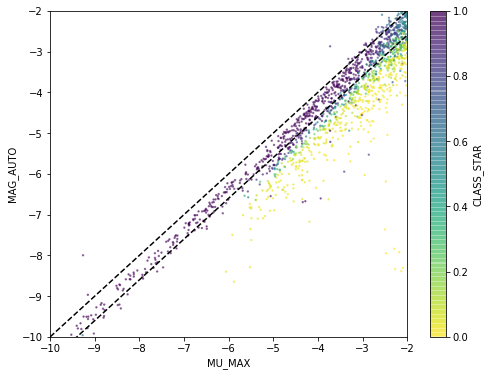

In [43]:
# Star cond
plt.figure(figsize=(8,6))
mag_auto = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
plt.scatter(Datacube.Tab_SE["MU_MAX"], mag_auto,
            c = Datacube.Tab_SE["CLASS_STAR"], s=2, cmap='viridis_r', alpha=0.5)
xx = np.linspace(-10,-2,100)
plt.plot(xx, xx-0.6, 'k--', xx, xx, 'k--')
plt.xlabel("MU_MAX")
plt.ylabel("MAG_AUTO")
plt.xlim(-10,-2)
plt.ylim(-10,-2)
cb = plt.colorbar()
cb.set_label("CLASS_STAR")

star_cond = ((abs(mag_auto-Datacube.Tab_SE["MU_MAX"]  + 0.3))<0.3) & (Datacube.Tab_SE['CLASS_STAR']>0.9)
np.sum(star_cond)

90
219
109


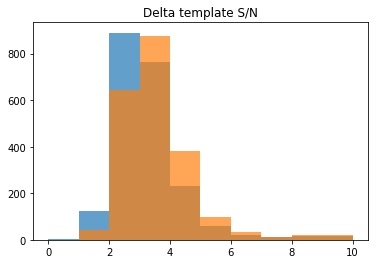

In [45]:
# Gaussian template
plt.hist(np.median(Datacube.CC_SNRs,axis=1),range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.hist(np.max(Datacube.CC_SNRs,axis=1),range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("Delta template S/N")

cond0 = (np.max(Datacube.CC_SNRs,axis=1)>7)&(dist_edge>5)  #&(Datacube.cc_flags==0)
cond1 = (np.max(Datacube.CC_SNRs,axis=1)>5)&(dist_edge>5)  #&(Datacube.cc_flags==0)
cond2 = (np.max(Datacube.CC_SNRs,axis=1)>5) & (np.max(Datacube.CC_SNRs,axis=1)<7) \
            & (dist_edge>5) & (~star_cond)   # & (Datacube.cc_flags==0)

print(np.sum(cond0))
print(np.sum(cond1))
print(np.sum(cond2))

109
SE Objects #12   S/N med: 5.62  max: 6.19


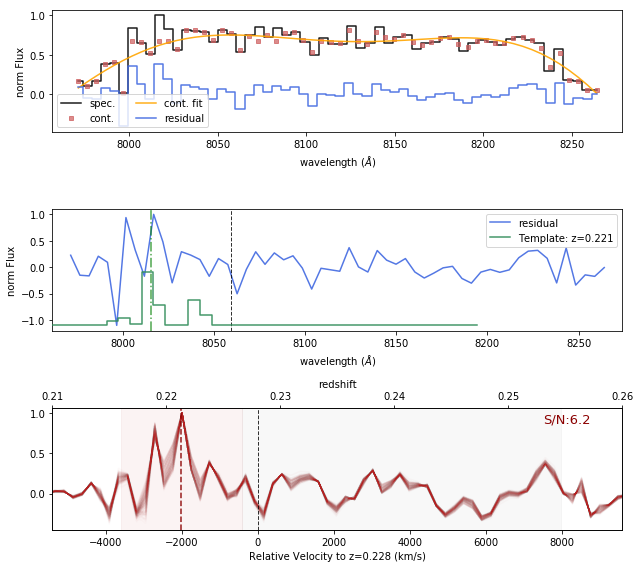

SE Objects #20   S/N med: 5.33  max: 6.6


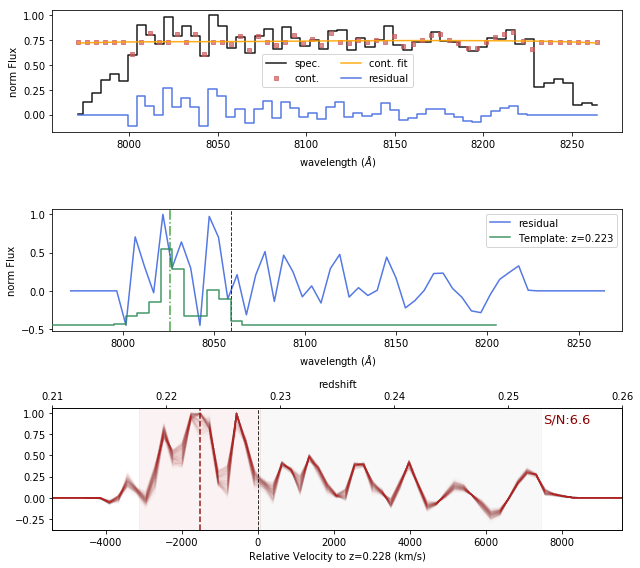

SE Objects #32   S/N med: 4.88  max: 5.14


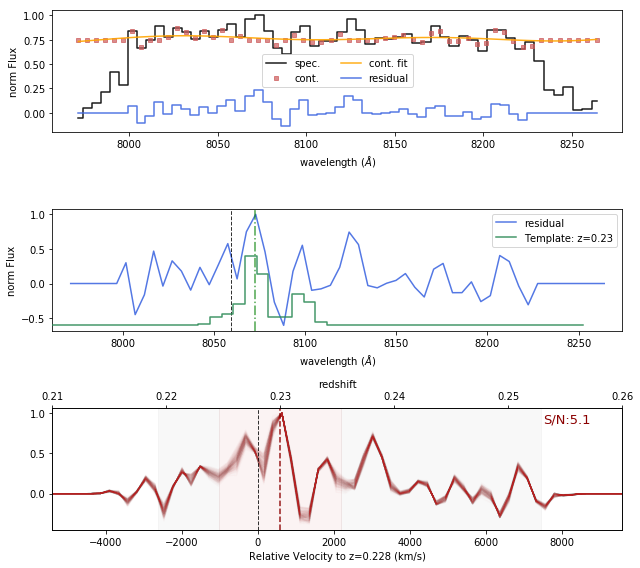

SE Objects #42   S/N med: 4.88  max: 5.59


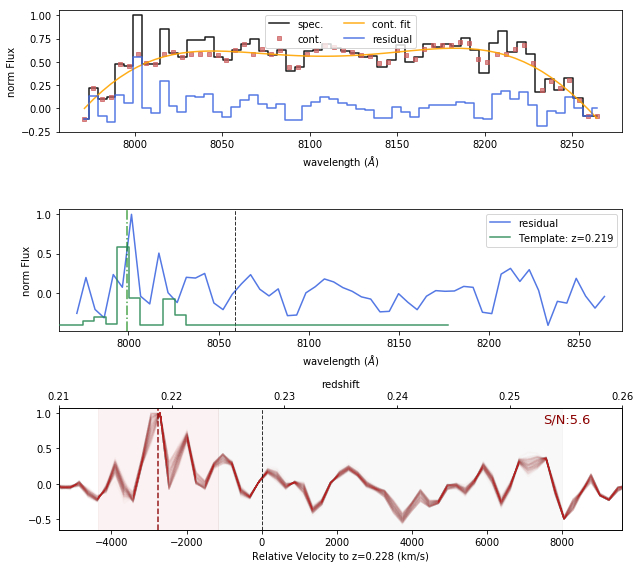

SE Objects #83   S/N med: 4.95  max: 5.22


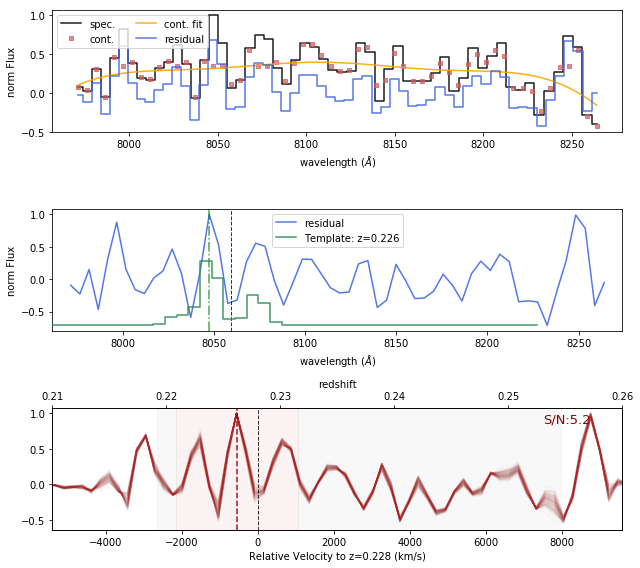

SE Objects #114   S/N med: 4.97  max: 5.6


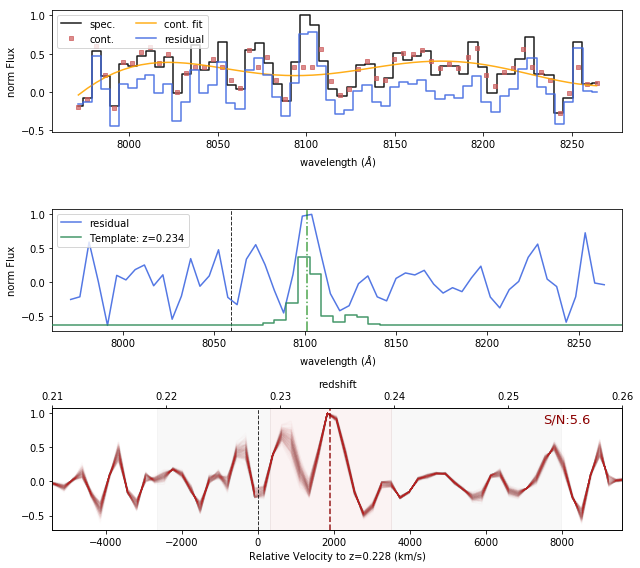

SE Objects #126   S/N med: 5.18  max: 5.91


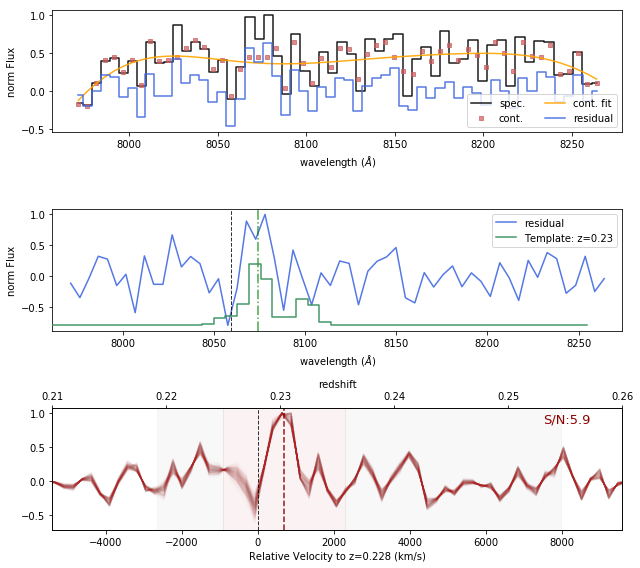

SE Objects #136   S/N med: 4.64  max: 5.38


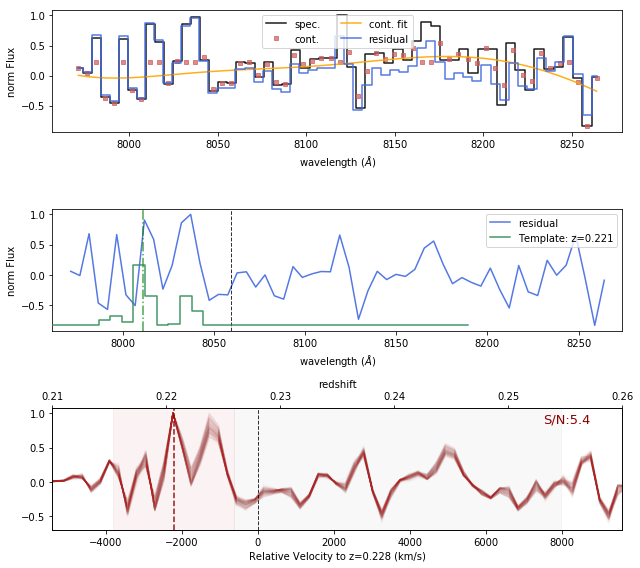

SE Objects #140   S/N med: 5.87  max: 6.28


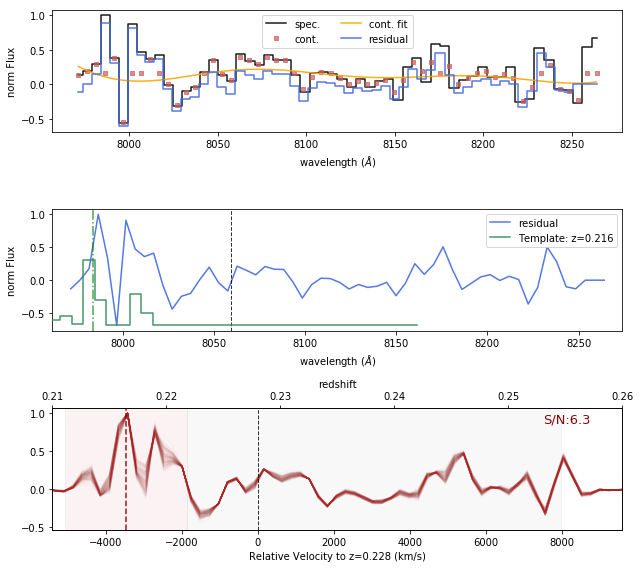

SE Objects #151   S/N med: 4.7  max: 5.06


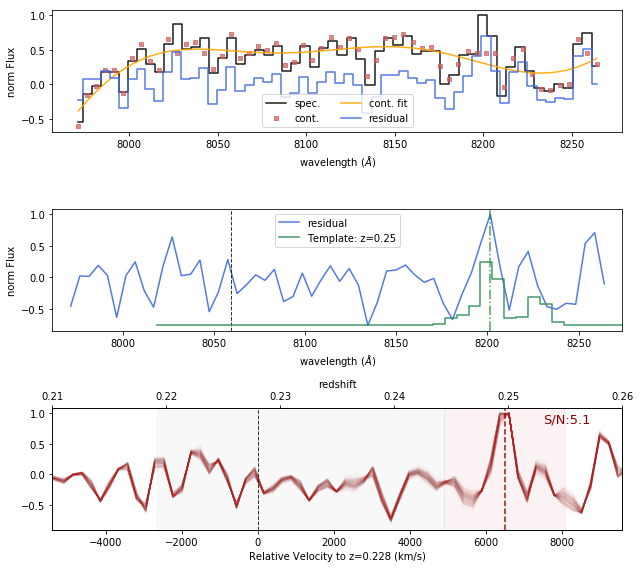

SE Objects #162   S/N med: 4.82  max: 5.69


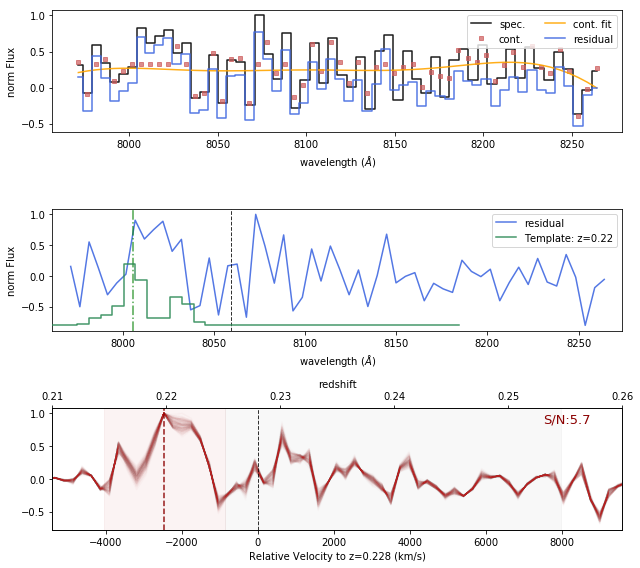

SE Objects #167   S/N med: 4.86  max: 5.67


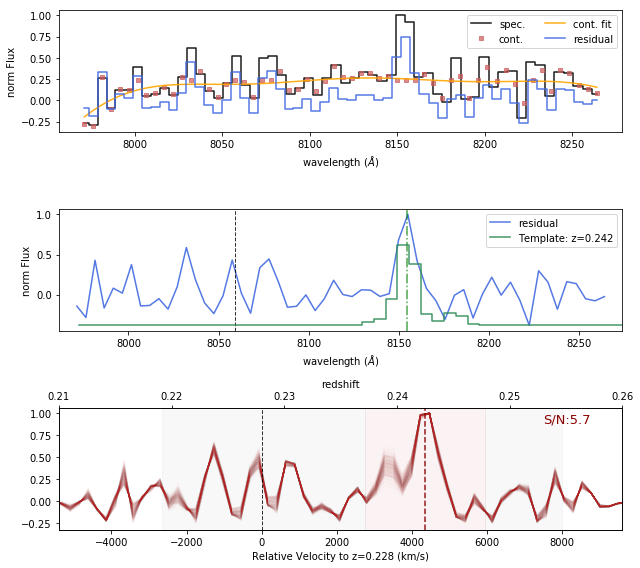

SE Objects #173   S/N med: 5.48  max: 5.9


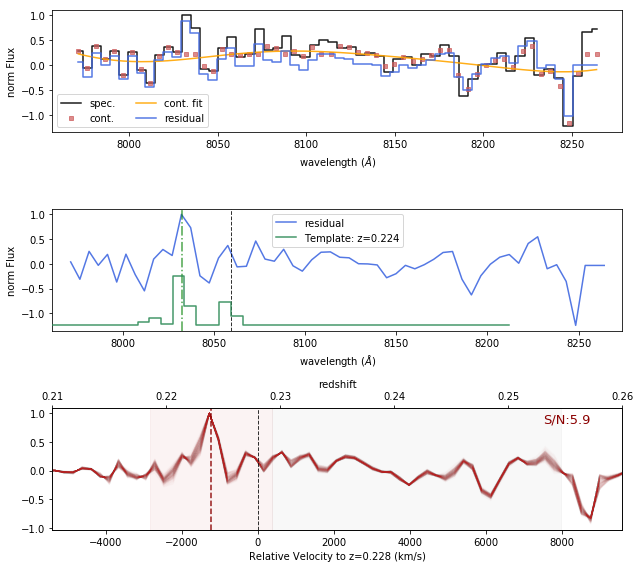

SE Objects #180   S/N med: 5.02  max: 5.05


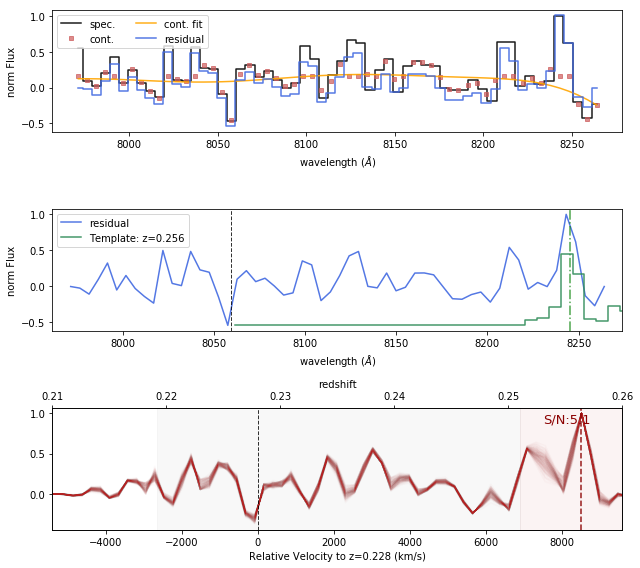

SE Objects #227   S/N med: 5.23  max: 5.6


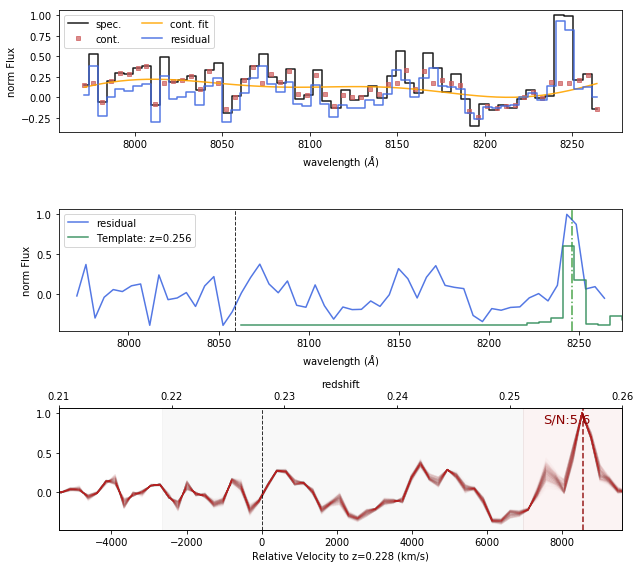

SE Objects #228   S/N med: 5.2  max: 5.81


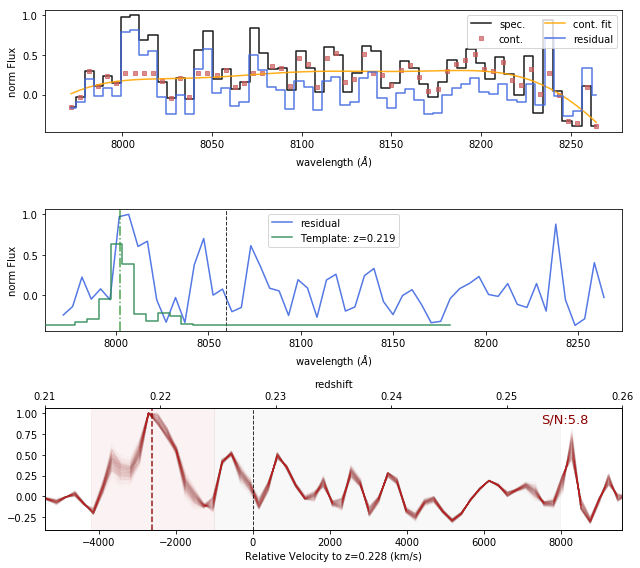

SE Objects #250   S/N med: 4.73  max: 5.8


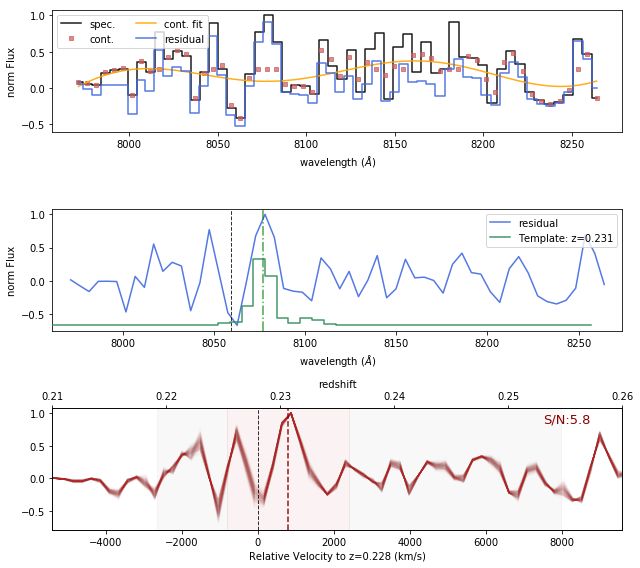

SE Objects #280   S/N med: 4.04  max: 5.26


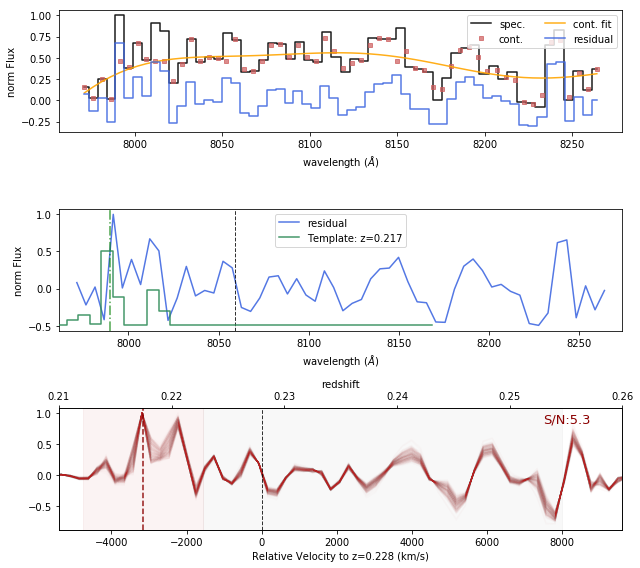

SE Objects #283   S/N med: 4.87  max: 5.21


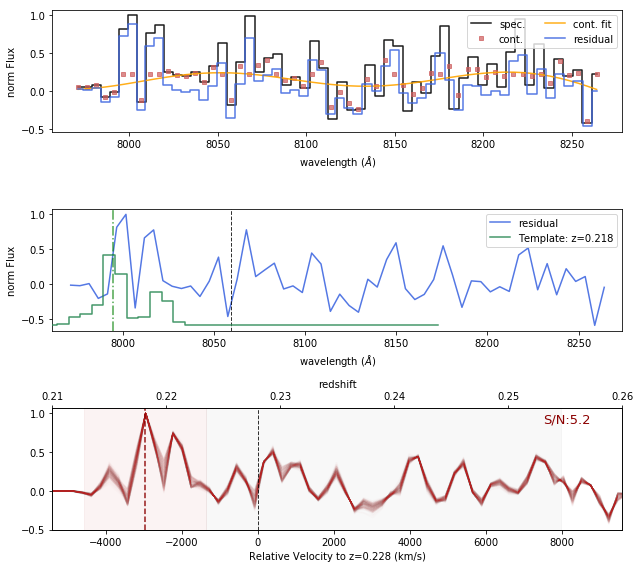

SE Objects #300   S/N med: 4.23  max: 5.61


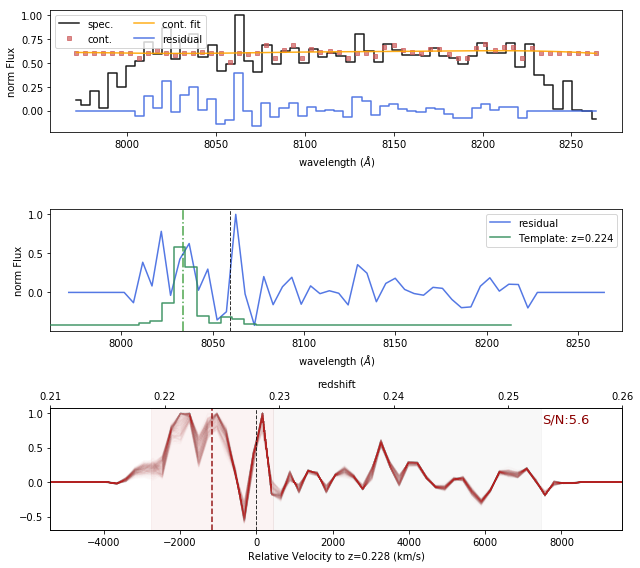

SE Objects #314   S/N med: 5.8  max: 6.5


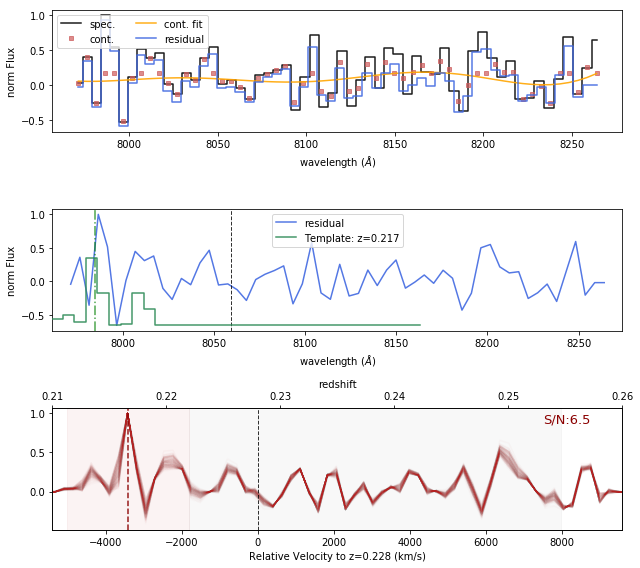

SE Objects #368   S/N med: 5.01  max: 5.45


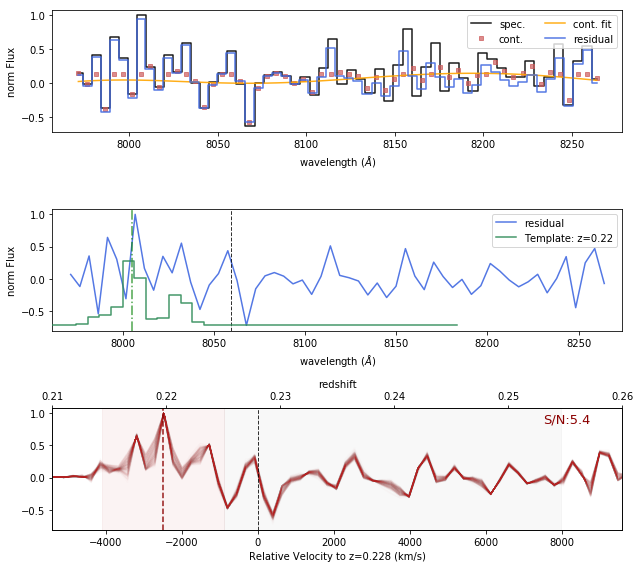

SE Objects #373   S/N med: 4.65  max: 5.55


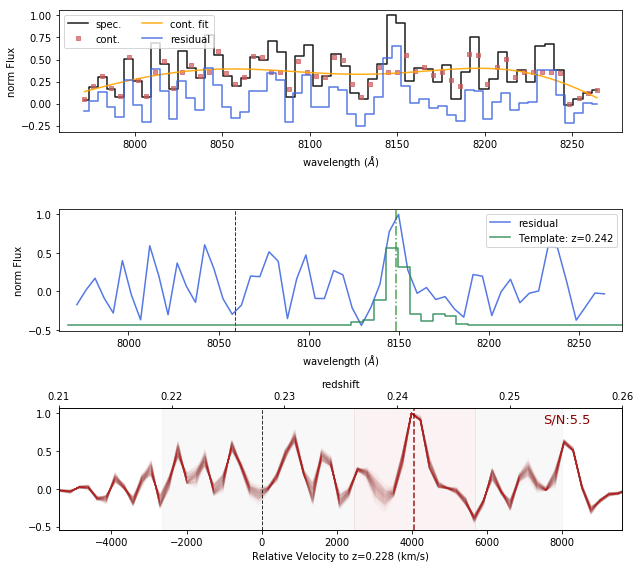

SE Objects #374   S/N med: 5.43  max: 6.26


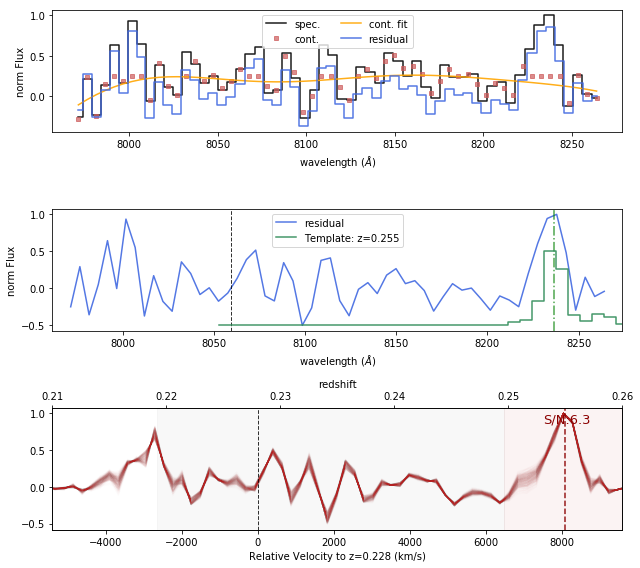

SE Objects #382   S/N med: 5.71  max: 6.35


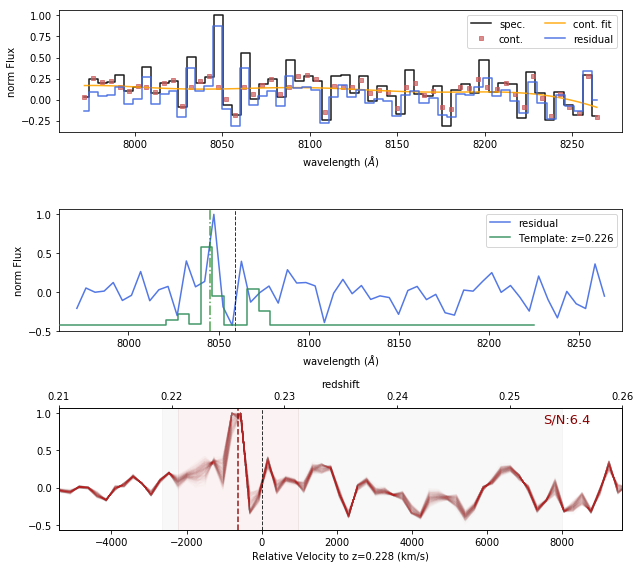

SE Objects #392   S/N med: 4.31  max: 5.08


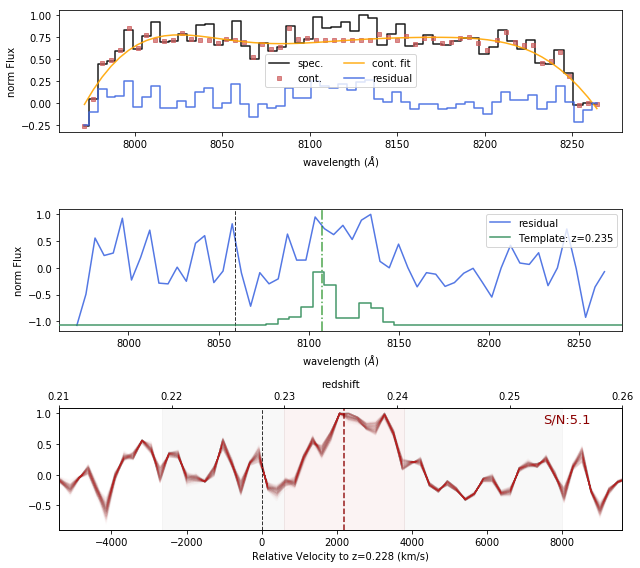

SE Objects #417   S/N med: 4.79  max: 5.71


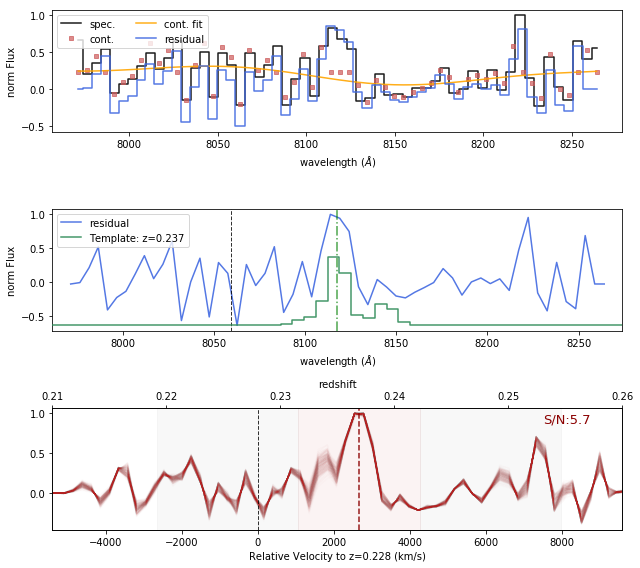

SE Objects #418   S/N med: 4.11  max: 5.03


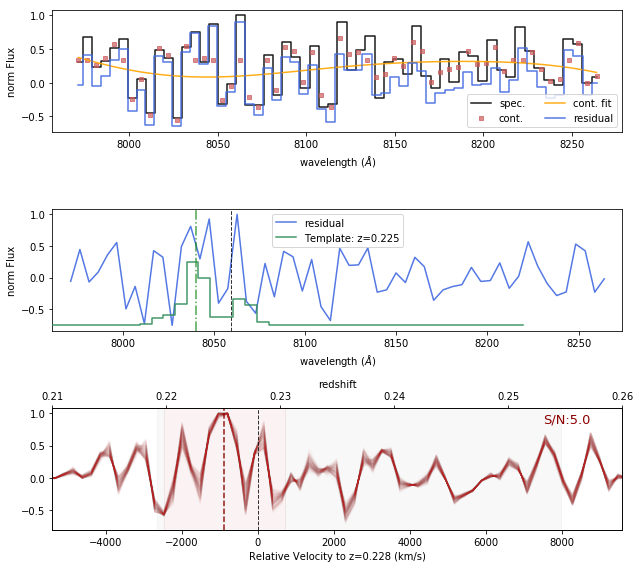

SE Objects #444   S/N med: 6.1  max: 6.63


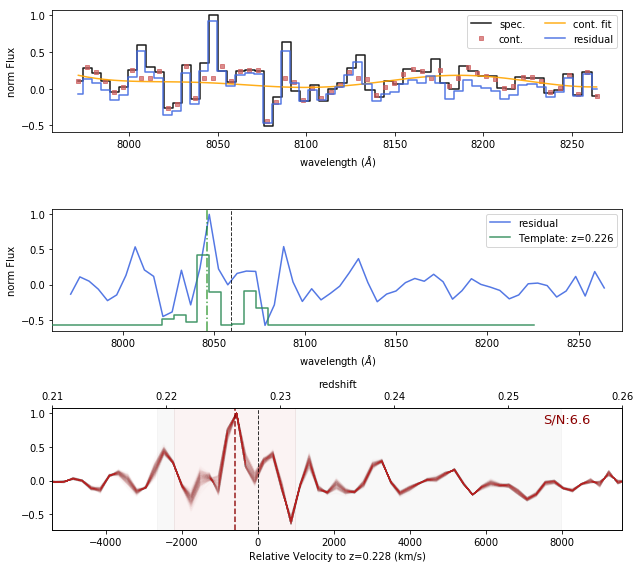

SE Objects #462   S/N med: 4.51  max: 5.04


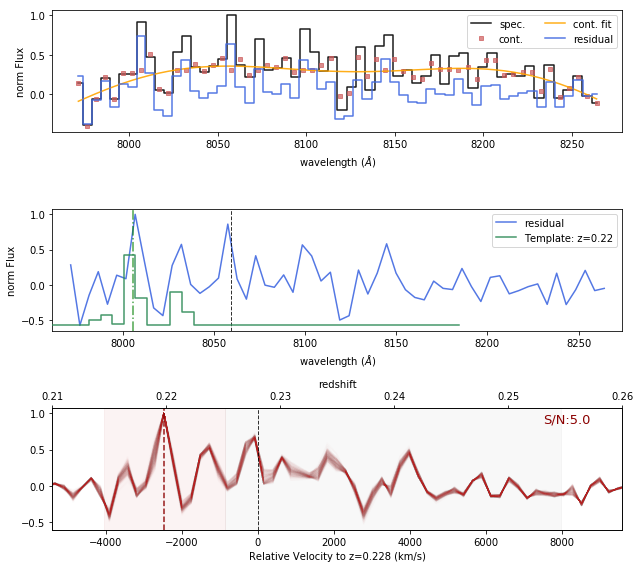

SE Objects #494   S/N med: 4.96  max: 5.07


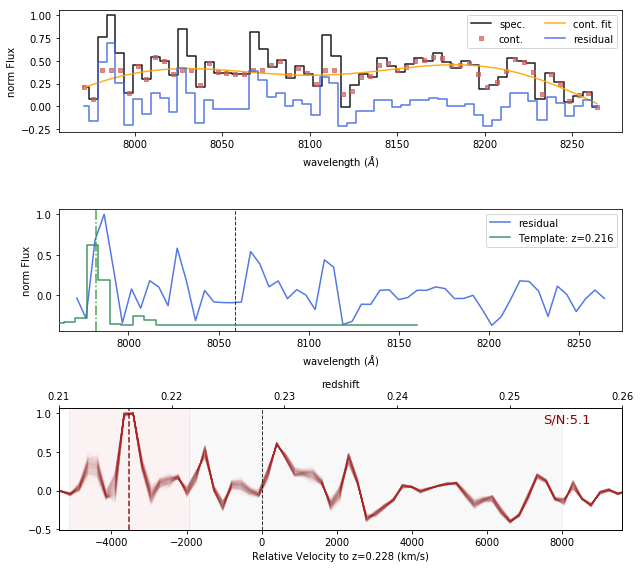

SE Objects #502   S/N med: 4.99  max: 5.57


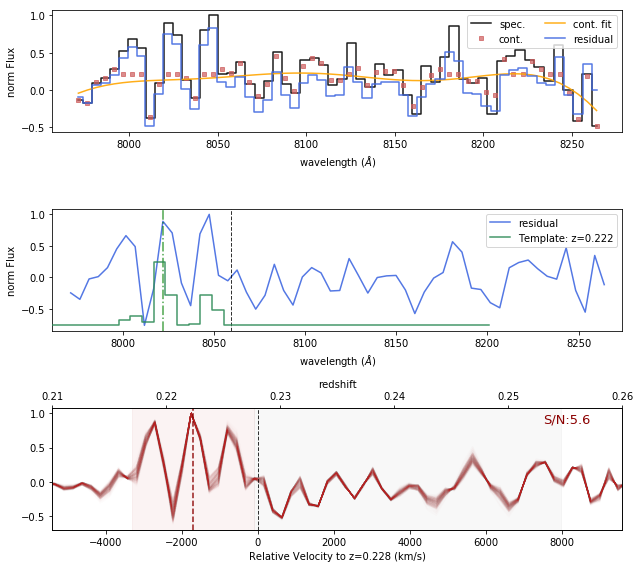

SE Objects #504   S/N med: 5.54  max: 6.54


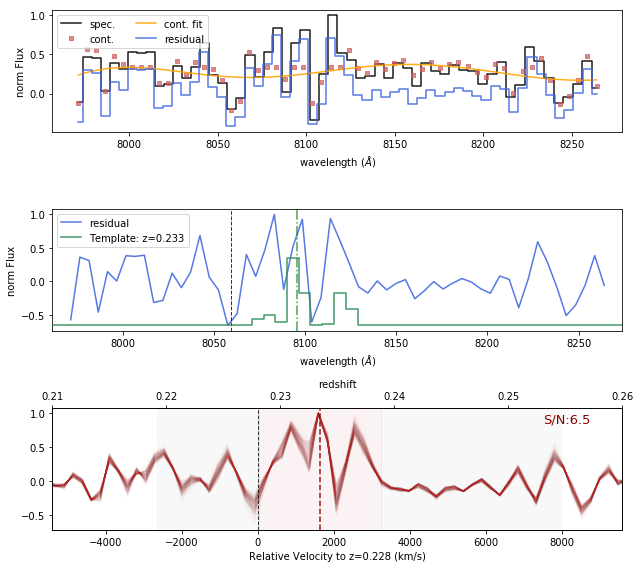

SE Objects #562   S/N med: 4.94  max: 5.44


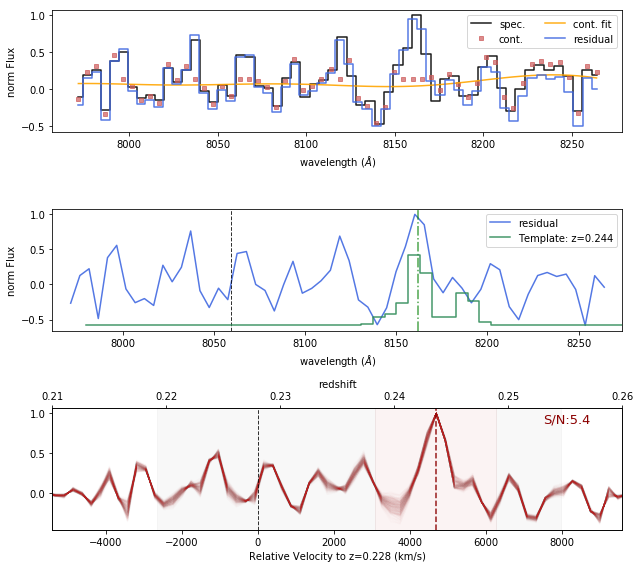

SE Objects #565   S/N med: 4.52  max: 5.13


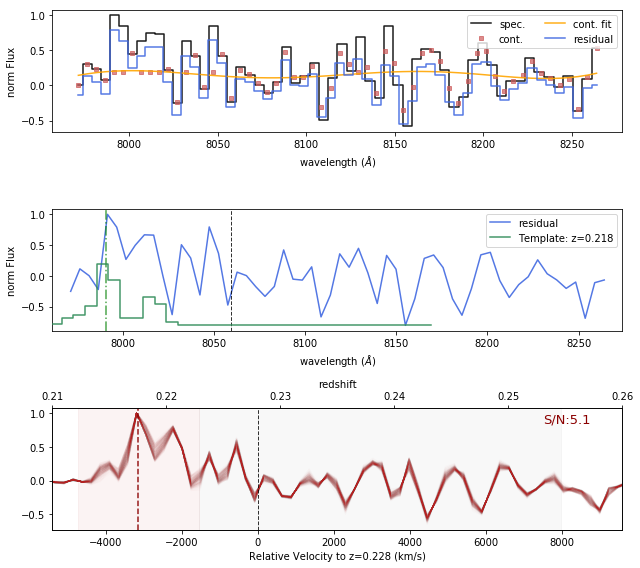

SE Objects #574   S/N med: 5.16  max: 5.84


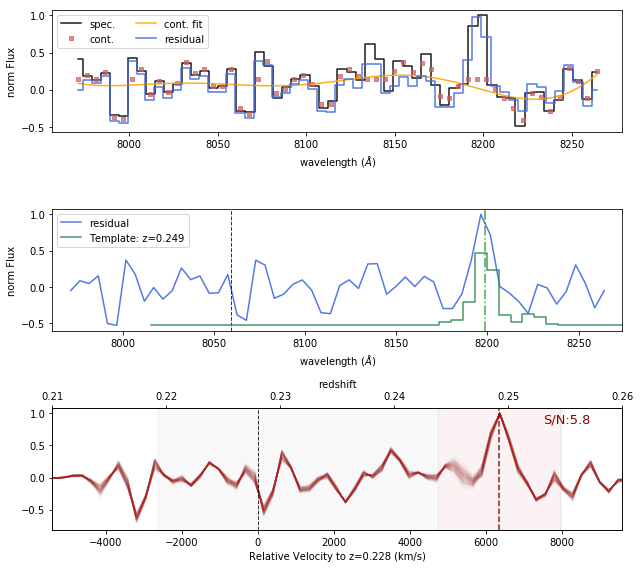

SE Objects #587   S/N med: 3.66  max: 5.11


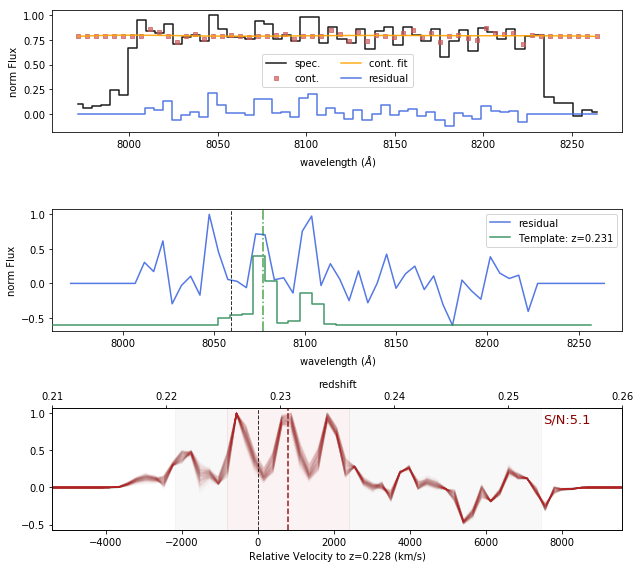

SE Objects #611   S/N med: 4.85  max: 5.18


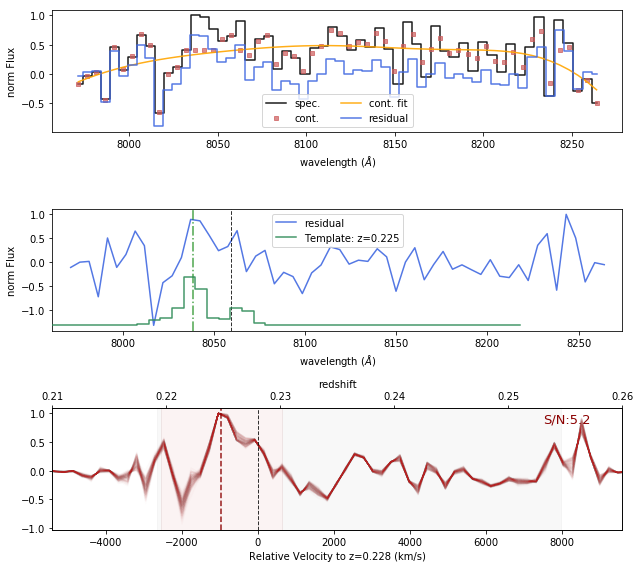

SE Objects #619   S/N med: 4.95  max: 5.51


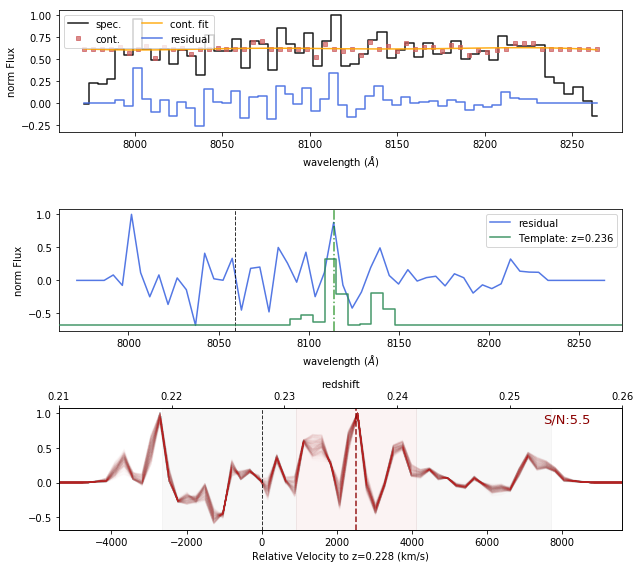

SE Objects #651   S/N med: 3.99  max: 5.01


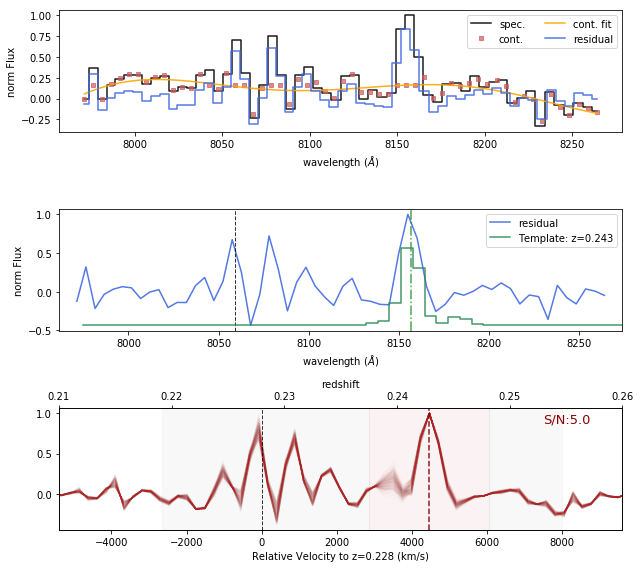

SE Objects #751   S/N med: 5.27  max: 5.72


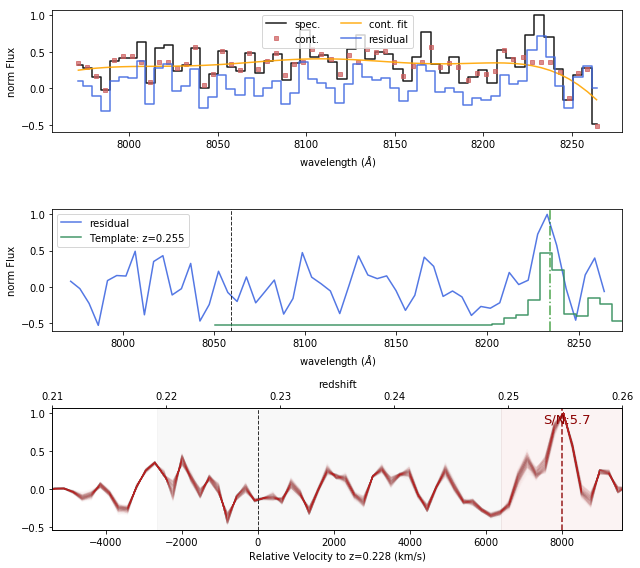

SE Objects #767   S/N med: 5.28  max: 5.6


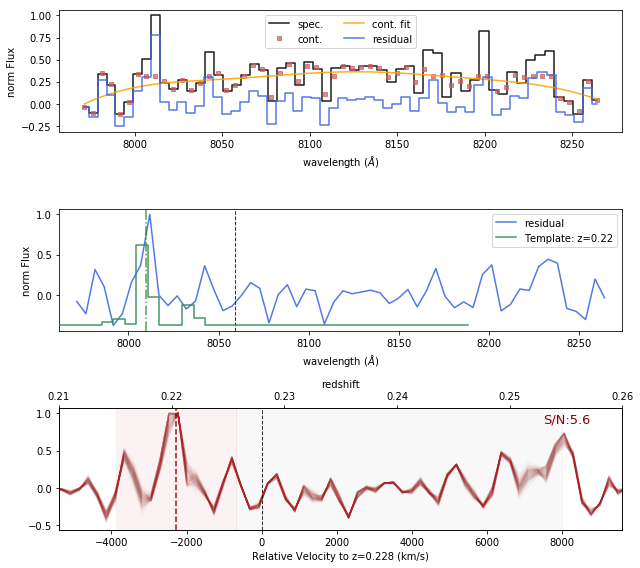

SE Objects #779   S/N med: 4.46  max: 5.04


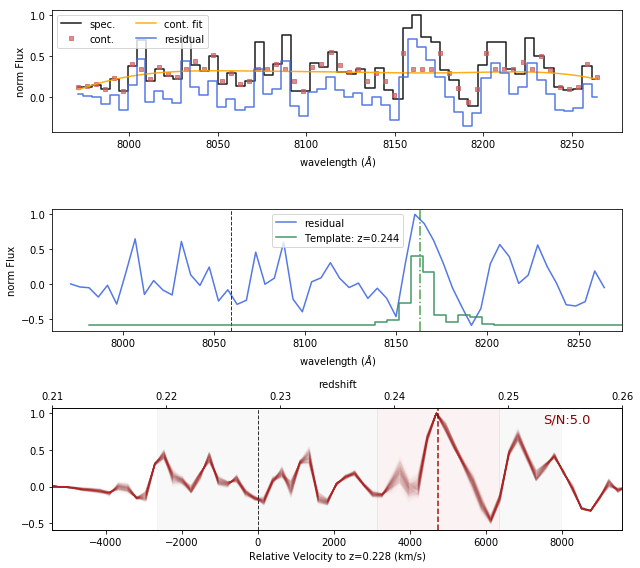

SE Objects #780   S/N med: 5.38  max: 5.68


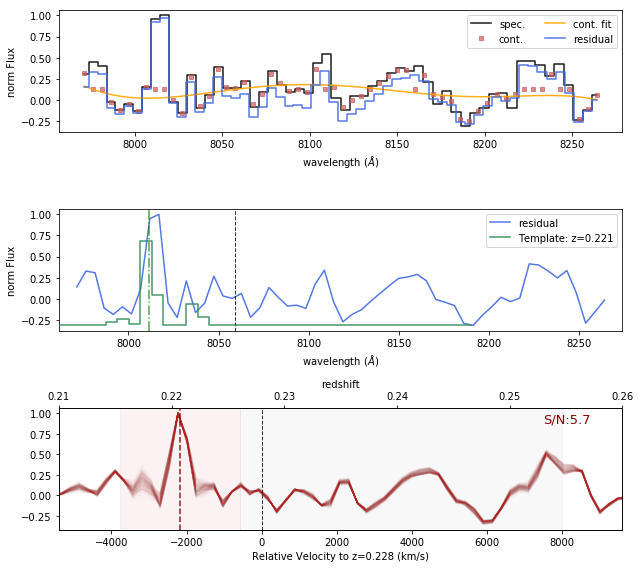

SE Objects #853   S/N med: 4.53  max: 5.13


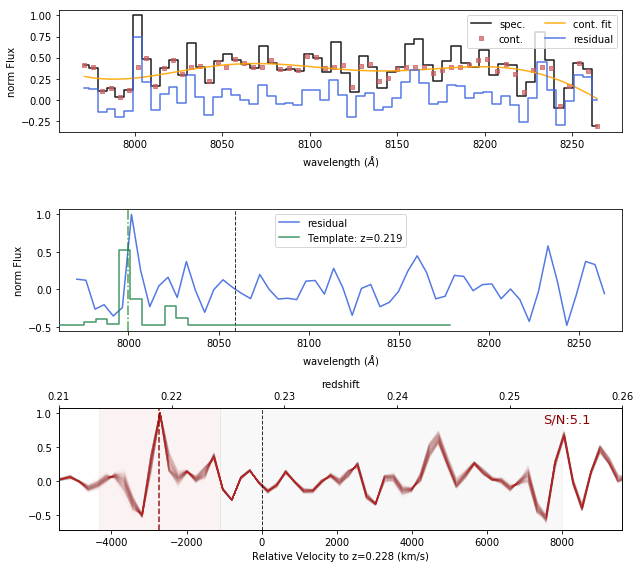

SE Objects #881   S/N med: 6.21  max: 6.71


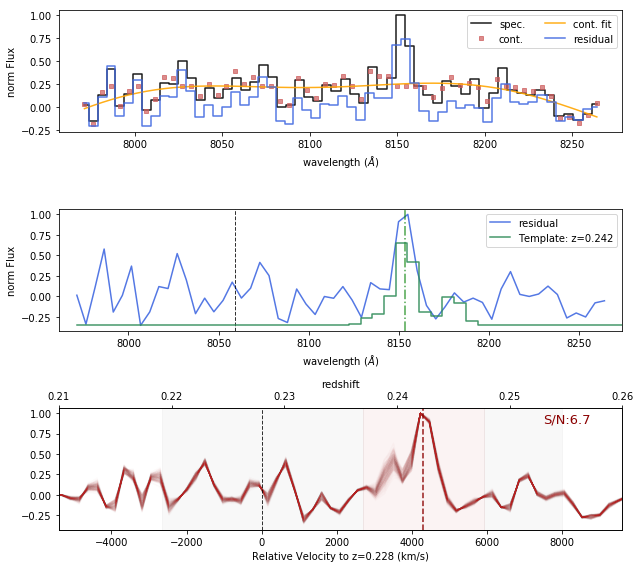

SE Objects #900   S/N med: 6.29  max: 6.6


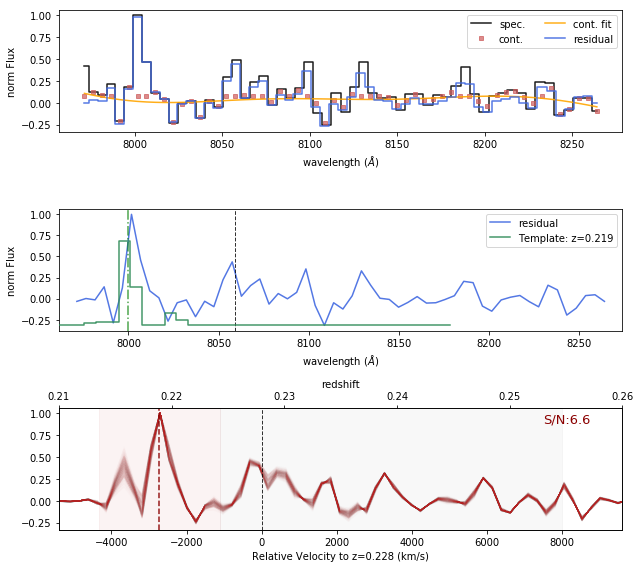

SE Objects #931   S/N med: 4.54  max: 5.24


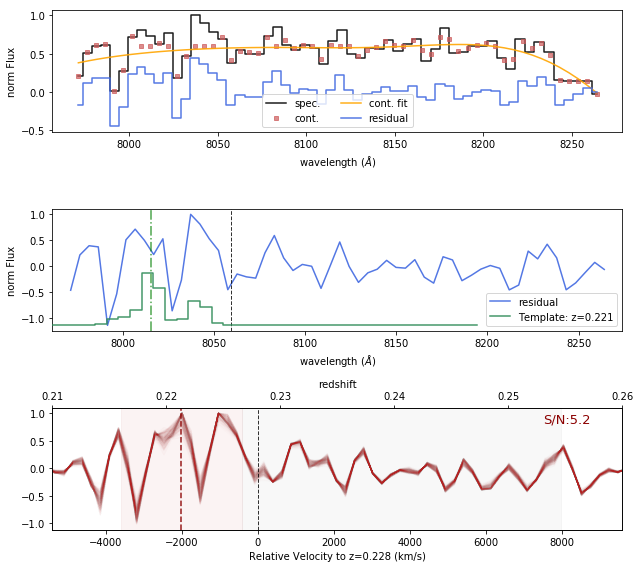

SE Objects #937   S/N med: 4.68  max: 5.23


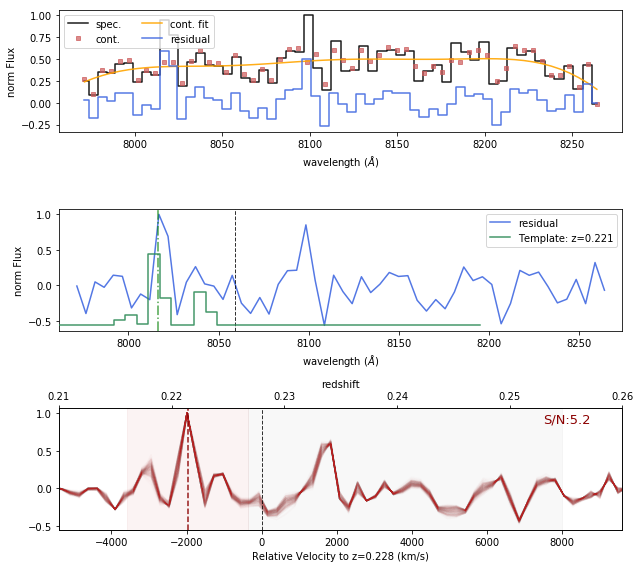

SE Objects #938   S/N med: 5.42  max: 5.65


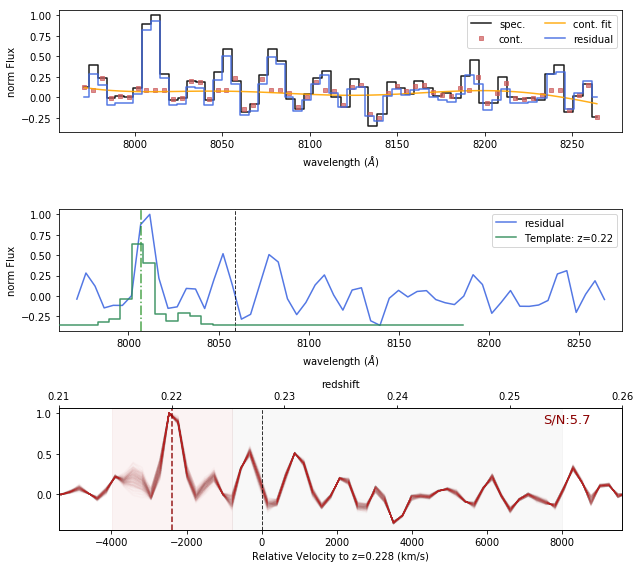

SE Objects #989   S/N med: 4.24  max: 5.02


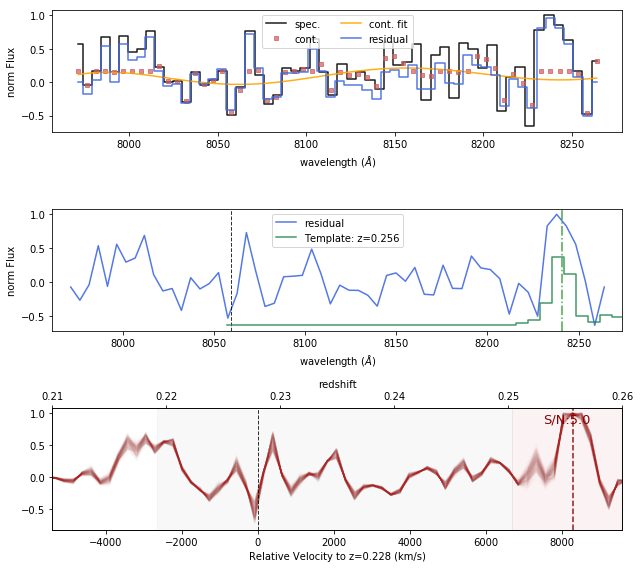

SE Objects #1018   S/N med: 5.57  max: 5.91


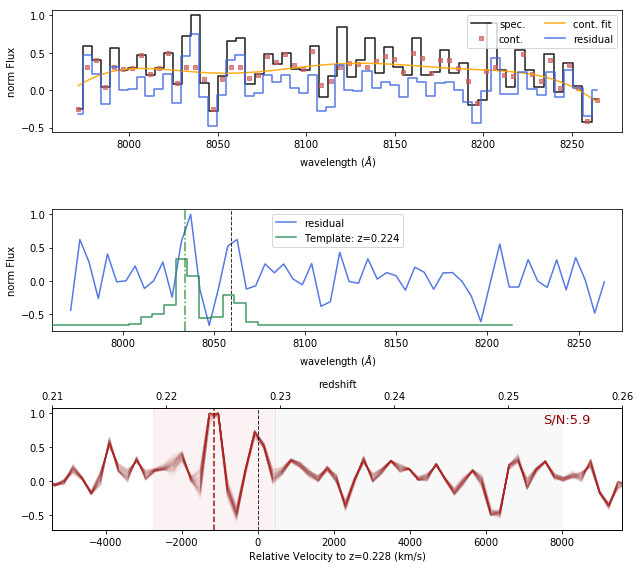

SE Objects #1055   S/N med: 5.18  max: 5.61


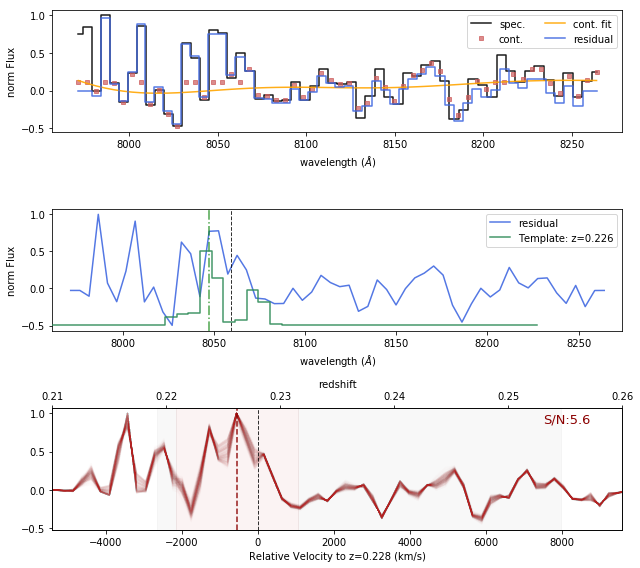

SE Objects #1082   S/N med: 6.24  max: 6.68


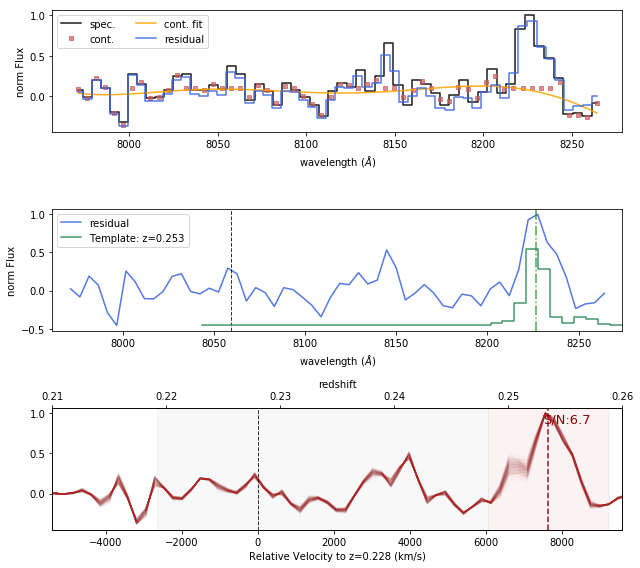

SE Objects #1083   S/N med: 5.44  max: 5.8


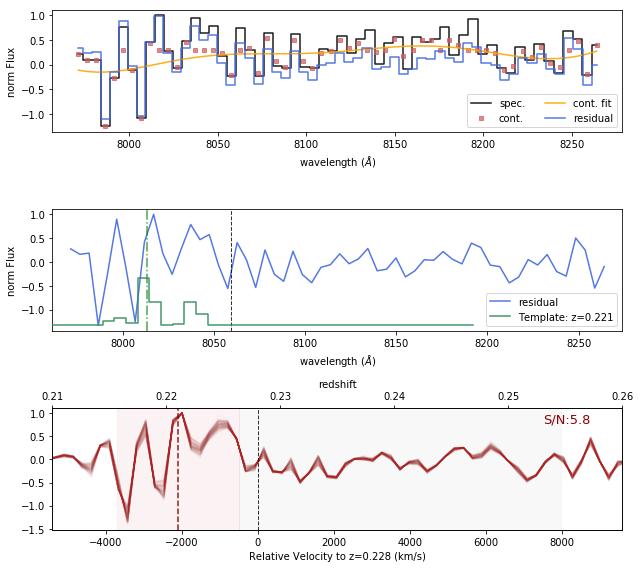

SE Objects #1089   S/N med: 4.81  max: 5.85


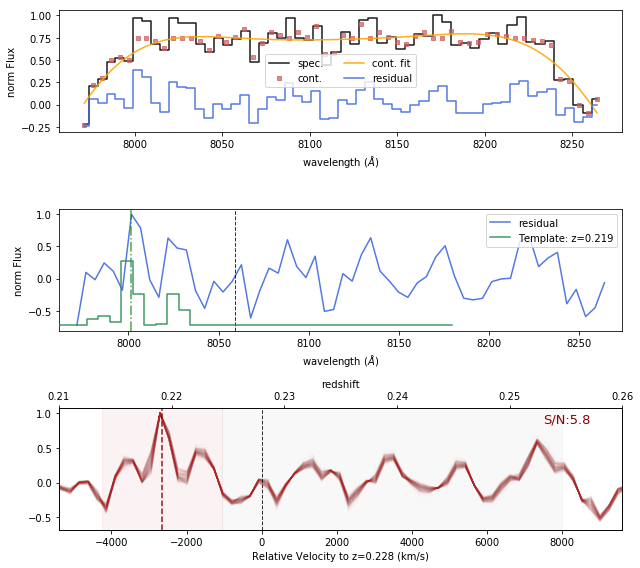

SE Objects #1092   S/N med: 4.7  max: 5.08


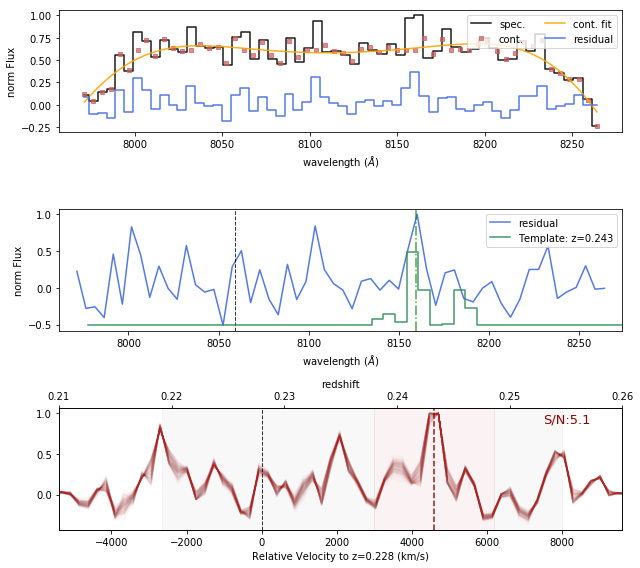

SE Objects #1109   S/N med: 5.19  max: 5.42


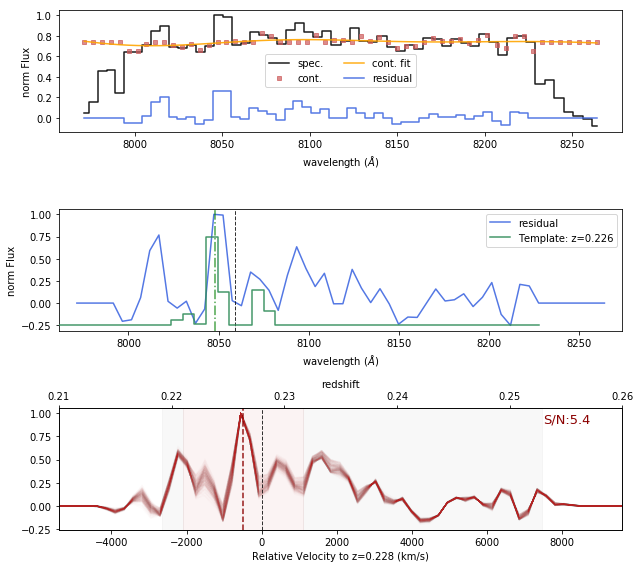

SE Objects #1120   S/N med: 5.02  max: 5.85


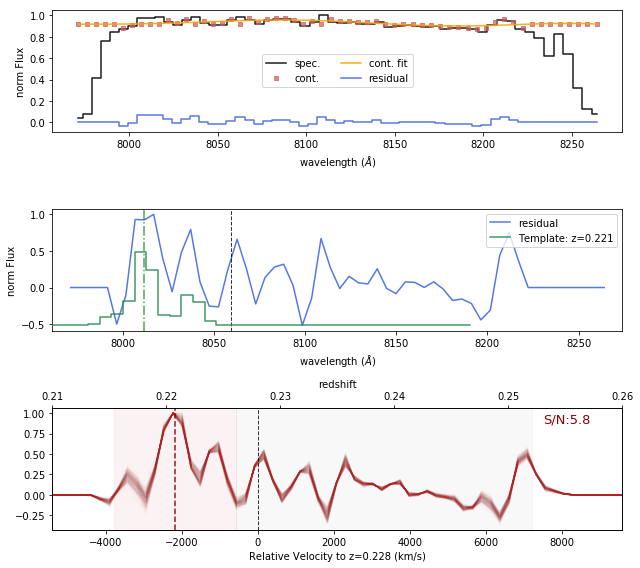

SE Objects #1146   S/N med: 4.9  max: 5.15


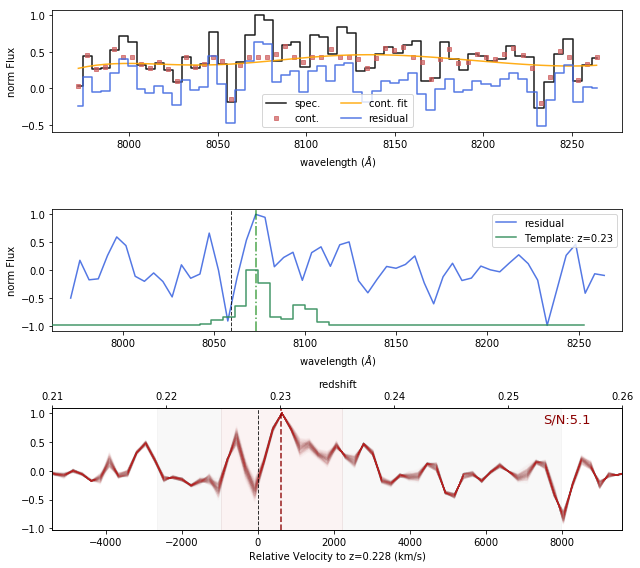

SE Objects #1169   S/N med: 6.43  max: 6.52


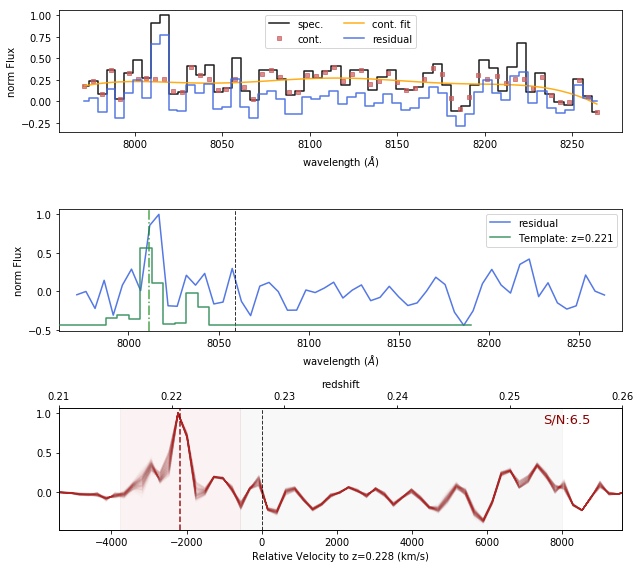

SE Objects #1196   S/N med: 5.41  max: 5.46


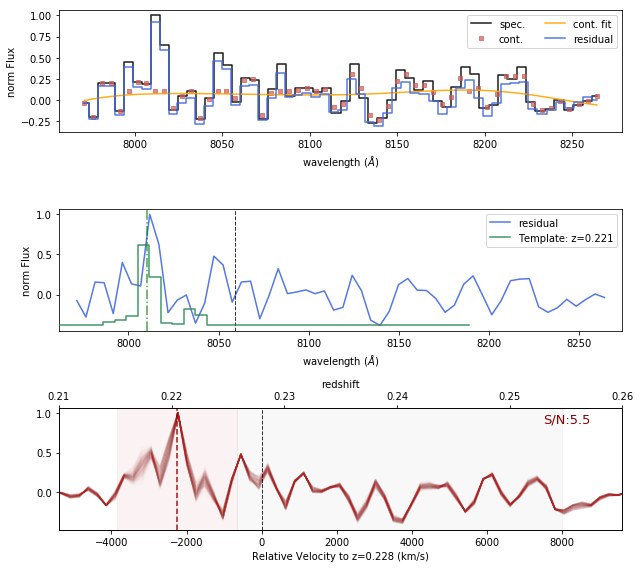

SE Objects #1267   S/N med: 5.45  max: 5.99


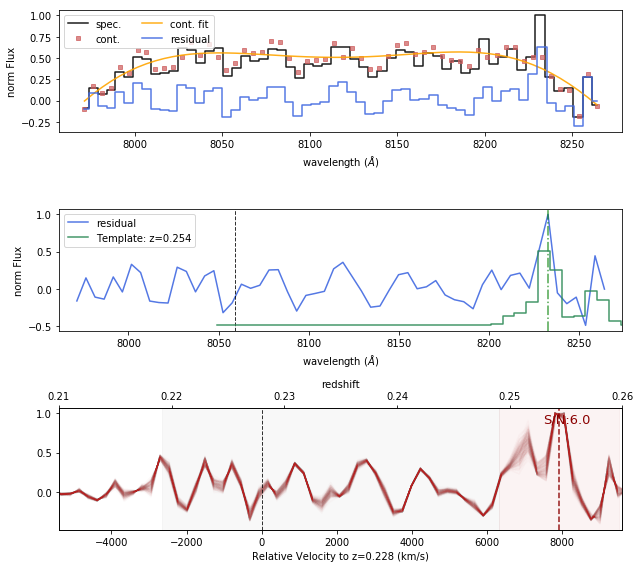

SE Objects #1289   S/N med: 4.59  max: 5.02


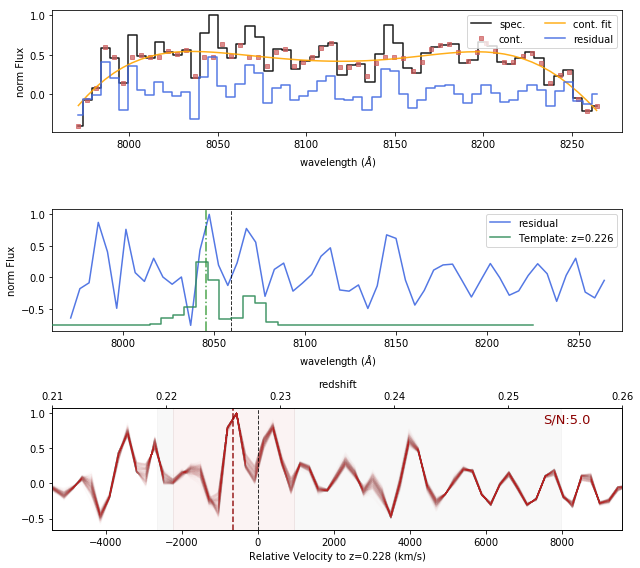

SE Objects #1293   S/N med: 5.6  max: 6.81


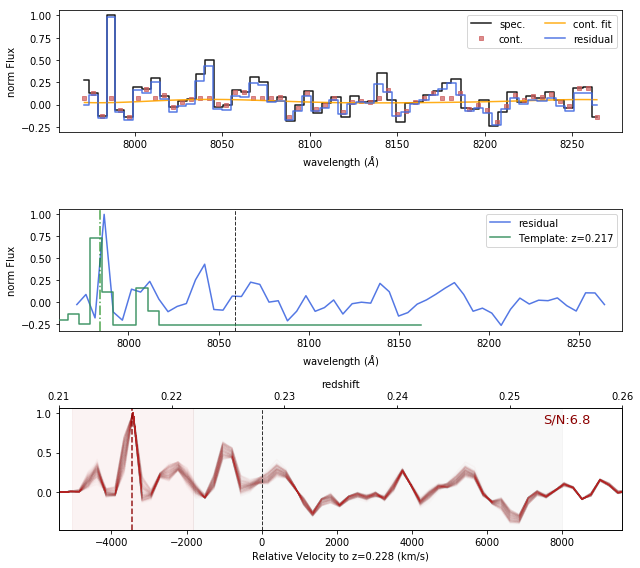

SE Objects #1343   S/N med: 4.85  max: 5.27


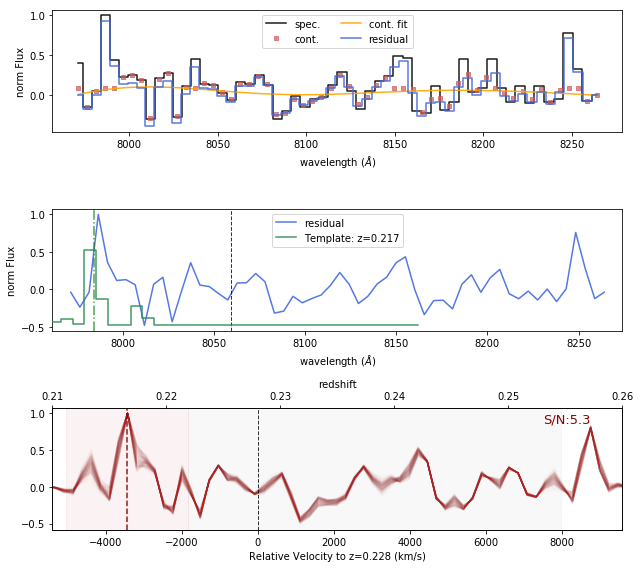

SE Objects #1378   S/N med: 6.32  max: 6.48


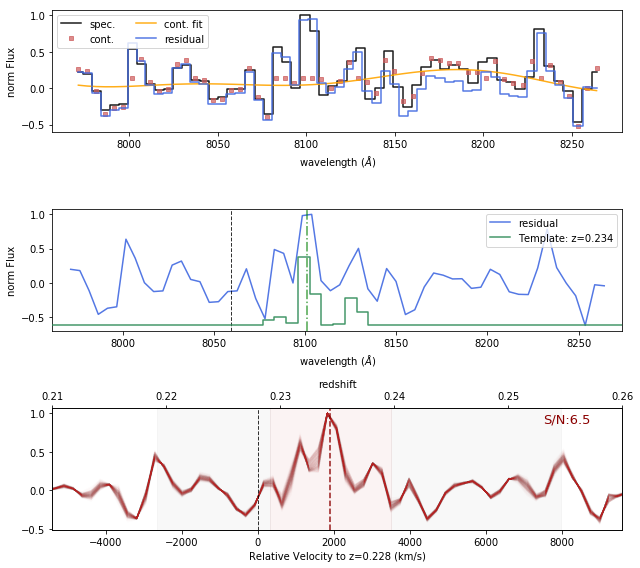

SE Objects #1381   S/N med: 4.44  max: 5.2


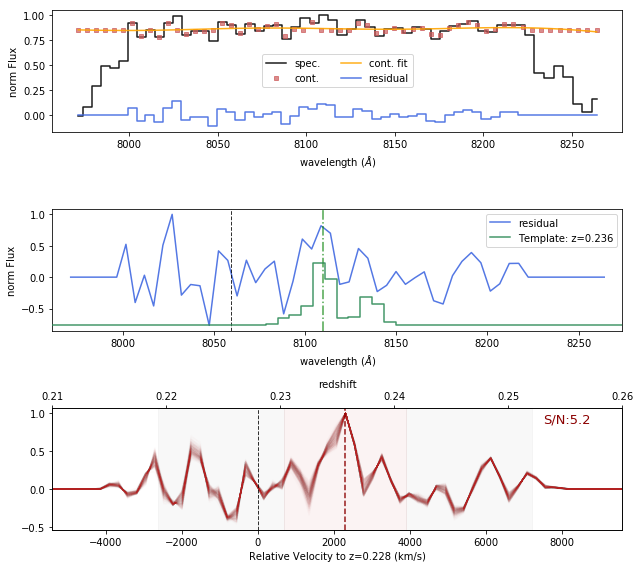

SE Objects #1429   S/N med: 6.04  max: 6.81


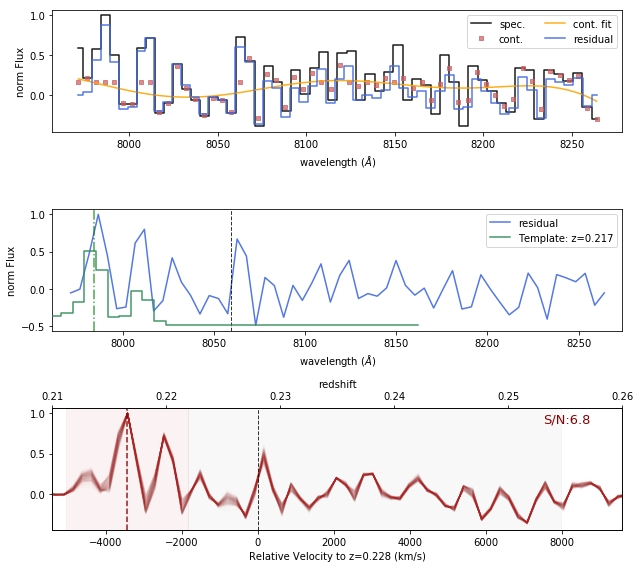

SE Objects #1452   S/N med: 4.74  max: 5.05


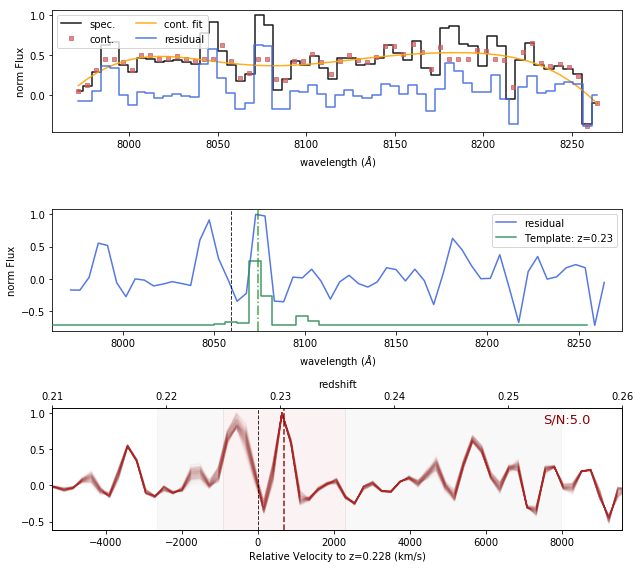

SE Objects #1456   S/N med: 6.5  max: 6.59


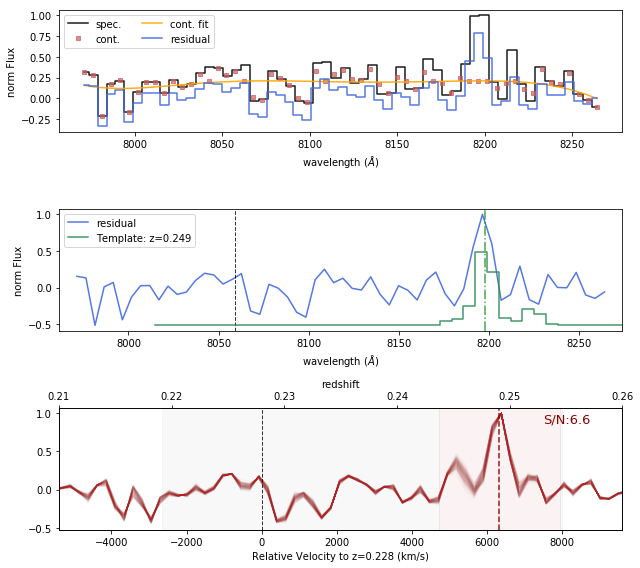

SE Objects #1467   S/N med: 5.13  max: 5.35


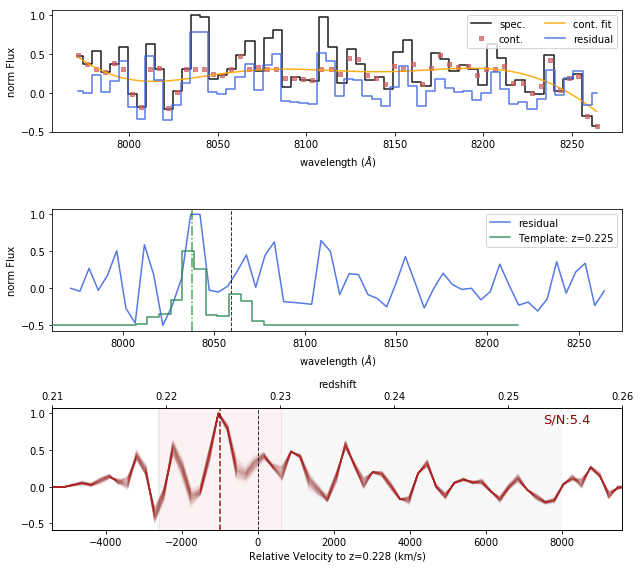

SE Objects #1487   S/N med: 5.26  max: 5.68


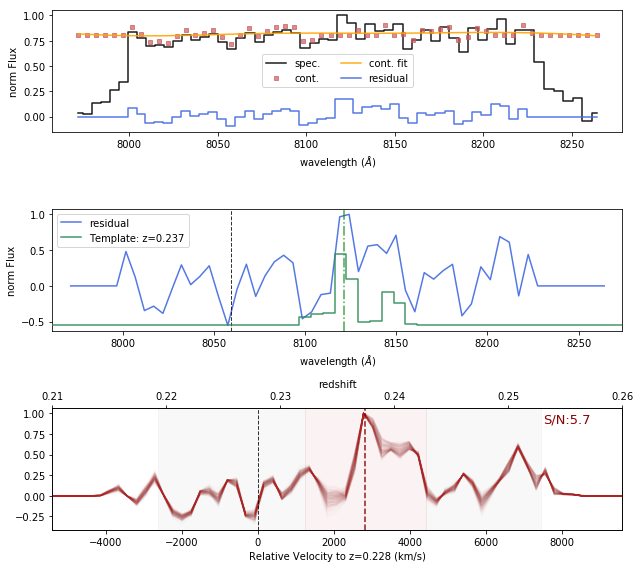

SE Objects #1513   S/N med: 4.66  max: 5.44


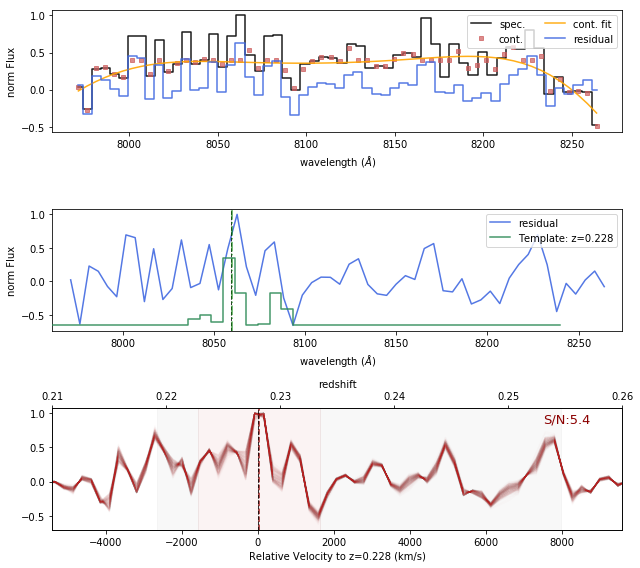

SE Objects #1540   S/N med: 4.29  max: 5.24


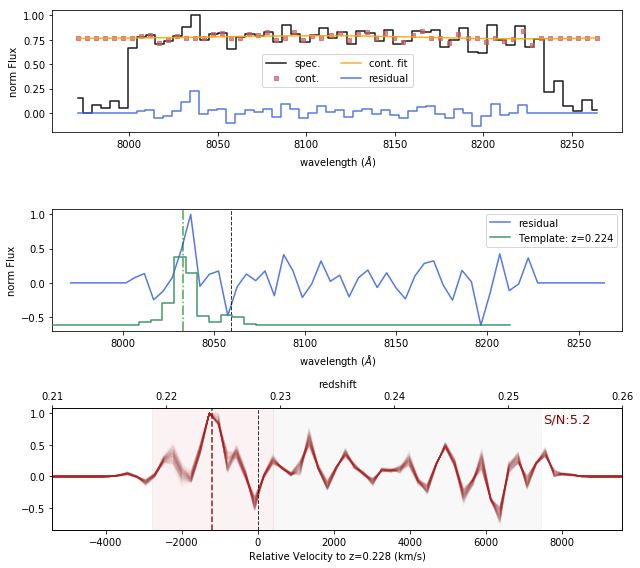

SE Objects #1542   S/N med: 6.67  max: 6.96


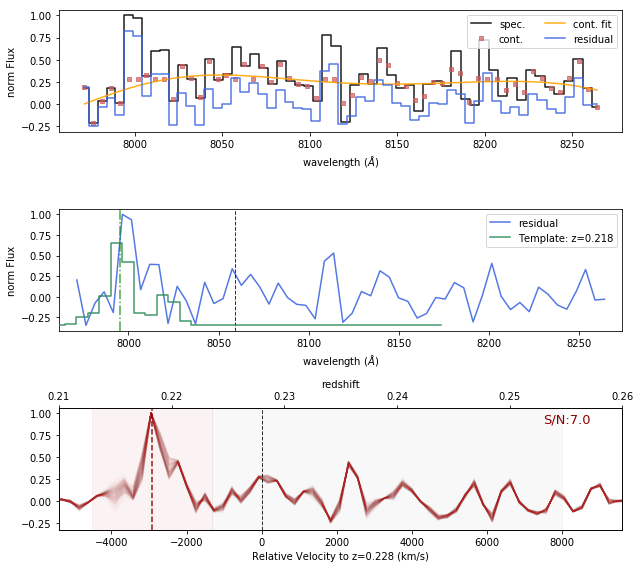

SE Objects #1558   S/N med: 5.29  max: 5.67


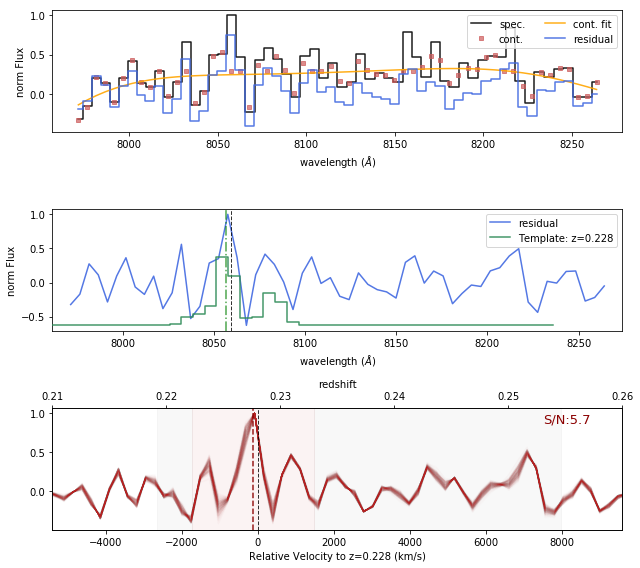

SE Objects #1563   S/N med: 4.63  max: 5.41


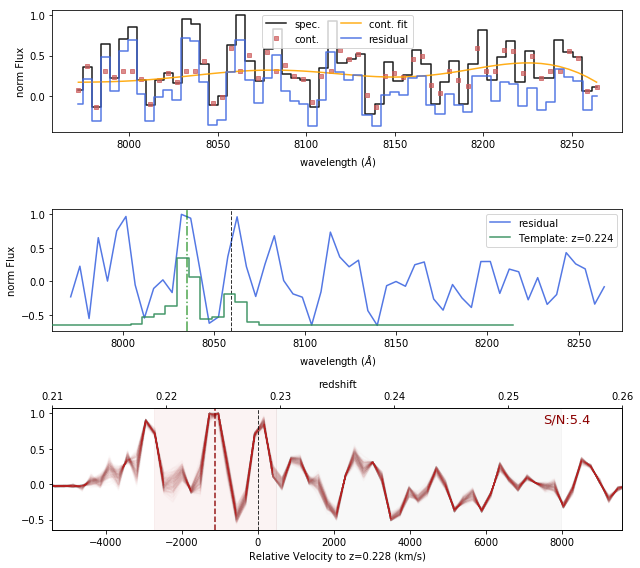

SE Objects #1609   S/N med: 5.61  max: 5.9


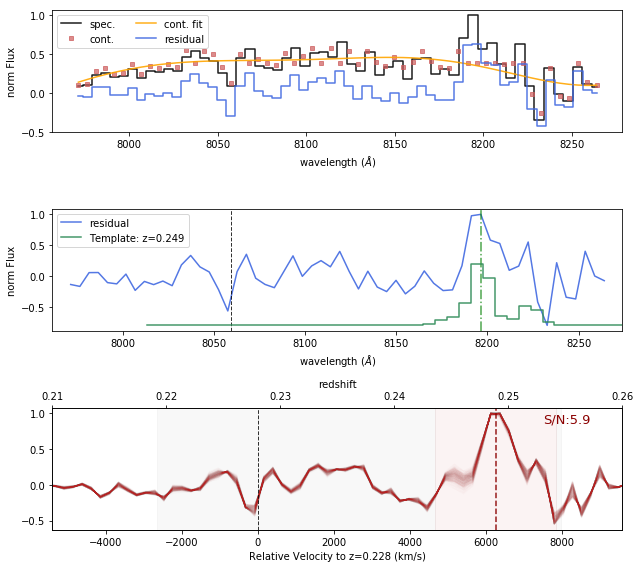

SE Objects #1616   S/N med: 5.44  max: 5.77


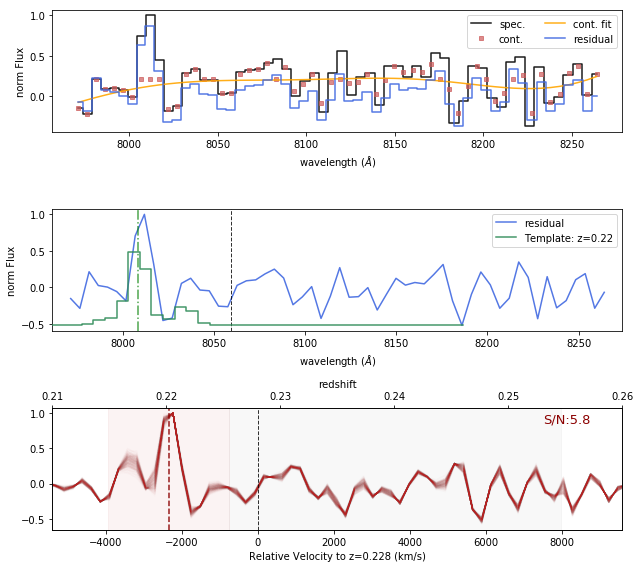

SE Objects #1625   S/N med: 5.61  max: 6.15


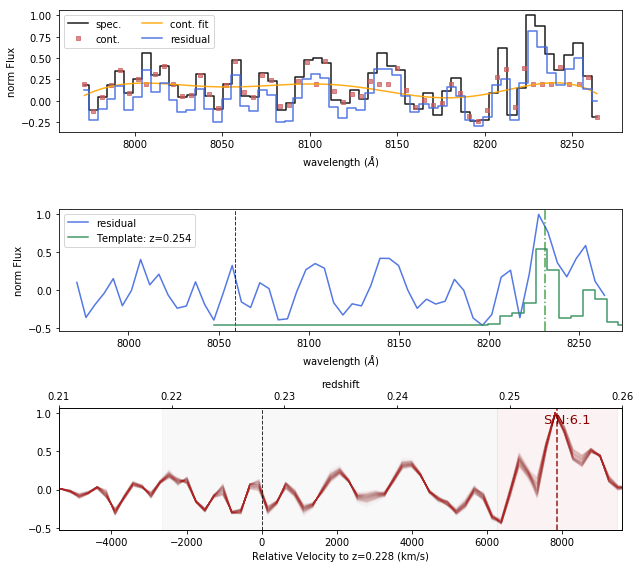

SE Objects #1626   S/N med: 5.7  max: 6.12


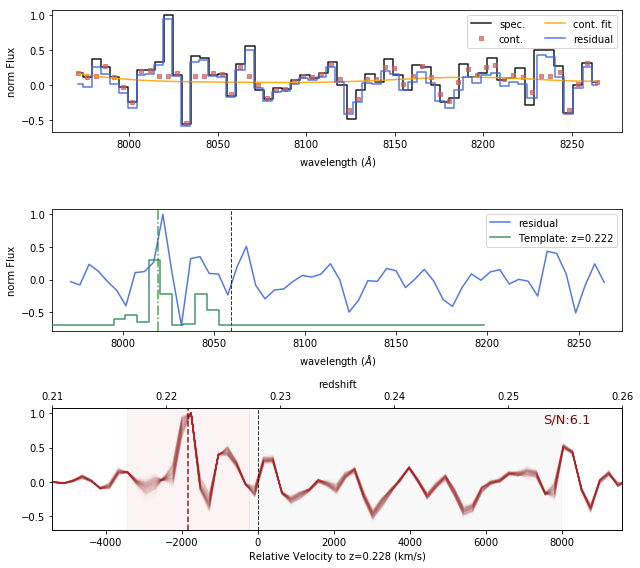

SE Objects #1645   S/N med: 4.91  max: 5.46


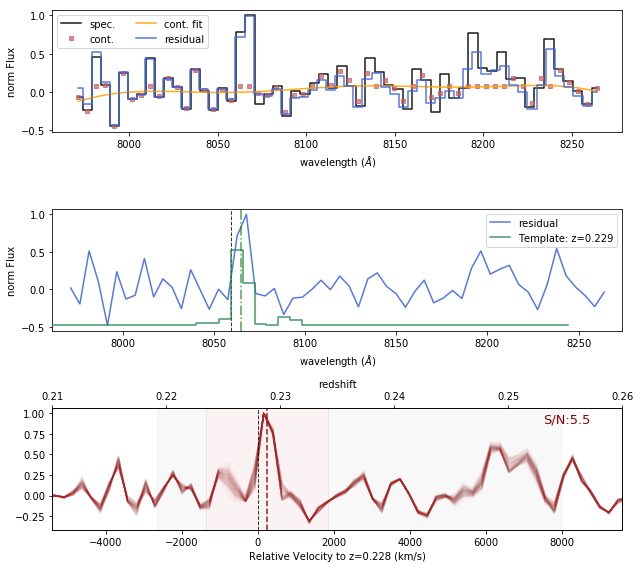

SE Objects #1653   S/N med: 4.11  max: 5.11


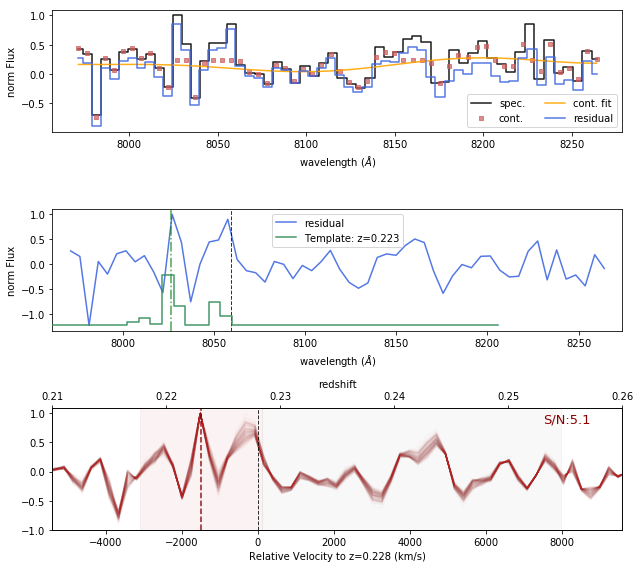

SE Objects #1669   S/N med: 4.29  max: 5.27


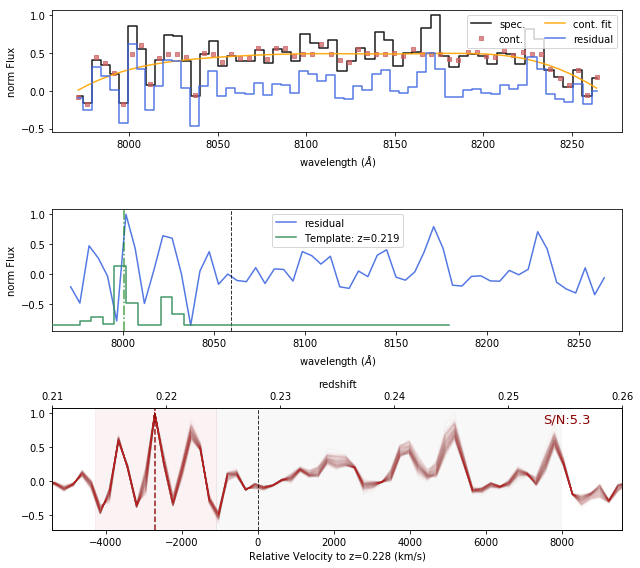

SE Objects #1680   S/N med: 5.65  max: 5.75


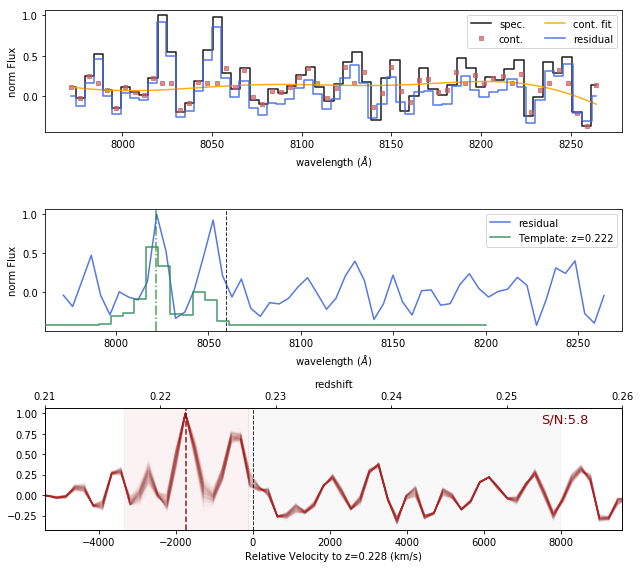

SE Objects #1712   S/N med: 5.33  max: 5.9


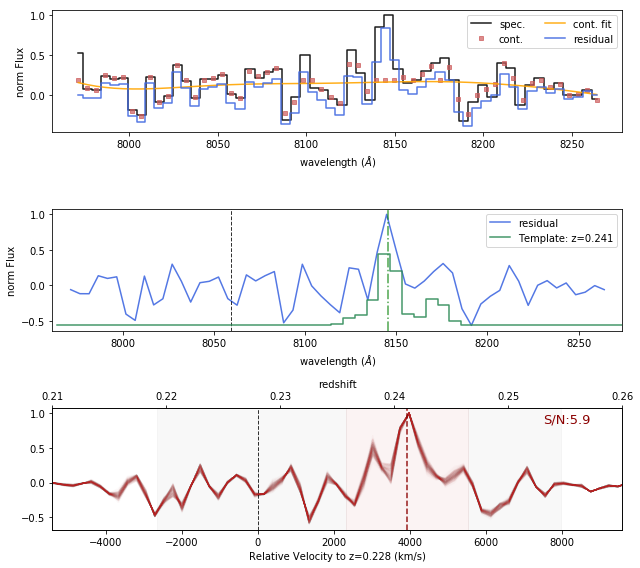

SE Objects #1718   S/N med: 4.08  max: 5.17


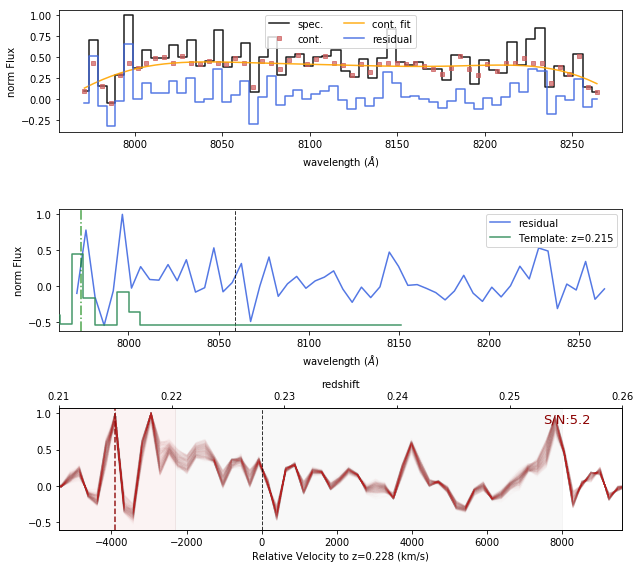

SE Objects #1722   S/N med: 4.13  max: 5.17


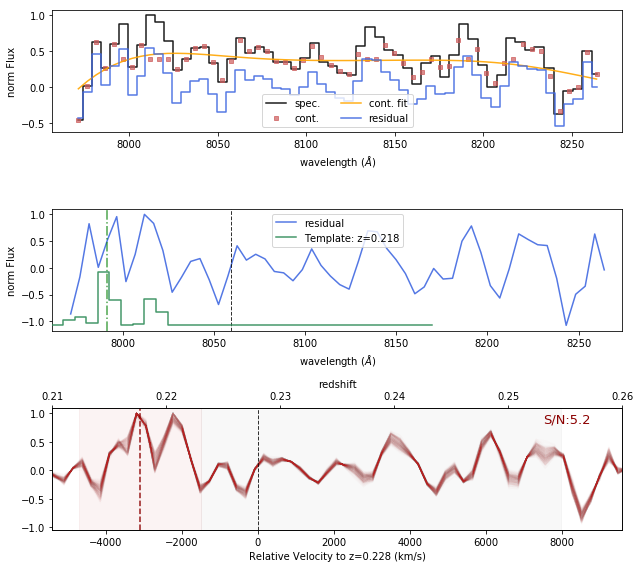

SE Objects #1729   S/N med: 4.79  max: 5.59


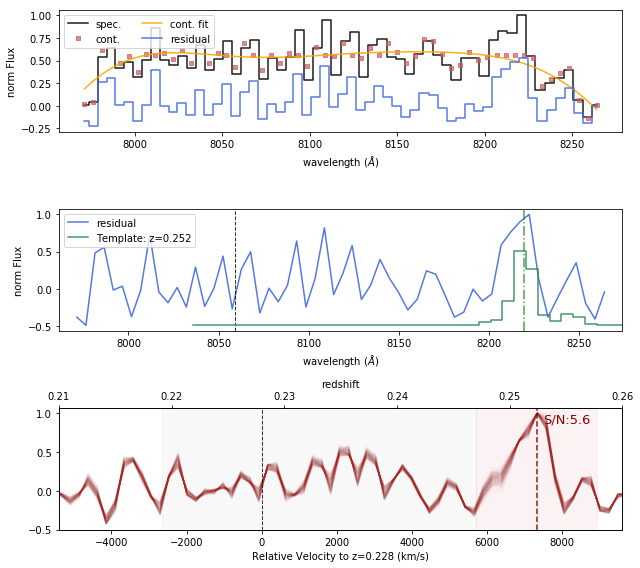

SE Objects #1758   S/N med: 6.61  max: 6.8


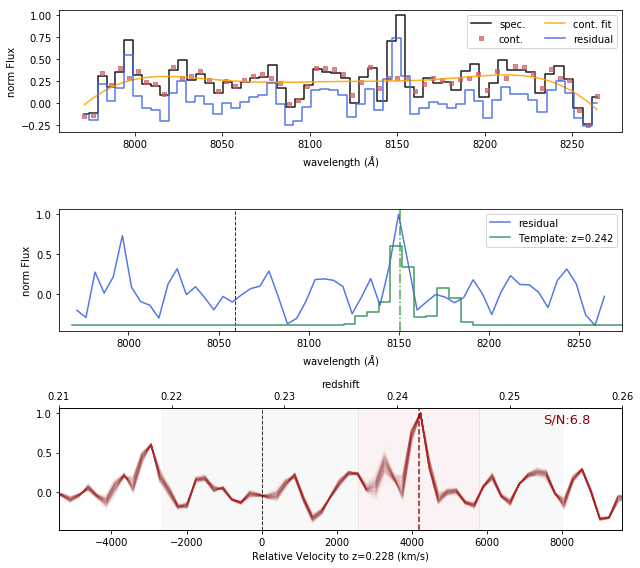

SE Objects #1794   S/N med: 4.68  max: 5.32


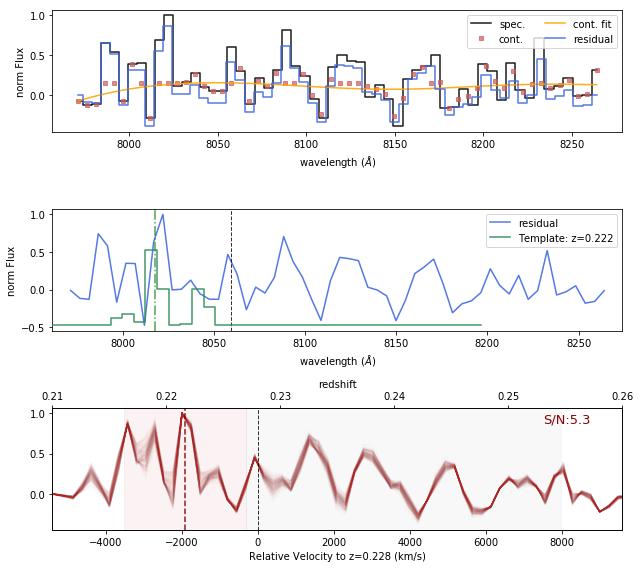

SE Objects #1821   S/N med: 4.62  max: 5.14


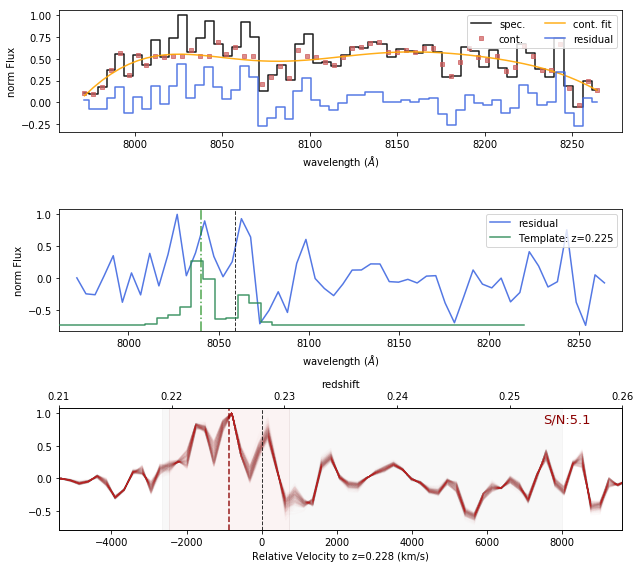

SE Objects #1827   S/N med: 5.03  max: 5.49


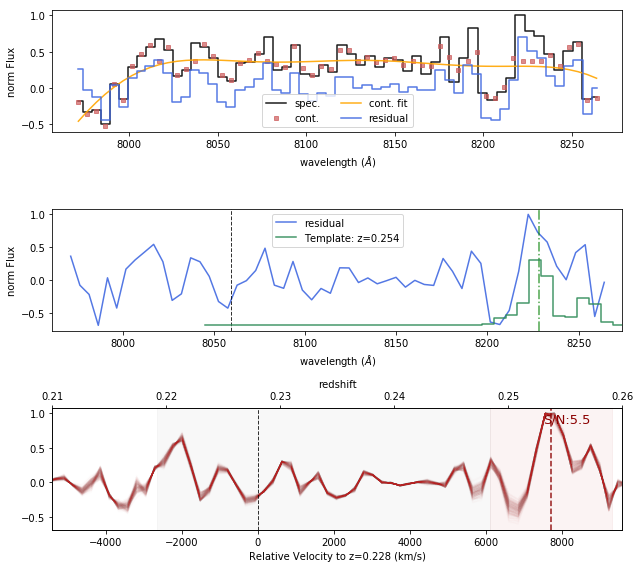

SE Objects #1835   S/N med: 5.71  max: 5.82


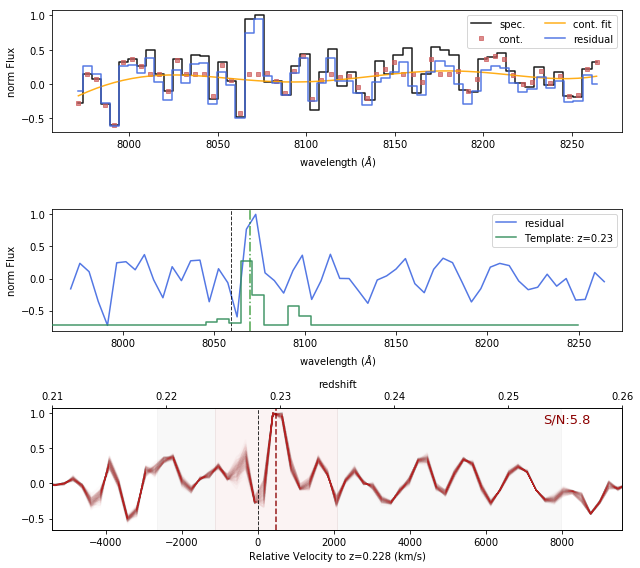

SE Objects #1838   S/N med: 4.59  max: 5.24


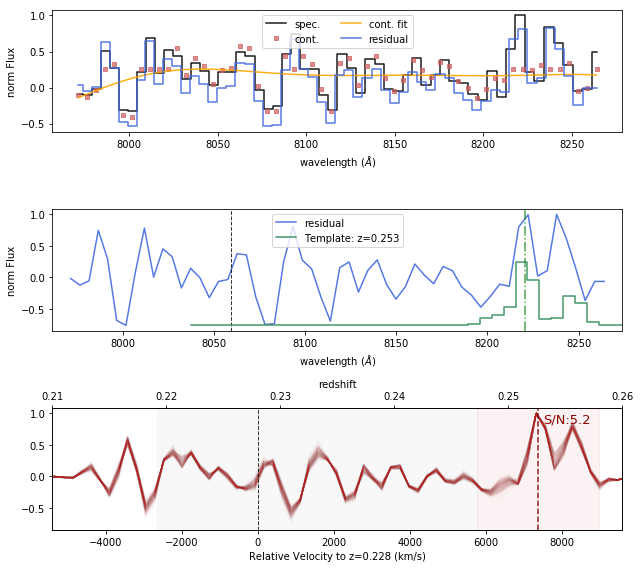

SE Objects #1846   S/N med: 4.36  max: 5.24


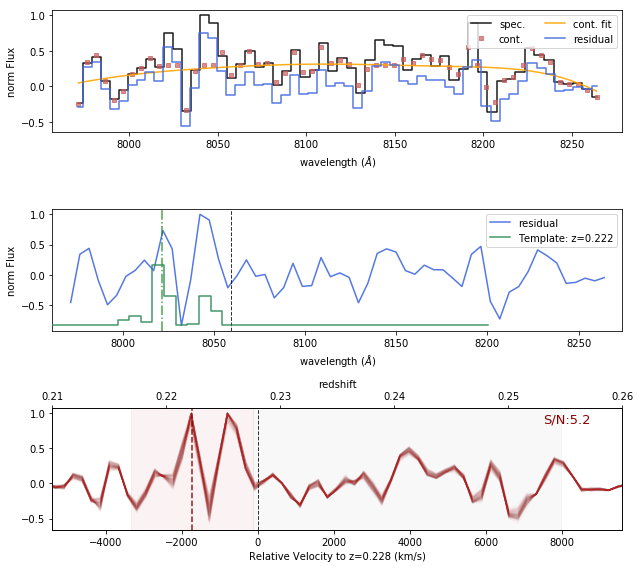

SE Objects #1883   S/N med: 4.62  max: 5.02


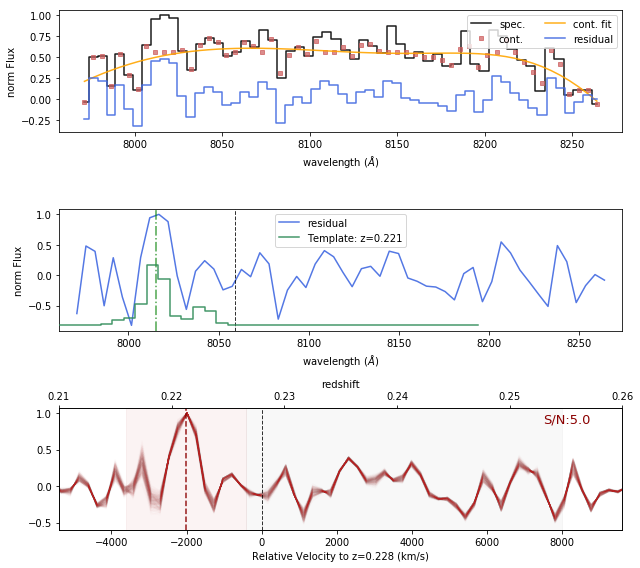

SE Objects #1909   S/N med: 6.35  max: 6.7


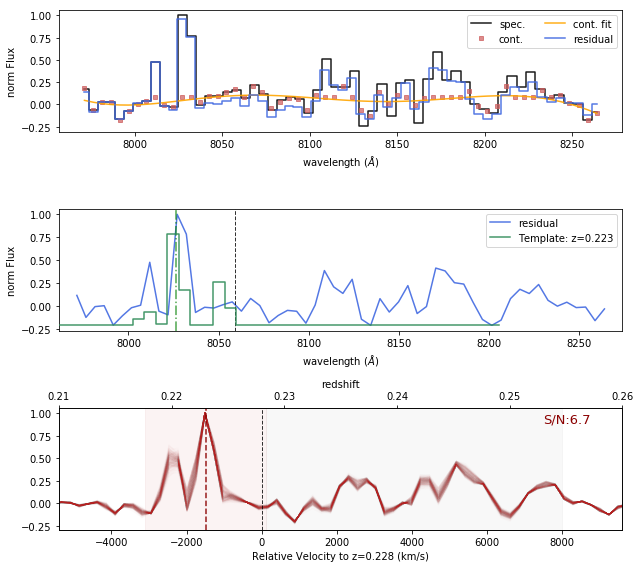

SE Objects #1917   S/N med: 5.65  max: 6.01


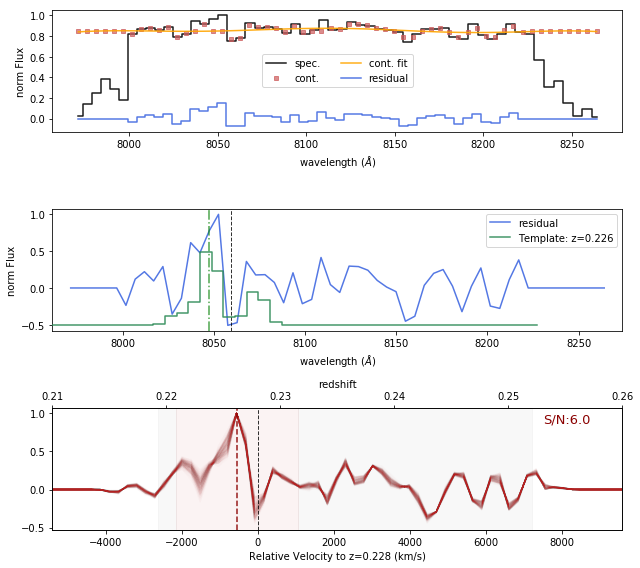

SE Objects #1926   S/N med: 4.8  max: 5.97


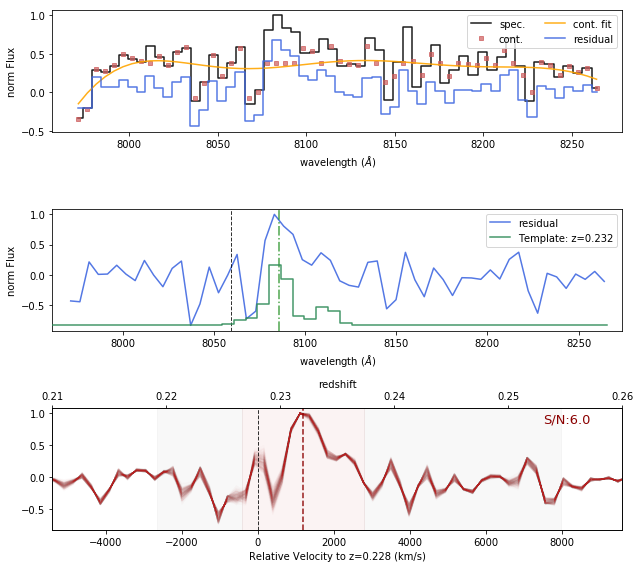

SE Objects #2047   S/N med: 5.88  max: 6.94


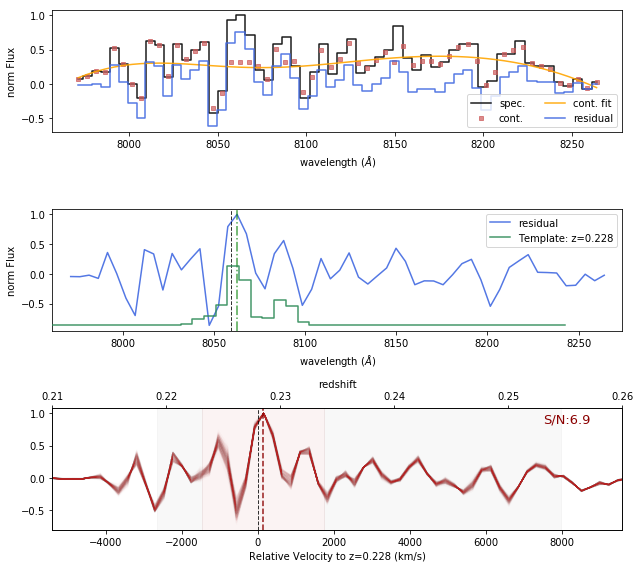

SE Objects #2087   S/N med: 5.72  max: 6.13


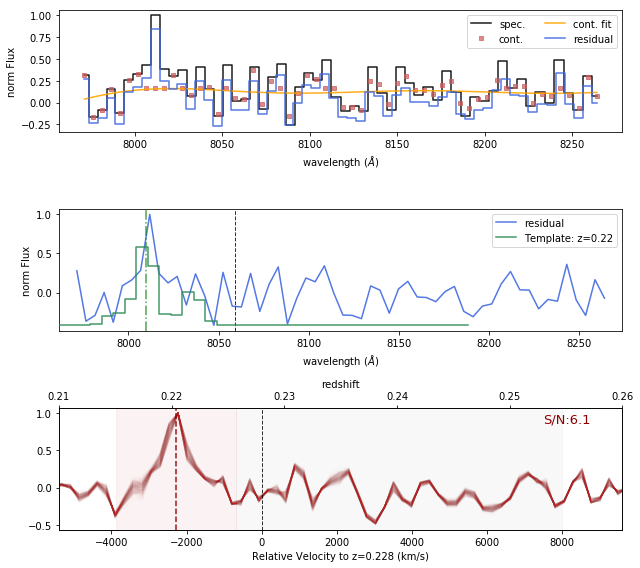

SE Objects #2129   S/N med: 4.9  max: 5.23


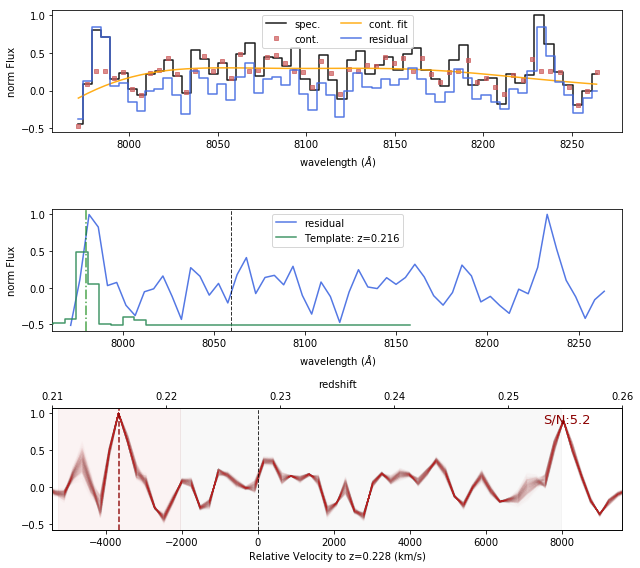

SE Objects #2146   S/N med: 5.28  max: 6.03


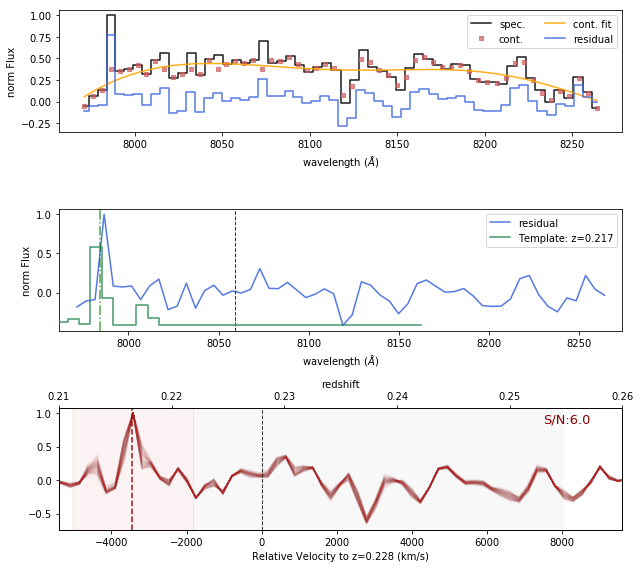

SE Objects #2152   S/N med: 6.09  max: 6.62


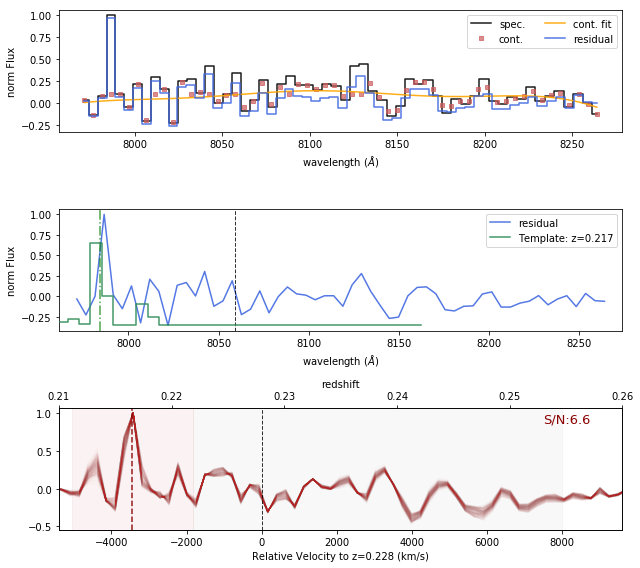

SE Objects #2160   S/N med: 5.85  max: 6.16


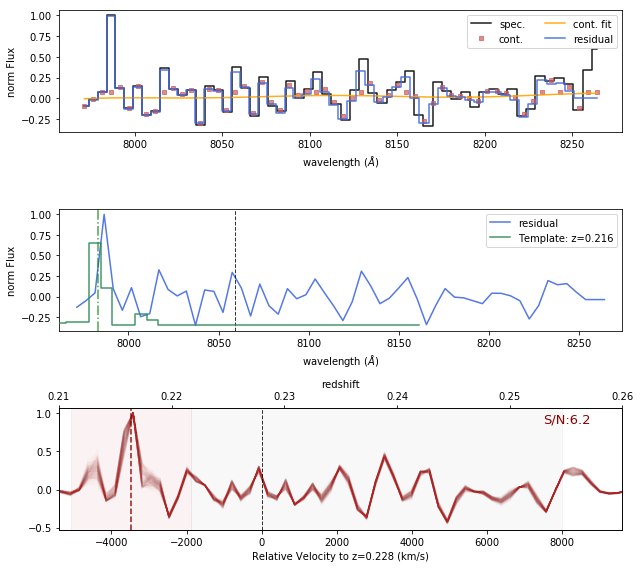

SE Objects #2161   S/N med: 5.62  max: 5.81


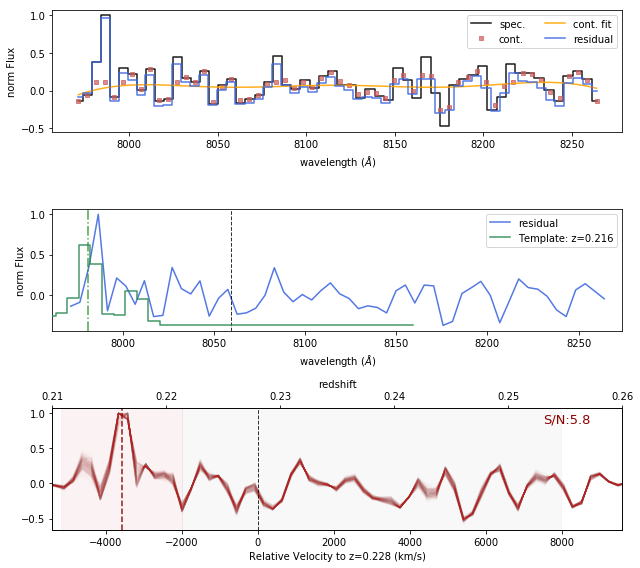

SE Objects #2184   S/N med: 5.85  max: 6.4


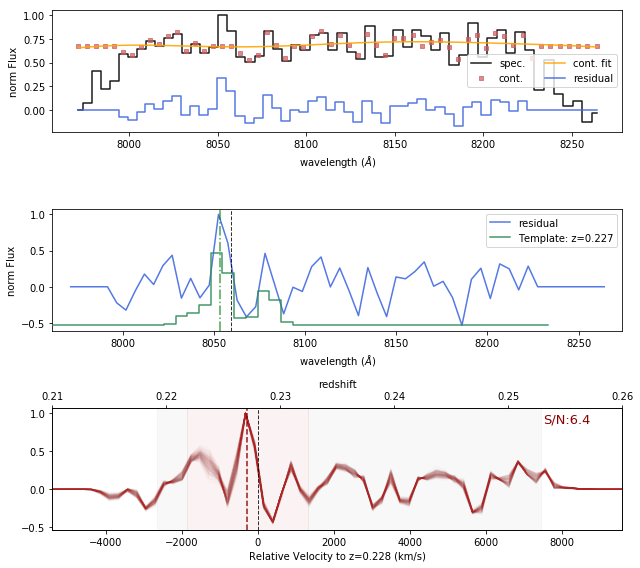

In [46]:
cond = cond2 
print(np.sum(cond))
for j, (cc_num) in enumerate(Datacube.cc_nums[cond]):
    ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(cc_num)
    plt.savefig("./A2390C/fig/xcorr_gau/SNb/CC#%d.png"%(cc_num), dpi=150)
    plt.show()
    plt.close()

In [36]:
Datacube.save_cc_fits(save_path='./A2390C/')

In [47]:
#Composite 
import re
import glob
el_ls = glob.glob("./A2390C/fig/xcorr_gau/SNb/*.png")
for el in el_ls:
    img_cc = plt.imread(el)
    version, ind = re.compile(r'\d+').findall(el)
    img_spec = plt.imread("./A2390C/fig/spec_v2/SE#%s.png"%ind)
    img_thumb = plt.imread("./A2390C/fig/img_thumb_v2/SE#%s.png"%ind)
    plt.figure(figsize=(18,9))
    ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((2, 3), (0, 2), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid((2, 3), (1, 2), colspan=1, rowspan=1)
    ax1.imshow(img_cc)
    ax2.imshow(img_spec)
    ax3.imshow(img_thumb)
    ax1.axis("off")
    ax2.axis("off")
    ax3.axis("off")
    plt.suptitle("Flag: 1",fontsize=18)
    plt.tight_layout()
    plt.savefig("./A2390C/fig/candidate_v2/SNb/#EL-%s.png"%ind,dpi=200)
    plt.close()

## 5. Centroid Analysis

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import glob
import re
import warnings
warnings.filterwarnings('ignore')
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390C_cube.fits", name="A390C", z0=0.228, SE_catalog="./A2390C/SE/A2390C_run3.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2390C_mask.fits')
Datacube.read_seg('./A2390C/SE/segment_run3.fits')
Datacube.read_spec('./A2390C/A2390C-spec_v2.fits')
Datacube.read_cc('./A2390C/A2390C-cc.fits')

id_BCG = np.argmin((Datacube.Tab_SE["X_IMAGE"]-980)**2 + (Datacube.Tab_SE["Y_IMAGE"]-1315)**2)
pos_BCG = Datacube.assign_BCG_position(id_BCG=id_BCG)

In [4]:
Datacube.wavl[-1]-Datacube.wavl[0]

292.72033974014266

In [2]:
el_ls_v = glob.glob("./A2390C/fig/candidate_v2/visual/*.png")
Num_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_v]).astype("int"))
Num_v

array([  12,   14,   34,   42,  114,  121,  151,  167,  173,  227,  228,
        285,  325,  373,  374,  375,  382,  397,  444,  463,  494,  518,
        525,  558,  562,  574,  583,  589,  600,  607,  633,  646,  651,
        684,  711,  738,  751,  780,  781,  831,  871,  881,  901,  919,
        934,  946,  969, 1051, 1082, 1109, 1111, 1169, 1212, 1222, 1256,
       1259, 1267, 1272, 1279, 1297, 1315, 1317, 1319, 1323, 1347, 1363,
       1371, 1387, 1390, 1392, 1403, 1406, 1445, 1452, 1456, 1469, 1495,
       1501, 1504, 1510, 1542, 1555, 1609, 1616, 1625, 1638, 1645, 1668,
       1680, 1686, 1697, 1712, 1713, 1715, 1738, 1758, 1773, 1776, 1835,
       1838, 1858, 1870, 1877, 1883, 1909, 1920, 1930, 1984, 2066, 2114,
       2129, 2136, 2153, 2159, 2166, 2174])

Text(0.5,0,'A2390 Candidate Redshift')

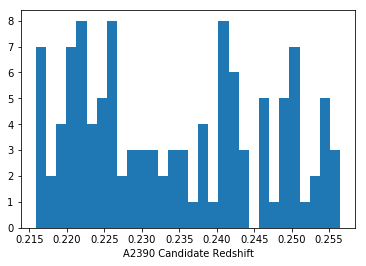

In [3]:
plt.hist(Datacube.z_best[Num_v-1],bins=30)
plt.xlabel("A2390 Candidate Redshift")

In [5]:
print(Num_v[(Datacube.z_best[Num_v-1]<0.245)&(Datacube.z_best[Num_v-1]>.235)])

[ 121  167  373  562  646  651  881 1279 1315 1319 1371 1403 1469 1495
 1501 1510 1638 1668 1686 1697 1712 1715 1758 1776 2159]


In [6]:
8160/6563.

1.2433338412311443

PA: -150.713,  Cluster-centric angle: 0.000


(150.7134064860382, 1.99902556930906, 0.0)

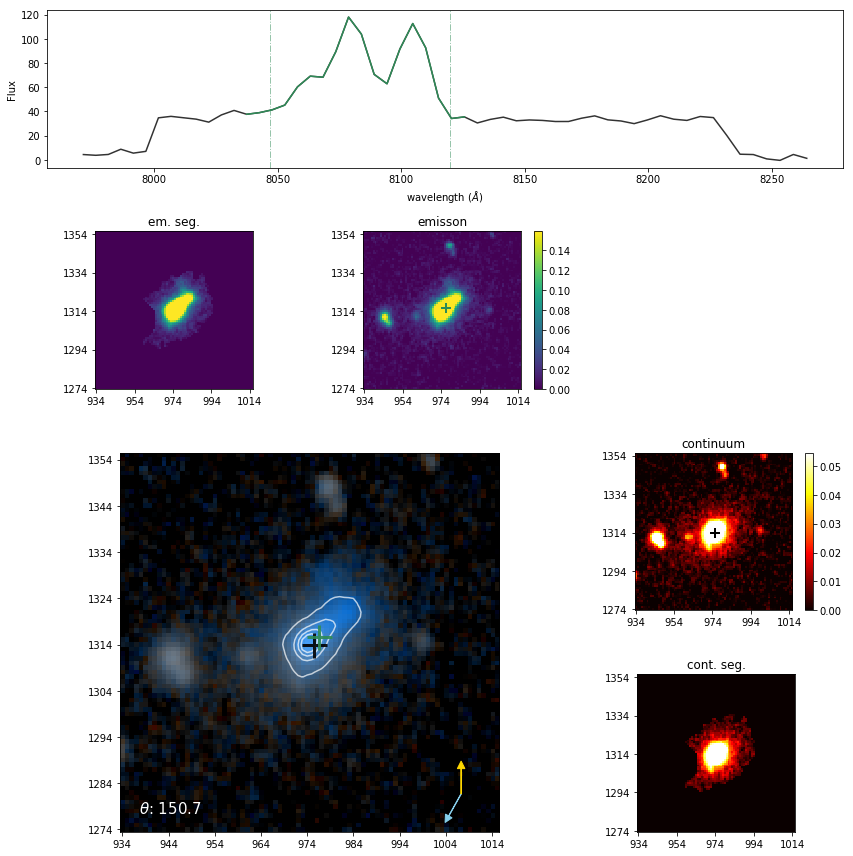

In [3]:
Datacube.centroid_analysis(num=1877, centroid_type='ISO2')

optimal aperture:2.9
PA: -141.385,  Cluster-centric angle: 0.000


(141.38505128542315, 2.296802409091924, 0.0)

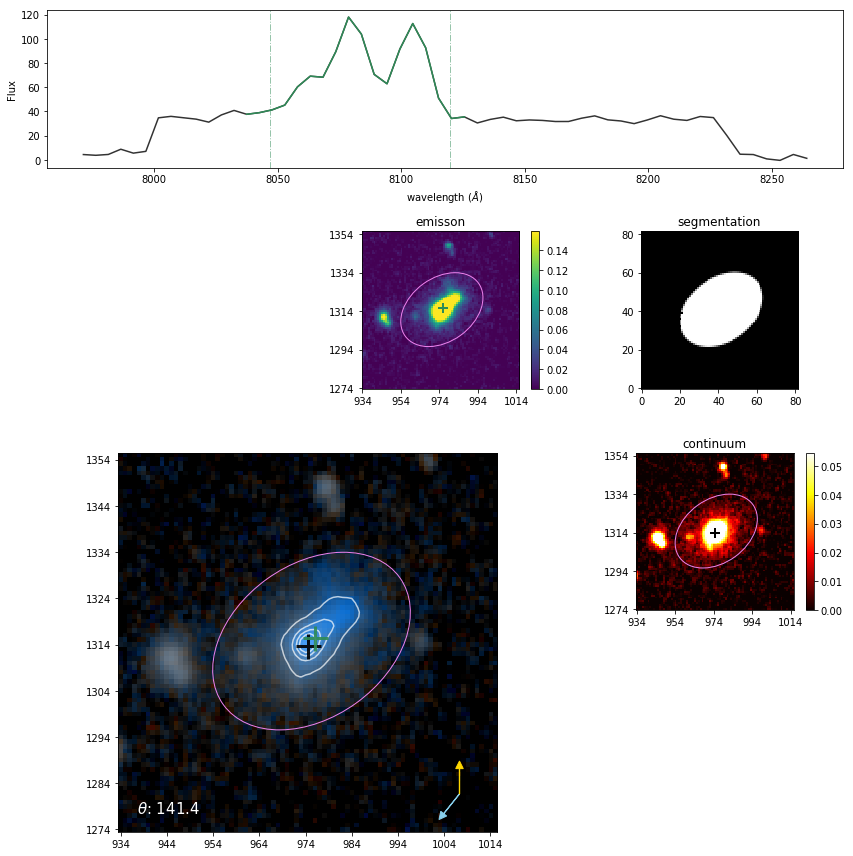

In [4]:
Datacube.centroid_analysis(num=1877, centroid_type='APER')

optimal aperture:2.5
centroid: 15.340029463441708 15.234356736623514
centroid: 15.354908243458341 15.237525979371144
PA: -122.584,  Cluster-centric angle: -125.134


(2.549934912126133, 0.5705446482163762, 489.07736779508616)

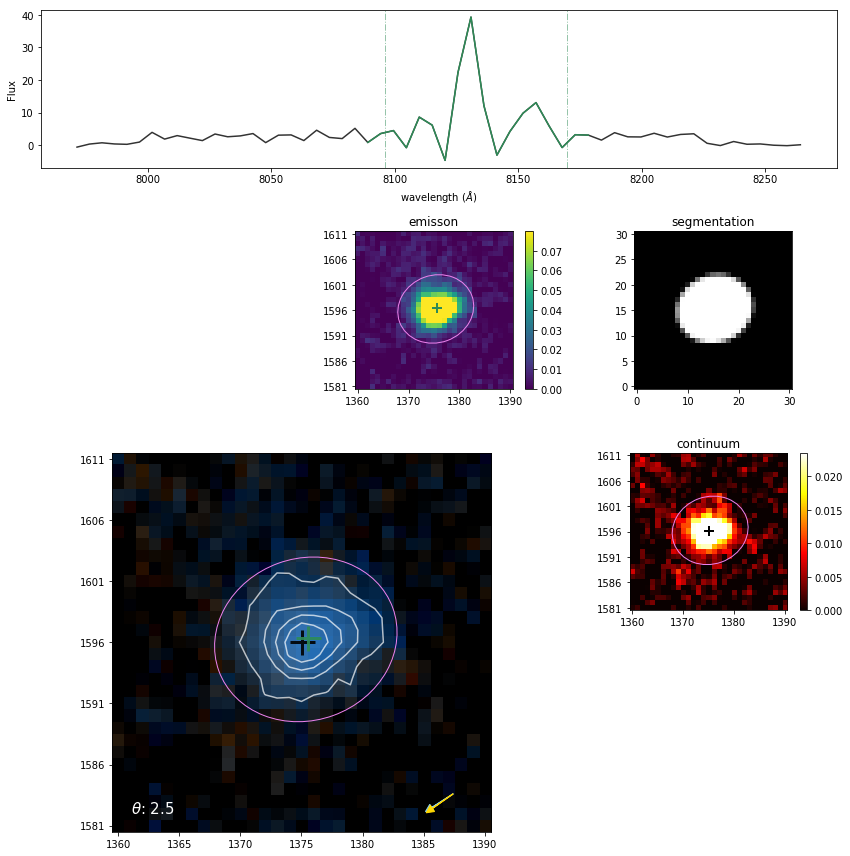

In [3]:
Datacube.centroid_analysis(num=1638, centroid_type='APER')

PA: -118.096,  Cluster-centric angle: -125.134


(7.0377953182589295, 0.5197277600626453, 489.07736779508616)

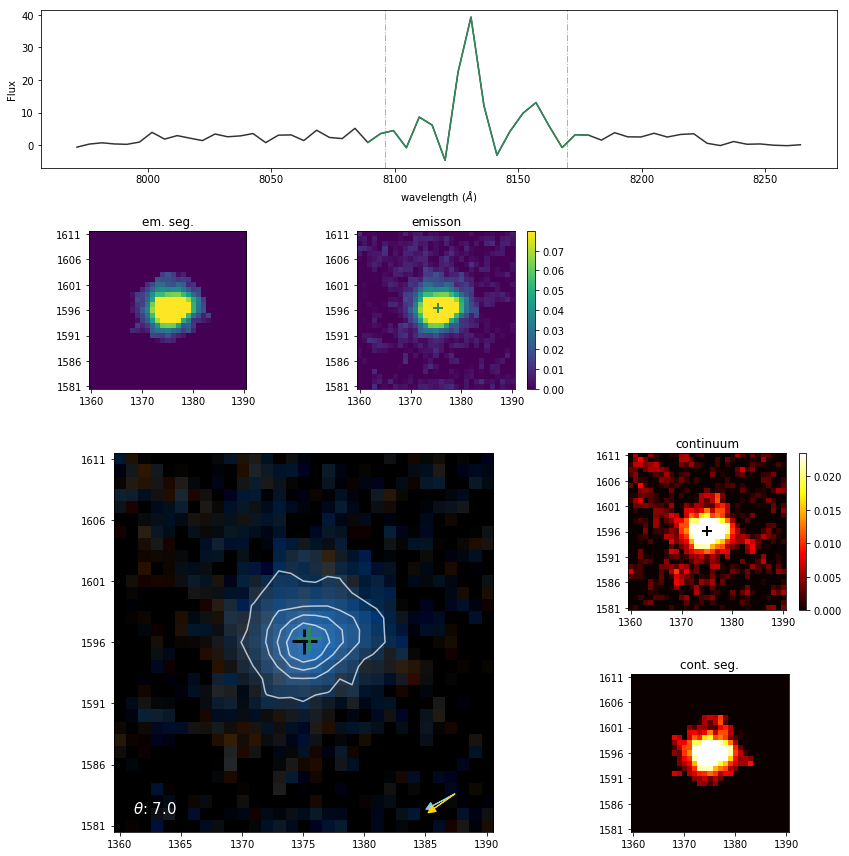

In [28]:
Datacube.centroid_analysis(num=1638, centroid_type='ISO2')

optimal aperture:2.7
PA: 116.230,  Cluster-centric angle: -121.330


(122.44030034032818, 1.1557452211487564, 411.9024059957165)

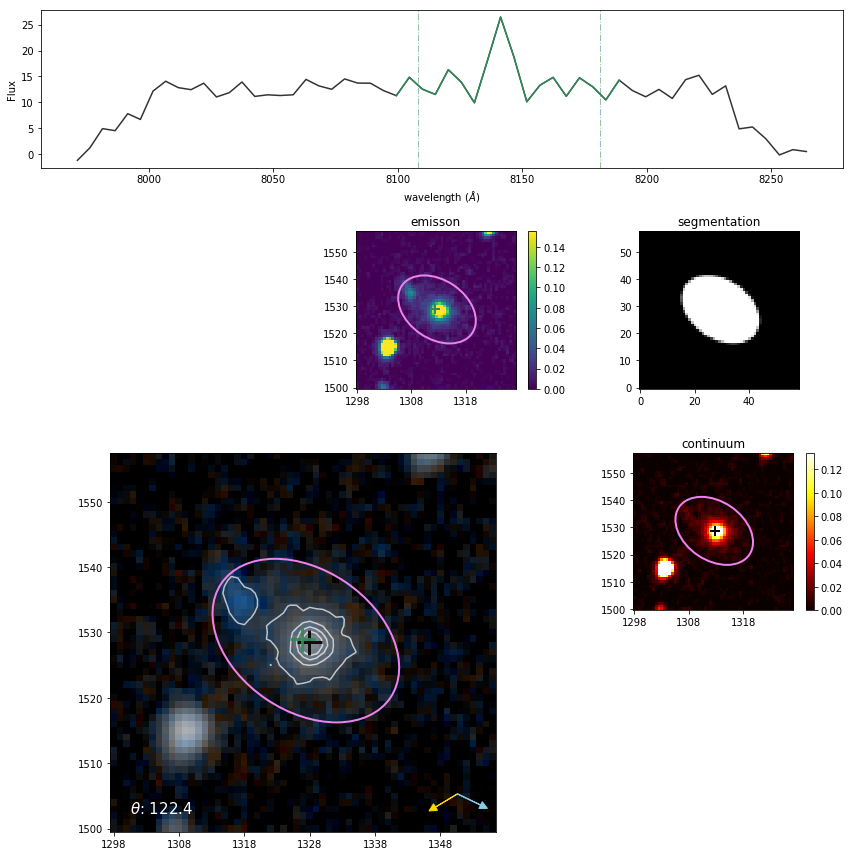

In [45]:
Datacube.centroid_analysis(num=1686, centroid_type='APER')

PA: 53.918,  Cluster-centric angle: -121.330


(175.2478637617092, 0.16937908823090944, 411.9024059957165)

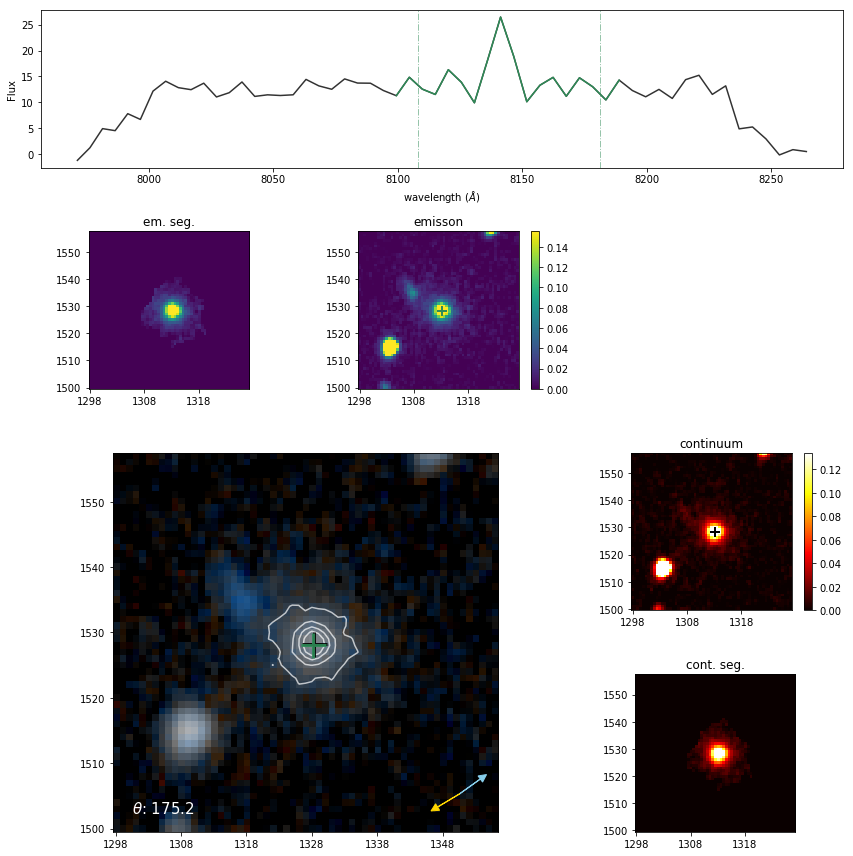

In [3]:
Datacube.centroid_analysis(num=1686, centroid_type='ISO2')

In [3]:
Datacube.centroid_analysis_all(centroid_type='APER')

#EL-1
optimal aperture:4.0
PA: -172.328,  Cluster-centric angle: 25.333
#EL-2
optimal aperture:4.5
Unable to compute centroid! Error raised.
#EL-3
optimal aperture:3.8
PA: 16.118,  Cluster-centric angle: -2.808
#EL-4
optimal aperture:2.8
PA: 42.073,  Cluster-centric angle: 29.535
#EL-5
optimal aperture:2.5
PA: -74.609,  Cluster-centric angle: -26.413
#EL-6
optimal aperture:2.2
PA: 155.604,  Cluster-centric angle: -13.375
#EL-7
optimal aperture:2.2
PA: -147.751,  Cluster-centric angle: 31.285
#EL-8
optimal aperture:2.2
PA: 67.760,  Cluster-centric angle: -20.301
#EL-9
optimal aperture:1.8
PA: 88.002,  Cluster-centric angle: 7.640
#EL-10
optimal aperture:2.2
PA: 42.909,  Cluster-centric angle: -17.402
#EL-11
optimal aperture:2.8
PA: 54.270,  Cluster-centric angle: 34.516
#EL-12
optimal aperture:2.6
PA: -170.084,  Cluster-centric angle: 33.398
#EL-13
optimal aperture:2.1
PA: 8.901,  Cluster-centric angle: 8.257
#EL-14
optimal aperture:2.1
PA: 83.841,  Cluster-centric angle: 15.200
#EL-15


PA: -142.853,  Cluster-centric angle: -32.196
#EL-127
optimal aperture:2.1
PA: 153.932,  Cluster-centric angle: 25.075
#EL-128
optimal aperture:1.8
PA: 40.738,  Cluster-centric angle: 24.329
#EL-129
optimal aperture:2.4
PA: 120.967,  Cluster-centric angle: -34.105
#EL-130
optimal aperture:1.7
PA: -70.160,  Cluster-centric angle: -33.178
#EL-131
optimal aperture:1.8
PA: 23.051,  Cluster-centric angle: 4.078
#EL-132
optimal aperture:2.0
PA: 134.363,  Cluster-centric angle: -41.883
#EL-133
optimal aperture:2.1
PA: 117.440,  Cluster-centric angle: 17.819
#EL-134
optimal aperture:1.9
PA: 79.819,  Cluster-centric angle: -38.989
#EL-135
optimal aperture:2.0
PA: 75.608,  Cluster-centric angle: -5.787
#EL-136
optimal aperture:1.8
PA: -39.649,  Cluster-centric angle: -38.776
#EL-137
optimal aperture:2.1
PA: 133.763,  Cluster-centric angle: 18.287
#EL-138
optimal aperture:2.0
PA: 178.066,  Cluster-centric angle: -15.378
#EL-139
optimal aperture:2.0
PA: -79.990,  Cluster-centric angle: -15.000
#EL

PA: 3.427,  Cluster-centric angle: -14.417
#EL-261
optimal aperture:3.0
PA: -172.954,  Cluster-centric angle: -45.326
#EL-262
optimal aperture:2.2
PA: -123.058,  Cluster-centric angle: -18.589
#EL-263
optimal aperture:3.3
PA: -136.564,  Cluster-centric angle: -27.408
#EL-264
optimal aperture:1.9
PA: -155.498,  Cluster-centric angle: -38.947
#EL-265
optimal aperture:1.3
PA: -12.397,  Cluster-centric angle: -40.016
#EL-266
optimal aperture:2.3
PA: 80.213,  Cluster-centric angle: 9.803
#EL-267
optimal aperture:3.7
PA: -38.281,  Cluster-centric angle: -44.361
#EL-268
optimal aperture:2.0
PA: -82.714,  Cluster-centric angle: 37.964
#EL-269
optimal aperture:2.0
PA: -132.103,  Cluster-centric angle: -16.243
#EL-270
optimal aperture:1.9
PA: -144.833,  Cluster-centric angle: -9.275
#EL-271
optimal aperture:1.6
PA: 23.437,  Cluster-centric angle: -24.584
#EL-272
optimal aperture:3.2
PA: 139.628,  Cluster-centric angle: -18.225
#EL-273
optimal aperture:1.9
PA: 26.145,  Cluster-centric angle: 5.74

optimal aperture:1.5
PA: 174.150,  Cluster-centric angle: 30.819
#EL-385
optimal aperture:3.4
PA: -17.997,  Cluster-centric angle: 29.689
#EL-386
optimal aperture:1.9
PA: -111.030,  Cluster-centric angle: 15.242
#EL-387
optimal aperture:2.3
PA: -128.157,  Cluster-centric angle: 42.465
#EL-388
optimal aperture:1.7
PA: 20.823,  Cluster-centric angle: 23.024
#EL-389
optimal aperture:2.2
PA: 133.393,  Cluster-centric angle: -22.229
#EL-390
optimal aperture:4.5
PA: 49.692,  Cluster-centric angle: 44.888
#EL-391
optimal aperture:3.9
PA: -145.391,  Cluster-centric angle: -43.434
#EL-392
optimal aperture:2.5
PA: -25.761,  Cluster-centric angle: 28.914
#EL-393
optimal aperture:1.9
PA: -24.288,  Cluster-centric angle: 2.391
#EL-394
optimal aperture:1.9
PA: -109.611,  Cluster-centric angle: -25.742
#EL-395
optimal aperture:2.0
PA: -161.467,  Cluster-centric angle: -49.061
#EL-396
optimal aperture:2.1
PA: -145.869,  Cluster-centric angle: 34.556
#EL-397
optimal aperture:2.4
PA: 53.761,  Cluster-ce

PA: -113.882,  Cluster-centric angle: -17.085
#EL-500
optimal aperture:2.0
PA: 132.296,  Cluster-centric angle: -10.910
#EL-501
optimal aperture:2.0
PA: -109.982,  Cluster-centric angle: -43.828
#EL-502
optimal aperture:2.1
PA: -136.004,  Cluster-centric angle: 37.413
#EL-503
optimal aperture:1.9
PA: -148.534,  Cluster-centric angle: -39.924
#EL-504
optimal aperture:1.9
PA: -123.364,  Cluster-centric angle: 13.575
#EL-505
optimal aperture:1.9
PA: 155.666,  Cluster-centric angle: 30.478
#EL-506
optimal aperture:3.0
PA: -101.584,  Cluster-centric angle: 12.038
#EL-507
optimal aperture:2.3
PA: 97.715,  Cluster-centric angle: 38.719
#EL-508
optimal aperture:2.1
PA: 143.315,  Cluster-centric angle: 22.120
#EL-509
optimal aperture:1.4
PA: 152.754,  Cluster-centric angle: 40.526
#EL-510
optimal aperture:1.9
PA: -27.516,  Cluster-centric angle: -18.811
#EL-511
optimal aperture:1.9
PA: -169.596,  Cluster-centric angle: 2.339
#EL-512
optimal aperture:2.4
PA: 169.302,  Cluster-centric angle: -48.

PA: 76.760,  Cluster-centric angle: 42.519
#EL-619
optimal aperture:2.5
PA: -101.424,  Cluster-centric angle: 33.713
#EL-620
optimal aperture:1.5
PA: -85.522,  Cluster-centric angle: -6.725
#EL-621
optimal aperture:1.9
PA: 53.035,  Cluster-centric angle: 10.534
#EL-622
optimal aperture:2.2
PA: 60.137,  Cluster-centric angle: -2.337
#EL-623
optimal aperture:1.8
PA: 13.383,  Cluster-centric angle: -48.985
#EL-624
optimal aperture:1.8
PA: 68.918,  Cluster-centric angle: 17.438
#EL-625
optimal aperture:3.1
PA: -48.364,  Cluster-centric angle: 50.577
#EL-626
optimal aperture:1.8
PA: 83.960,  Cluster-centric angle: -38.117
#EL-627
optimal aperture:2.1
PA: 61.258,  Cluster-centric angle: -50.317
#EL-628
optimal aperture:2.6
PA: 133.001,  Cluster-centric angle: -28.633
#EL-629
optimal aperture:2.2
PA: 44.751,  Cluster-centric angle: 28.110
#EL-630
optimal aperture:1.9
PA: -152.116,  Cluster-centric angle: 54.769
#EL-631
optimal aperture:2.1
PA: 95.500,  Cluster-centric angle: -27.799
#EL-632
o

PA: 169.868,  Cluster-centric angle: -5.278
#EL-732
optimal aperture:2.6
PA: -148.997,  Cluster-centric angle: -22.174
#EL-733
optimal aperture:2.1
PA: -31.790,  Cluster-centric angle: -49.596
#EL-734
optimal aperture:2.1
PA: -29.860,  Cluster-centric angle: -50.765
#EL-735
optimal aperture:2.2
PA: -66.828,  Cluster-centric angle: 56.689
#EL-736
optimal aperture:2.1
PA: 100.030,  Cluster-centric angle: 17.992
#EL-737
optimal aperture:2.6
PA: -22.895,  Cluster-centric angle: 13.601
#EL-738
optimal aperture:2.0
PA: -176.043,  Cluster-centric angle: -22.012
#EL-739
optimal aperture:2.1
PA: 89.678,  Cluster-centric angle: -51.397
#EL-740
optimal aperture:2.2
PA: -153.871,  Cluster-centric angle: 33.308
#EL-741
optimal aperture:1.8
PA: -31.605,  Cluster-centric angle: -62.676
#EL-742
optimal aperture:2.1
PA: -65.464,  Cluster-centric angle: -61.533
#EL-743
optimal aperture:2.1
PA: 85.284,  Cluster-centric angle: -59.343
#EL-744
optimal aperture:2.2
PA: -21.765,  Cluster-centric angle: 60.35

optimal aperture:2.2
PA: -144.441,  Cluster-centric angle: -48.912
#EL-863
optimal aperture:2.7
PA: -138.858,  Cluster-centric angle: -53.316
#EL-864
optimal aperture:2.5
PA: -32.389,  Cluster-centric angle: 43.275
#EL-865
optimal aperture:2.5
PA: 112.495,  Cluster-centric angle: 65.740
#EL-866
optimal aperture:2.0
PA: -49.141,  Cluster-centric angle: 53.867
#EL-867
optimal aperture:2.6
PA: 96.866,  Cluster-centric angle: -67.118
#EL-868
optimal aperture:2.0
PA: 125.854,  Cluster-centric angle: -60.735
#EL-869
optimal aperture:3.0
PA: -126.993,  Cluster-centric angle: -58.588
#EL-870
optimal aperture:3.1
PA: 31.497,  Cluster-centric angle: -21.060
#EL-871
optimal aperture:2.0
PA: -61.788,  Cluster-centric angle: -31.071
#EL-872
optimal aperture:2.3
PA: -103.525,  Cluster-centric angle: -41.045
#EL-873
optimal aperture:2.0
PA: 108.120,  Cluster-centric angle: 26.203
#EL-874
optimal aperture:1.9
PA: -96.179,  Cluster-centric angle: -19.103
#EL-875
optimal aperture:2.5
PA: -116.411,  Clus

optimal aperture:3.3
PA: 43.601,  Cluster-centric angle: 64.785
#EL-990
optimal aperture:2.3
PA: 6.680,  Cluster-centric angle: -65.960
#EL-991
optimal aperture:3.6
PA: 164.023,  Cluster-centric angle: -45.191
#EL-992
optimal aperture:2.6
PA: 108.781,  Cluster-centric angle: -55.967
#EL-993
optimal aperture:2.4
PA: -87.562,  Cluster-centric angle: -15.648
#EL-994
optimal aperture:2.0
PA: 24.317,  Cluster-centric angle: -73.428
#EL-995
optimal aperture:2.6
PA: 83.764,  Cluster-centric angle: -72.622
#EL-996
optimal aperture:2.1
PA: 171.650,  Cluster-centric angle: 59.185
#EL-997
optimal aperture:2.5
PA: 111.241,  Cluster-centric angle: 73.103
#EL-998
optimal aperture:3.3
PA: 90.127,  Cluster-centric angle: 70.202
#EL-999
optimal aperture:2.0
PA: 43.191,  Cluster-centric angle: -49.617
#EL-1000
optimal aperture:2.1
PA: 21.745,  Cluster-centric angle: 69.341
#EL-1001
optimal aperture:1.8
PA: 131.421,  Cluster-centric angle: -24.638
#EL-1002
optimal aperture:2.0
PA: 109.170,  Cluster-centr

optimal aperture:3.0
PA: -128.257,  Cluster-centric angle: -91.822
#EL-1104
optimal aperture:2.1
PA: 142.833,  Cluster-centric angle: -92.519
#EL-1105
optimal aperture:2.1
PA: -79.862,  Cluster-centric angle: -105.493
#EL-1106
optimal aperture:1.7
PA: -45.412,  Cluster-centric angle: -90.586
#EL-1107
optimal aperture:2.5
PA: -174.374,  Cluster-centric angle: 125.968
#EL-1108
optimal aperture:2.6
PA: -73.734,  Cluster-centric angle: 96.942
#EL-1109
optimal aperture:2.0
PA: 106.244,  Cluster-centric angle: 87.462
#EL-1110
optimal aperture:2.5
PA: 155.393,  Cluster-centric angle: 94.607
#EL-1111
optimal aperture:2.8
PA: 134.225,  Cluster-centric angle: 91.264
#EL-1112
optimal aperture:2.0
PA: 93.483,  Cluster-centric angle: 93.921
#EL-1113
optimal aperture:1.9
PA: -23.120,  Cluster-centric angle: 90.685
#EL-1114
optimal aperture:3.7
PA: -69.000,  Cluster-centric angle: 90.843
#EL-1115
optimal aperture:2.5
PA: -93.233,  Cluster-centric angle: -136.700
#EL-1116
optimal aperture:2.4
PA: -172

PA: 28.327,  Cluster-centric angle: 149.904
#EL-1226
optimal aperture:1.9
PA: 44.683,  Cluster-centric angle: -137.502
#EL-1227
optimal aperture:1.9
PA: 176.268,  Cluster-centric angle: 166.734
#EL-1228
optimal aperture:1.8
PA: -41.670,  Cluster-centric angle: 133.353
#EL-1229
optimal aperture:2.2
PA: 125.439,  Cluster-centric angle: -130.392
#EL-1230
optimal aperture:1.8
PA: -172.984,  Cluster-centric angle: -170.768
#EL-1231
optimal aperture:2.7
PA: 31.736,  Cluster-centric angle: 149.783
#EL-1232
optimal aperture:2.2
PA: 65.446,  Cluster-centric angle: 125.040
#EL-1233
optimal aperture:2.5
PA: 133.924,  Cluster-centric angle: -131.981
#EL-1234
optimal aperture:1.8
PA: -124.904,  Cluster-centric angle: 133.715
#EL-1235
optimal aperture:3.3
PA: -95.103,  Cluster-centric angle: 129.716
#EL-1236
optimal aperture:1.9
PA: -13.143,  Cluster-centric angle: 126.172
#EL-1237
optimal aperture:2.4
PA: 165.524,  Cluster-centric angle: -155.295
#EL-1238
optimal aperture:1.8
PA: 12.867,  Cluster-c

optimal aperture:2.3
PA: 169.481,  Cluster-centric angle: -128.780
#EL-1356
optimal aperture:3.3
PA: 43.735,  Cluster-centric angle: 120.811
#EL-1357
optimal aperture:2.3
PA: -33.687,  Cluster-centric angle: 138.504
#EL-1358
optimal aperture:3.2
PA: 100.528,  Cluster-centric angle: 143.123
#EL-1359
optimal aperture:1.8
PA: -164.553,  Cluster-centric angle: -123.535
#EL-1360
optimal aperture:3.1
PA: -44.995,  Cluster-centric angle: 173.130
#EL-1361
optimal aperture:2.2
PA: 87.553,  Cluster-centric angle: -117.285
#EL-1362
optimal aperture:1.8
PA: -41.206,  Cluster-centric angle: 121.940
#EL-1363
optimal aperture:1.9
PA: -107.139,  Cluster-centric angle: -135.830
#EL-1364
optimal aperture:3.9
PA: -168.033,  Cluster-centric angle: -115.794
#EL-1365
optimal aperture:3.6
PA: 175.288,  Cluster-centric angle: 122.800
#EL-1366
optimal aperture:2.9
PA: 30.809,  Cluster-centric angle: -146.021
#EL-1367
optimal aperture:1.6
PA: -148.271,  Cluster-centric angle: 137.969
#EL-1368
optimal aperture:1

PA: -29.429,  Cluster-centric angle: 119.294
#EL-1481
optimal aperture:2.2
PA: 162.962,  Cluster-centric angle: -125.050
#EL-1482
optimal aperture:2.4
PA: -118.248,  Cluster-centric angle: 116.637
#EL-1483
optimal aperture:1.8
PA: -94.739,  Cluster-centric angle: 108.501
#EL-1484
optimal aperture:1.8
PA: 61.062,  Cluster-centric angle: -169.127
#EL-1485
optimal aperture:2.5
PA: 171.042,  Cluster-centric angle: -145.433
#EL-1486
optimal aperture:2.5
PA: 127.967,  Cluster-centric angle: 126.237
#EL-1487
optimal aperture:2.6
PA: -129.309,  Cluster-centric angle: -116.199
#EL-1488
optimal aperture:3.0
PA: 126.874,  Cluster-centric angle: -116.094
#EL-1489
optimal aperture:3.8
PA: 100.429,  Cluster-centric angle: 120.169
#EL-1490
optimal aperture:2.5
PA: -114.875,  Cluster-centric angle: 161.741
#EL-1491
optimal aperture:2.5
PA: -152.910,  Cluster-centric angle: 119.311
#EL-1492
optimal aperture:3.6
PA: -14.555,  Cluster-centric angle: 148.304
#EL-1493
optimal aperture:2.1
PA: -154.083,  Cl

optimal aperture:1.8
PA: -87.805,  Cluster-centric angle: 113.605
#EL-1603
optimal aperture:1.9
PA: -38.309,  Cluster-centric angle: -134.276
#EL-1604
optimal aperture:2.1
PA: -168.002,  Cluster-centric angle: -116.326
#EL-1605
optimal aperture:2.4
PA: -161.427,  Cluster-centric angle: -110.147
#EL-1606
optimal aperture:2.1
PA: -176.950,  Cluster-centric angle: 111.898
#EL-1607
optimal aperture:2.4
PA: 139.977,  Cluster-centric angle: -121.552
#EL-1608
optimal aperture:2.1
PA: -50.488,  Cluster-centric angle: 167.206
#EL-1609
optimal aperture:2.0
PA: 115.406,  Cluster-centric angle: -123.592
#EL-1610
optimal aperture:2.1
PA: 83.442,  Cluster-centric angle: -140.555
#EL-1611
optimal aperture:1.8
PA: -8.339,  Cluster-centric angle: 111.284
#EL-1612
optimal aperture:1.9
PA: -133.795,  Cluster-centric angle: -148.950
#EL-1613
optimal aperture:2.3
PA: 131.250,  Cluster-centric angle: 111.668
#EL-1614
optimal aperture:2.1
PA: -40.866,  Cluster-centric angle: 125.413
#EL-1615
optimal aperture

PA: -167.089,  Cluster-centric angle: -113.864
#EL-1715
optimal aperture:1.8
PA: -3.881,  Cluster-centric angle: -105.529
#EL-1716
optimal aperture:2.0
PA: 64.366,  Cluster-centric angle: 119.425
#EL-1717
optimal aperture:2.4
PA: 29.243,  Cluster-centric angle: 53.065
#EL-1718
optimal aperture:1.8
PA: 31.814,  Cluster-centric angle: -105.780
#EL-1719
optimal aperture:2.2
PA: 32.516,  Cluster-centric angle: -140.600
#EL-1720
optimal aperture:1.8
PA: -118.427,  Cluster-centric angle: -112.714
#EL-1721
optimal aperture:1.8
PA: -157.826,  Cluster-centric angle: 110.621
#EL-1722
optimal aperture:1.8
PA: -33.893,  Cluster-centric angle: -122.699
#EL-1723
optimal aperture:1.8
PA: -117.845,  Cluster-centric angle: 102.286
#EL-1724
optimal aperture:2.0
PA: 68.810,  Cluster-centric angle: -106.072
#EL-1725
optimal aperture:2.1
PA: -83.663,  Cluster-centric angle: -108.885
#EL-1726
optimal aperture:2.0
PA: 76.240,  Cluster-centric angle: 103.284
#EL-1727
optimal aperture:2.5
PA: -10.740,  Cluster

optimal aperture:2.0
PA: -159.002,  Cluster-centric angle: 95.541
#EL-1840
optimal aperture:2.5
PA: 61.330,  Cluster-centric angle: -102.831
#EL-1841
optimal aperture:2.2
PA: 8.102,  Cluster-centric angle: -95.452
#EL-1842
optimal aperture:2.4
PA: -36.488,  Cluster-centric angle: -91.428
#EL-1843
optimal aperture:1.8
PA: -136.780,  Cluster-centric angle: -94.733
#EL-1844
optimal aperture:2.1
PA: 13.985,  Cluster-centric angle: -96.708
#EL-1845
optimal aperture:3.0
PA: -75.911,  Cluster-centric angle: 102.115
#EL-1846
optimal aperture:2.5
PA: -110.426,  Cluster-centric angle: 126.515
#EL-1847
optimal aperture:2.5
PA: -101.007,  Cluster-centric angle: -93.906
#EL-1848
optimal aperture:2.7
PA: -45.831,  Cluster-centric angle: 110.675
#EL-1849
optimal aperture:2.4
PA: -80.348,  Cluster-centric angle: -104.603
#EL-1850
optimal aperture:3.3
PA: 179.871,  Cluster-centric angle: -95.155
#EL-1851
optimal aperture:2.0
PA: -129.149,  Cluster-centric angle: -94.446
#EL-1852
optimal aperture:2.2
PA

optimal aperture:2.1
PA: 32.629,  Cluster-centric angle: -138.201
#EL-1963
optimal aperture:2.0
PA: -89.934,  Cluster-centric angle: -85.424
#EL-1964
optimal aperture:1.8
PA: -170.330,  Cluster-centric angle: -84.184
#EL-1965
optimal aperture:1.8
PA: -66.333,  Cluster-centric angle: 78.557
#EL-1966
optimal aperture:2.3
PA: 122.131,  Cluster-centric angle: -82.847
#EL-1967
optimal aperture:2.4
PA: 19.124,  Cluster-centric angle: -83.639
#EL-1968
optimal aperture:2.1
PA: 53.013,  Cluster-centric angle: -84.394
#EL-1969
optimal aperture:2.1
PA: -38.020,  Cluster-centric angle: -76.774
#EL-1970
optimal aperture:3.7
PA: -150.149,  Cluster-centric angle: -83.616
#EL-1971
optimal aperture:3.3
PA: -38.071,  Cluster-centric angle: -80.256
#EL-1972
optimal aperture:1.9
PA: 18.070,  Cluster-centric angle: -70.782
#EL-1973
optimal aperture:1.8
PA: -98.633,  Cluster-centric angle: -80.986
#EL-1974
optimal aperture:2.4
PA: -111.197,  Cluster-centric angle: 54.830
#EL-1975
optimal aperture:2.5
PA: 71

optimal aperture:2.1
PA: 50.663,  Cluster-centric angle: -13.510
#EL-2086
optimal aperture:2.0
PA: 174.664,  Cluster-centric angle: -75.229
#EL-2087
optimal aperture:2.3
PA: 161.407,  Cluster-centric angle: -77.044
#EL-2088
optimal aperture:1.9
PA: -18.185,  Cluster-centric angle: 60.034
#EL-2089
optimal aperture:2.1
PA: -176.802,  Cluster-centric angle: -124.684
#EL-2090
optimal aperture:2.0
PA: 126.941,  Cluster-centric angle: 52.030
#EL-2091
optimal aperture:2.8
PA: 119.362,  Cluster-centric angle: 76.571
#EL-2092
optimal aperture:1.8
PA: -162.268,  Cluster-centric angle: 74.853
#EL-2093
optimal aperture:2.3
PA: 131.425,  Cluster-centric angle: 60.366
#EL-2094
optimal aperture:2.0
PA: 112.475,  Cluster-centric angle: -76.934
#EL-2095
optimal aperture:1.9
PA: -103.601,  Cluster-centric angle: -172.298
#EL-2096
optimal aperture:2.4
PA: 56.141,  Cluster-centric angle: 33.740
#EL-2097
optimal aperture:2.0
PA: -102.713,  Cluster-centric angle: 51.515
#EL-2098
optimal aperture:1.9
PA: 152

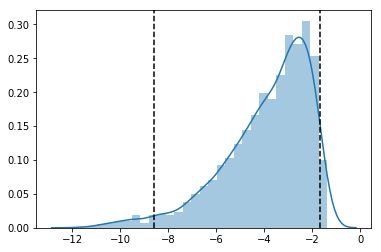

In [15]:
import seaborn as sns
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

mag = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
mag_no_nan = pd.Series(-2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])).dropna()
mag_cut = (np.percentile(mag_no_nan, 2.5), np.percentile(mag_no_nan, 97.5))

np.sum((mag_no_nan<mag_cut[1])&(mag_no_nan>mag_cut[0]))
sns.distplot(mag_no_nan)
plt.axvline(mag_cut[0],color='k',ls='--')
plt.axvline(mag_cut[1],color='k',ls='--')

In [48]:
Datacube.construct_control(snr_control=5, mag_per=(2.5,97.5),bootstraped=True)

Control Sample : n=1834
Bootsrap sample: 20
Bootsrap sample: 40
Bootsrap sample: 60
Bootsrap sample: 80
Bootsrap sample: 100


In [37]:
ind_v = Num_v-1
Datacube.diff_angles_v = Datacube.diff_angles[ind_v]
Datacube.diff_centroids_v = Datacube.diff_centroids[ind_v]
Datacube.dist_clus_cens_v = Datacube.dist_clus_cens[ind_v]

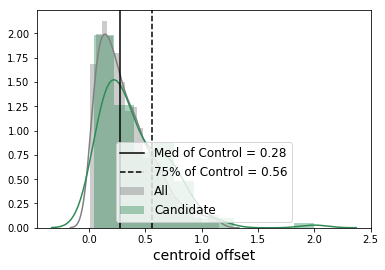

In [93]:
#ISO2
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c)

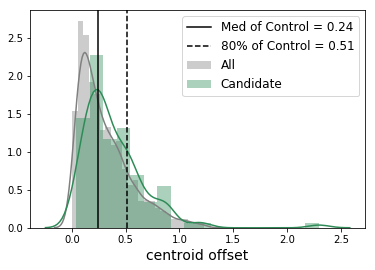

In [49]:
#APER
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c)

# of offset > 50% : 70
# of offset > 50% : 33


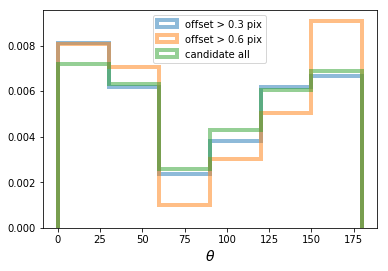

In [109]:
#ISO2
plt.figure(figsize=(6,4))
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.8], b=7)

# of offset > 50% : 73
# of offset > 75% : 38


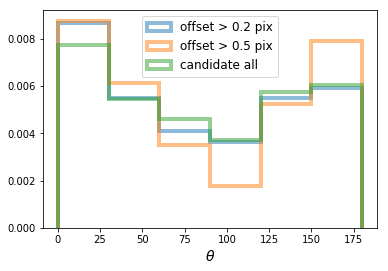

In [50]:
#APER iter
plt.figure(figsize=(6,4))
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.75], b=7)

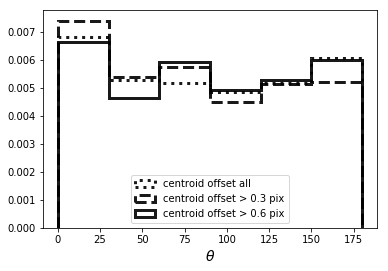

In [106]:
#ISO2
plt.figure(figsize=(6,4))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.8])

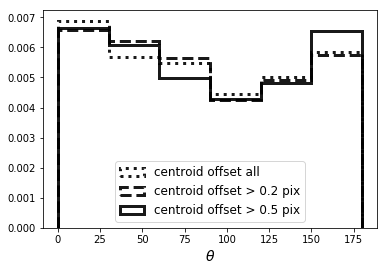

In [51]:
#APER iter
plt.figure(figsize=(6,4))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.8])

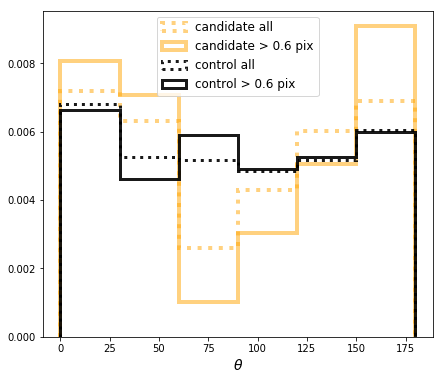

In [117]:
# ISO
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=0.8, b=7)

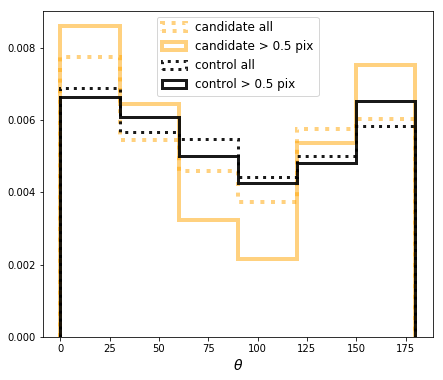

In [52]:
# APER iter
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=0.8, b=7)

In [70]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#ISO2
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,80)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

Ks_2sampResult(statistic=0.08886462882096069, pvalue=0.6634273100624627)
Ks_2sampResult(statistic=0.13607464288663196, pvalue=0.5973017082782814)
Ks_2sampResult(statistic=0.1278615852851661, pvalue=0.6342492419771127)
Anderson_ksampResult(statistic=0.6370935926343108, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.1812924623554932)
Anderson_ksampResult(statistic=0.33400100932169907, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.246646478153571)


In [58]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#APER iter
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,80)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

K-S: p-value=0.419
K-S: p-value=0.580
K-S: p-value=0.560
Anderson_ksampResult(statistic=-0.2599725062964727, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.4570168209828973)
Anderson_ksampResult(statistic=0.062042995063830576, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.3264033200228465)


In [71]:
import pandas as pd
df = pd.DataFrame({"diff_angle":np.concatenate([Datacube.diff_angles_v, Datacube.diff_angles_c]),
                 "diff_centroid":np.concatenate([Datacube.diff_centroids_v, Datacube.diff_centroids_c]),
                 "type":np.concatenate([['v']*len(Datacube.diff_centroids_v), ['c']*len(Datacube.diff_centroids_c)])})
df.to_csv('./A2390C/centroid_analysis_A2390C_iso.csv',sep=',',index=None)

## 6. Combined Results

In [72]:
df1 = pd.read_csv("./A2390C/centroid_analysis_A2390C_iso.csv")
df2 = pd.read_csv("./A2465C/centroid_analysis_A2465C_iso.csv")
Tab = pd.concat([df1, df2])
diff_centroid_v_all = Tab.diff_centroid[Tab.type=='v']
diff_centroid_c_all = Tab.diff_centroid[Tab.type=='c']
diff_angle_v_all = Tab.diff_angle[Tab.type=='v']
diff_angle_c_all = Tab.diff_angle[Tab.type=='c']

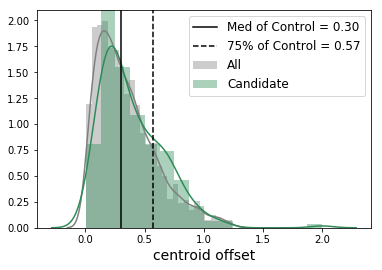

In [110]:
draw_centroid_offset(diff_centroid_v_all, diff_centroid_c_all)

# of offset > 50% : 120
# of offset > 50% : 58


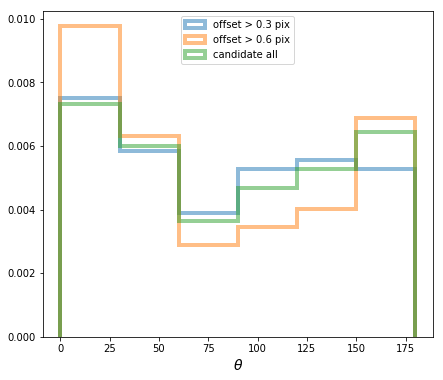

In [112]:
# ISO
plt.figure(figsize=(7,6))
draw_angle_candidate(diff_angle_v_all, diff_centroid_v_all,diff_centroid_c_all, crit=[0.5, 0.8], b=7)

126
62


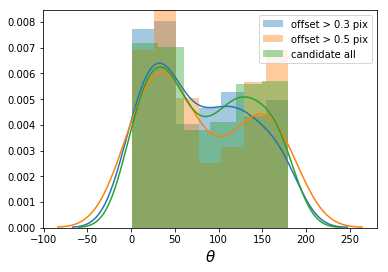

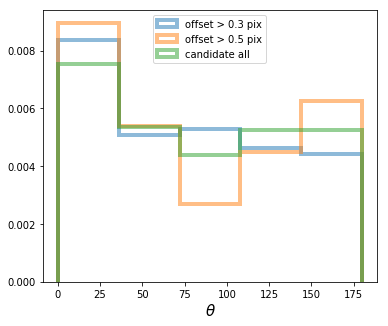

In [42]:
# APER iter
plt.figure(figsize=(7,6))
draw_angle_candidate(diff_angle_v_all, diff_centroid_v_all,diff_centroid_c_all, crit=[0.5, 0.8], b=7)

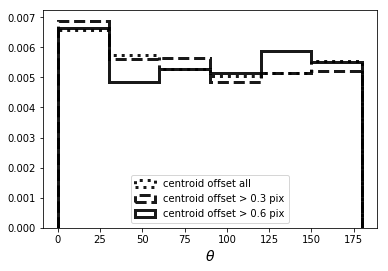

In [113]:
#ISO
plt.figure(figsize=(6,4))
draw_angle_control(diff_angle_c_all, diff_centroid_c_all, crit=[0.5,0.8])

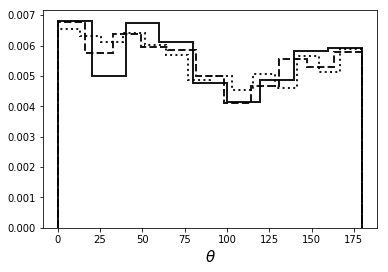

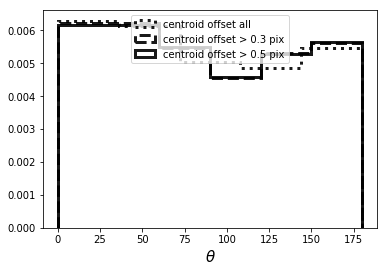

In [44]:
#APER iter
plt.figure(figsize=(6,4))
draw_angle_control(diff_angle_c_all, diff_centroid_c_all, crit=[0.5,0.8])

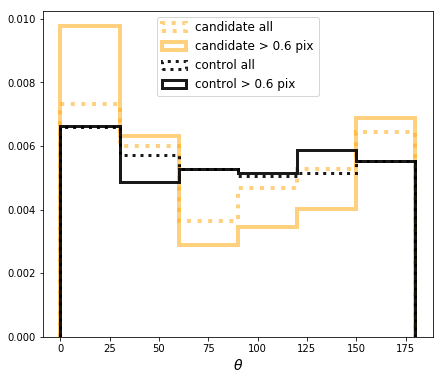

In [118]:
# ISO
plt.figure(figsize=(7,6))
draw_angle_compare(diff_angle_v_all, diff_centroid_v_all, 
                   diff_angle_c_all, diff_centroid_c_all, crit=0.8, b=7)

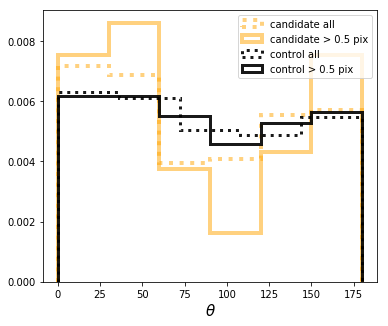

In [62]:
# Aper iter
plt.figure(figsize=(7,6))
draw_angle_compare(diff_angle_v_all, diff_centroid_v_all, 
                   diff_angle_c_all, diff_centroid_c_all, crit=0.8, b=7)

In [77]:
#ISO2
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,80)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

Ks_2sampResult(statistic=0.05163817663817666, pvalue=0.9231400621990901)
Ks_2sampResult(statistic=0.13809159331547394, pvalue=0.17890803954332196)
Ks_2sampResult(statistic=0.14315924825852938, pvalue=0.1250901540761855)
Anderson_ksampResult(statistic=0.1850874455189387, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.2874091839704046)
Anderson_ksampResult(statistic=0.2300998986673846, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.2743914684522553)


In [16]:
#Aper iter
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,80)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

NameError: name 'diff_angle_v_all' is not defined